# Lending Club Case Study
by : M.PHANEESHWAR 



In [1]:
#Importing the required python libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

Let us frist check the type of encoding used in the loan.csv file before we proceed. This encoding type can be found using 'CHARDET' module which analyses the first few thousand rows and detects the suitable encoding with level of confidence.

In [2]:
import chardet
with open("loan.csv", 'rb') as rawdata:
    result = chardet.detect(rawdata.read(5000))

# check what the character encoding might be
print(result)

{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}


even though the encoding suggested by the 'CHARDET' Module is 'ASCII'  but for some reason it doesnt seem to work in my system for this loan.csv file. So going ahead with standard encoding 'Unicode-escape'

## Data Understanding

In [3]:
# lets read the laon.csv file with the PANDAS library 
df = pd.read_csv('C:/Users/Eeshwar/Desktop/deep learning/Data Visualization_Case+Study+Notebook/Case Study Notebook/loan.csv',encoding = 'unicode_escape')

In [4]:
# lets check the first five rows of the DataFrame to get an idea about it
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [5]:
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [7]:
# shape of the dataset
df.shape  

(39717, 111)

## Filter Data Drop All the duplicates from the dataframe

In [8]:
# Drop duplicates if any
df.drop_duplicates(subset=None, keep='first', inplace=True) 

In [9]:
# shape of the dataset
df.shape

(39717, 111)

# Data Cleaning

## Fix Rows, Cols, And Missing Values

In [10]:
# Calculate the percentage of missing values
missing_values = round (100* (df.isnull().sum() / len(df)),2)

In [11]:
# Checking out columns that having missing value percentage greater than 50%
missing_values [missing_values > 50].index

Index(['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d',
       'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
       'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi',
       'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct',
       'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl',
       'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl',
       'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
       'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m',
       'num_t

In [12]:
cols_missing_values = list(missing_values[missing_values >= 50].index)
print(cols_missing_values)

['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'tot_hi_cred

In [13]:
# drop all the columns having missing values greater 50%
df.drop(cols_missing_values,inplace = True, axis = 1)

In [14]:
df.shape

(39717, 54)

In [15]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39717 entries, 0 to 39716
Data columns (total 54 columns):
id                            39717 non-null int64
member_id                     39717 non-null int64
loan_amnt                     39717 non-null int64
funded_amnt                   39717 non-null int64
funded_amnt_inv               39717 non-null float64
term                          39717 non-null object
int_rate                      39717 non-null object
installment                   39717 non-null float64
grade                         39717 non-null object
sub_grade                     39717 non-null object
emp_title                     37258 non-null object
emp_length                    38642 non-null object
home_ownership                39717 non-null object
annual_inc                    39717 non-null float64
verification_status           39717 non-null object
issue_d                       39717 non-null object
loan_status                   39717 non-null object
pymnt_pl

In [17]:
missing_values = round (100* (df.isnull().sum() / len(df)),2)
missing_values[missing_values > 0]

emp_title                      6.19
emp_length                     2.71
desc                          32.58
title                          0.03
revol_util                     0.13
last_pymnt_d                   0.18
last_credit_pull_d             0.01
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
pub_rec_bankruptcies           1.75
tax_liens                      0.10
dtype: float64

In [18]:
# Drop Desc has it has got 32% missing values
df.drop('desc',inplace = True,axis = 1)

In [19]:
df.pub_rec_bankruptcies.value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [20]:
# Replace the missing values since the percentage of the missing values in this col is around 1.75%
df.pub_rec_bankruptcies.fillna(0,inplace=True)

In [21]:
# check if any values are missing
df.pub_rec_bankruptcies.isnull().sum()

0

In [22]:
# Replace missing values with mode value in emp_tile column
df.emp_title.fillna(df.emp_title.mode()[0],inplace=True)

In [23]:
missing_values = round (100* (df.isnull().sum() / len(df)),2)
missing_values[missing_values > 0]

emp_length                    2.71
title                         0.03
revol_util                    0.13
last_pymnt_d                  0.18
last_credit_pull_d            0.01
collections_12_mths_ex_med    0.14
chargeoff_within_12_mths      0.14
tax_liens                     0.10
dtype: float64

In [24]:
df.emp_length.unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

In [25]:
print(df.emp_length.mode())
df.emp_length.value_counts()

0    10+ years
dtype: object


10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

In [26]:
# Replace missing values with mode value
df.emp_length.fillna(df.emp_length.mode()[0],inplace = True)

In [27]:
missing_values = round (100* (df.isnull().sum() / len(df)),2)
missing_values[missing_values > 0]

title                         0.03
revol_util                    0.13
last_pymnt_d                  0.18
last_credit_pull_d            0.01
collections_12_mths_ex_med    0.14
chargeoff_within_12_mths      0.14
tax_liens                     0.10
dtype: float64

 Lets delete the remaining null  values in the respective columns

In [28]:
df = df[~df.title.isnull()]

In [29]:
df = df[~df.revol_util.isnull()]

In [30]:
df = df[~df.last_pymnt_d.isnull()]

In [31]:
df.last_credit_pull_d.fillna(df.last_credit_pull_d.mode()[0],inplace= True)

In [32]:
round (100* (df.isnull().sum() / len(df)),2)

id                            0.00
member_id                     0.00
loan_amnt                     0.00
funded_amnt                   0.00
funded_amnt_inv               0.00
term                          0.00
int_rate                      0.00
installment                   0.00
grade                         0.00
sub_grade                     0.00
emp_title                     0.00
emp_length                    0.00
home_ownership                0.00
annual_inc                    0.00
verification_status           0.00
issue_d                       0.00
loan_status                   0.00
pymnt_plan                    0.00
url                           0.00
purpose                       0.00
title                         0.00
zip_code                      0.00
addr_state                    0.00
dti                           0.00
delinq_2yrs                   0.00
earliest_cr_line              0.00
inq_last_6mths                0.00
open_acc                      0.00
pub_rec             

## Unwanted Columns for the Analysis

###### Delete the columns which has only one unique value in its column, as it would be useless for the analysis

In [33]:
df.nunique().sort_values()

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
application_type                  1
policy_code                       1
collections_12_mths_ex_med        1
initial_list_status               1
pymnt_plan                        1
term                              2
pub_rec_bankruptcies              3
verification_status               3
loan_status                       3
pub_rec                           5
home_ownership                    5
grade                             7
inq_last_6mths                    9
delinq_2yrs                      11
emp_length                       11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
last_pymnt_d                    101
last_credit_pull_d              106
int_rate                    

In [34]:
df.collections_12_mths_ex_med.unique()

array([ 0., nan])

In [35]:
df.policy_code.unique()

array([1], dtype=int64)

In [36]:
df.acc_now_delinq.unique()

array([0], dtype=int64)

In [37]:
df.chargeoff_within_12_mths.unique()

array([ 0., nan])

In [38]:
df.delinq_amnt.unique()

array([0], dtype=int64)

In [39]:
df.tax_liens.unique()

array([ 0., nan])

In [40]:
df.application_type.unique()

array(['INDIVIDUAL'], dtype=object)

In [41]:
df.initial_list_status.unique()

array(['f'], dtype=object)

In [42]:
df.pymnt_plan.unique()                        

array(['n'], dtype=object)

In [43]:
unwanted_cols = ['tax_liens','delinq_amnt','chargeoff_within_12_mths','acc_now_delinq','policy_code','collections_12_mths_ex_med','application_type','initial_list_status','pymnt_plan']

In [44]:
# Drop all the unwanted columns
df.drop(unwanted_cols,axis = 1,inplace = True)

In [45]:
df.nunique().sort_values()

term                           2
pub_rec_bankruptcies           3
loan_status                    3
verification_status            3
pub_rec                        5
home_ownership                 5
grade                          7
inq_last_6mths                 9
delinq_2yrs                   11
emp_length                    11
purpose                       14
sub_grade                     35
open_acc                      40
addr_state                    50
issue_d                       55
total_acc                     82
last_pymnt_d                 101
last_credit_pull_d           106
int_rate                     371
earliest_cr_line             526
zip_code                     823
loan_amnt                    884
funded_amnt                 1040
revol_util                  1089
out_prncp                   1137
out_prncp_inv               1138
total_rec_late_fee          1353
collection_recovery_fee     2592
dti                         2868
recoveries                  3977
annual_inc

In [46]:
df.nunique().sort_values()

term                           2
pub_rec_bankruptcies           3
loan_status                    3
verification_status            3
pub_rec                        5
home_ownership                 5
grade                          7
inq_last_6mths                 9
delinq_2yrs                   11
emp_length                    11
purpose                       14
sub_grade                     35
open_acc                      40
addr_state                    50
issue_d                       55
total_acc                     82
last_pymnt_d                 101
last_credit_pull_d           106
int_rate                     371
earliest_cr_line             526
zip_code                     823
loan_amnt                    884
funded_amnt                 1040
revol_util                  1089
out_prncp                   1137
out_prncp_inv               1138
total_rec_late_fee          1353
collection_recovery_fee     2592
dti                         2868
recoveries                  3977
annual_inc

## Standardise the Numbers and Text to Proper Formats

In [47]:
df.revol_util = df.revol_util.str.strip('%').astype(float)

In [48]:
df.int_rate = df.int_rate.str.strip('%').astype(float)

In [49]:
df.term = df.term.str.strip(' months').astype(float)

In [50]:
df = df.rename(columns={'int_rate':'int_rate %','revol_util':'revol_util %','term':'term months'})

In [51]:
df.last_pymnt_d = pd.to_datetime(df.last_pymnt_d, format='%b-%y')

In [52]:
df.issue_d = pd.to_datetime(df.issue_d, format='%b-%y')

In [53]:
df.earliest_cr_line = pd.to_datetime(df.earliest_cr_line, format='%b-%y')

In [54]:
df.last_credit_pull_d = pd.to_datetime(df.last_credit_pull_d, format = '%b-%y')

In [55]:
df.emp_title.unique()

array(['US Army', 'Ryder', 'AIR RESOURCES BOARD', ..., 'FiSite Research',
       'Squarewave Solutions, Ltd.', 'Evergreen Center'], dtype=object)

In [56]:
df.emp_title = df.emp_title.str.upper()

In [57]:
df.verification_status.unique()

array(['Verified', 'Source Verified', 'Not Verified'], dtype=object)

In [58]:
df.verification_status = df.verification_status.str.upper()

In [59]:
df.loan_status.unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

In [60]:
df.loan_status = df.loan_status.str.upper()

In [61]:
df.purpose.unique()

array(['credit_card', 'car', 'small_business', 'other', 'wedding',
       'debt_consolidation', 'home_improvement', 'major_purchase',
       'medical', 'moving', 'vacation', 'house', 'renewable_energy',
       'educational'], dtype=object)

In [62]:
df.purpose = df.purpose.str.upper()

In [63]:
df.title.value_counts()

Debt Consolidation               2180
Debt Consolidation Loan          1724
Personal Loan                     657
Consolidation                     515
debt consolidation                505
                                 ... 
Paying down school loan debt        1
Bills and Credit                    1
Lowering My Credit Card Bills       1
Got It                              1
Debt elimination                    1
Name: title, Length: 19556, dtype: int64

In [64]:
df.title = df.title.str.upper()

##### Incorrect Data : from the column Year we observe few outliers which should be removed

###### Outliers

In [65]:
df.last_pymnt_d.dt.year.unique()

array([2015, 2013, 2014, 2016, 2012, 2011, 2010, 2009, 2008], dtype=int64)

In [66]:
df.issue_d.dt.year.unique()

array([2011, 2010, 2009, 2008, 2007], dtype=int64)

In [67]:
df.last_credit_pull_d.dt.year.unique()

array([2016, 2013, 2014, 2012, 2015, 2011, 2010, 2007, 2009, 2008],
      dtype=int64)

In [68]:
df.earliest_cr_line.dt.year.unique()

array([1985, 1999, 2001, 1996, 2004, 2005, 2007, 1998, 1989, 2003, 1991,
       1993, 1997, 1983, 2002, 1984, 2006, 1987, 1981, 2000, 1994, 1995,
       1992, 1986, 1990, 1988, 1980, 2008, 1973, 1979, 1982, 1978, 1971,
       1972, 1970, 1969, 1975, 1976, 1977, 2062, 2068, 1974, 2064, 2067,
       2065, 2063, 2054, 2066, 2059, 2056, 2046, 2050, 2061], dtype=int64)

In [69]:
# These outliers should be removed
df.earliest_cr_line.dt.year.value_counts().tail(13).index

Int64Index([2068, 2067, 2066, 2063, 2065, 2064, 2062, 2054, 2061, 2056, 2046,
            2050, 2059],
           dtype='int64')

In [70]:
df = df[~(df.earliest_cr_line.dt.year > 2045)]

In [71]:
df.shape

(39499, 44)

In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39499 entries, 0 to 39716
Data columns (total 44 columns):
id                         39499 non-null int64
member_id                  39499 non-null int64
loan_amnt                  39499 non-null int64
funded_amnt                39499 non-null int64
funded_amnt_inv            39499 non-null float64
term months                39499 non-null float64
int_rate %                 39499 non-null float64
installment                39499 non-null float64
grade                      39499 non-null object
sub_grade                  39499 non-null object
emp_title                  39499 non-null object
emp_length                 39499 non-null object
home_ownership             39499 non-null object
annual_inc                 39499 non-null float64
verification_status        39499 non-null object
issue_d                    39499 non-null datetime64[ns]
loan_status                39499 non-null object
url                        39499 non-null object


## Over-Precision
#### To make sure the precision is within two decimals

In [73]:
df['total_pymnt'].value_counts().tail()

5627.546774     1
32897.190000    1
31624.045580    1
2885.006447     1
4608.000000     1
Name: total_pymnt, dtype: int64

In [74]:
df['total_pymnt'] = df.total_pymnt.apply(lambda x: round(x,2))

In [75]:
df.total_rec_late_fee.value_counts().tail()

29.914662    1
23.820000    1
29.908825    1
15.610000    1
47.307614    1
Name: total_rec_late_fee, dtype: int64

In [76]:
df.total_rec_late_fee = df.total_rec_late_fee.apply(lambda x:round(x,2)) 

In [77]:
df.collection_recovery_fee.value_counts().tail()

340.0000    1
6.9239      1
33.2896     1
9.6738      1
23.5530     1
Name: collection_recovery_fee, dtype: int64

In [78]:
df.collection_recovery_fee = df.collection_recovery_fee.apply(lambda x:round(x,2)) 

In [79]:
df.emp_length.unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years'],
      dtype=object)

In [80]:
emp_length_dictionary = { '< 1 year' : 0, '1 year' : 1, '3 years' : 3, '8 years' : 8, '9 years' : 9,
       '4 years' : 4, '5 years' : 5, '6 years' : 6, '2 years' : 2, '7 years' : 7, '10+ years' : 10 }

In [81]:
emp_length_dictionary

{'< 1 year': 0,
 '1 year': 1,
 '3 years': 3,
 '8 years': 8,
 '9 years': 9,
 '4 years': 4,
 '5 years': 5,
 '6 years': 6,
 '2 years': 2,
 '7 years': 7,
 '10+ years': 10}

In [82]:
df =  df.replace({"emp_length": emp_length_dictionary })

In [83]:
df.emp_length.value_counts()

10    9885
0     4550
2     4372
3     4082
4     3415
5     3262
1     3221
6     2219
7     1767
8     1473
9     1253
Name: emp_length, dtype: int64

## Data Analysis

In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39499 entries, 0 to 39716
Data columns (total 44 columns):
id                         39499 non-null int64
member_id                  39499 non-null int64
loan_amnt                  39499 non-null int64
funded_amnt                39499 non-null int64
funded_amnt_inv            39499 non-null float64
term months                39499 non-null float64
int_rate %                 39499 non-null float64
installment                39499 non-null float64
grade                      39499 non-null object
sub_grade                  39499 non-null object
emp_title                  39499 non-null object
emp_length                 39499 non-null int64
home_ownership             39499 non-null object
annual_inc                 39499 non-null float64
verification_status        39499 non-null object
issue_d                    39499 non-null datetime64[ns]
loan_status                39499 non-null object
url                        39499 non-null object
p

#### There are some variables in the Data Set which are not required for the analysis as there are few variables that state the custormers id info,state etc and there are few columns that state about custormer behaviour, which is not useful for this analysis, as these information will not be avaiable during the loan application

In [85]:
unwanted_analysis = ['id','url','member_id','title','zip_code','out_prncp_inv','addr_state','delinq_2yrs','earliest_cr_line','emp_title','inq_last_6mths','last_pymnt_amnt','last_pymnt_d','out_prncp','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries']
df.drop(unwanted_analysis,axis = 1,inplace = True)

In [86]:
df.shape

(39499, 25)

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39499 entries, 0 to 39716
Data columns (total 25 columns):
loan_amnt                  39499 non-null int64
funded_amnt                39499 non-null int64
funded_amnt_inv            39499 non-null float64
term months                39499 non-null float64
int_rate %                 39499 non-null float64
installment                39499 non-null float64
grade                      39499 non-null object
sub_grade                  39499 non-null object
emp_length                 39499 non-null int64
home_ownership             39499 non-null object
annual_inc                 39499 non-null float64
verification_status        39499 non-null object
issue_d                    39499 non-null datetime64[ns]
loan_status                39499 non-null object
purpose                    39499 non-null object
dti                        39499 non-null float64
open_acc                   39499 non-null int64
pub_rec                    39499 non-null int64


## Univariant And Segmented Analysis

In [88]:
def add_value_labels_plots(ax,size,spacing=5):
    
    plt.yticks(fontsize=size)
    plt.xticks(fontsize=size)
    
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.2f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',fontsize=size,                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.



In [89]:
def annotate_count_plots(plot,font = 10):
    bars = plot.patches # this stores diffrent patches of the plot
    half = int(len(bars)/2)
    left_bars = bars[:half]  # divide the two plots with left and right
    right_bars = bars[half:]
    
    # Calculation of Percentage that needed to be plotted on the top of the bar
    # And placing the the percentage value at gthe correct coordinate hence the below 
    # below code segment of code does placing the value in correct coordinate
    
    for left, right in zip(left_bars, right_bars):
        height_l = left.get_height() 
        height_r = right.get_height()
        total = height_l + height_r
        plot.text(left.get_x() + left.get_width()/2., height_l + 40, '{:.0%}'.format(height_l/total), ha="center",fontsize=font,fontweight='semibold')
        plot.text(right.get_x() + right.get_width()/2., height_r + 40, '{:.0%}'.format(height_r/total), ha="center",fontsize=font,fontweight='semibold')
        plot.set_yticklabels(labels=plot.get_yticklabels(),fontweight='semibold', fontsize=13)
        plot.set_xticklabels(labels=plot.get_xticklabels(),fontweight='semibold', fontsize=13)
    
    return plot        


        

In [90]:
def table(col):
    
    '''
    col: Column Name
    '''
    
    crosstb = pd.crosstab(df[col], df['loan_status'],margins=True)
    crosstb['Charged_off percentage'] = round(((100*crosstb.iloc[:,0])/crosstb['All']),3)
    crosstb = crosstb[0:-1]
    return crosstb

In [91]:
# Lets first create a function so that it will be east to call it for our future analysis.
def bivar(col,stacked= True):
    '''
    col     : Column Name
    stacked : True(default) for Stacked Bar
    '''
    # get dataframe from crosstab function
    plot_crosstb = table(col)
    
    linePlot = plot_crosstb[['Charged_off percentage']]      
    barPlot =  plot_crosstb.iloc[:,0:2]
    az = linePlot.plot(figsize=(20,8), marker='o',color = 'b')
    az2 = barPlot.plot(kind='bar',ax = az,rot=1,secondary_y=True,stacked=stacked)
    az.set_title(df[col].name.title()+' vs Charged off percentage',fontsize=20,weight="bold")
    az.set_xticklabels(az.get_xticklabels(), rotation=30, ha="right")
    az.set_xlabel(df[col].name.title(),fontsize=14)
    az.set_ylabel('Charged off percentage',color = 'b',fontsize=14)
    az2.set_ylabel('Loan Applications Count',color = 'r',fontsize=14)
    az2.set_xticklabels(az.get_xticklabels(), rotation=30, ha="right")
    plt.show()

loan_status,CHARGED OFF,CURRENT,FULLY PAID,All,Charged_off percentage
home_ownership,,,,,
OTHER,18,0,77,95,18.947
RENT,2777,418,15596,18791,14.778
OWN,432,82,2513,3027,14.272
MORTGAGE,2299,635,14649,17583,13.075
NONE,0,0,3,3,0.000


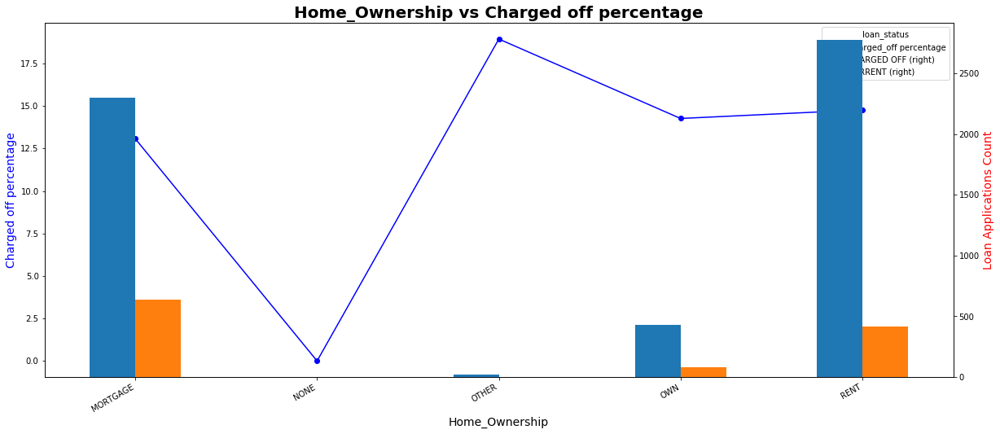

In [92]:
# lets call the our functions table and bivar to plot graphs 
x = table('home_ownership')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='home_ownership',stacked=False) 

In [93]:
df.loan_status.unique()

array(['FULLY PAID', 'CHARGED OFF', 'CURRENT'], dtype=object)

In [94]:
df.loan_status.value_counts()

FULLY PAID     32838
CHARGED OFF     5526
CURRENT         1135
Name: loan_status, dtype: int64

**loan_status** Column has 3 distict values  _Fully Paid_, _Charged Off_ & _Current_ values. The analysis for defaulter cannot be conducted for a loan Status being **current** as we dont know if the person will default or not, so lets drop rows with **Loan_status** as **current**.

In [95]:
df = df[~(df.loan_status == 'CURRENT')]

### Loan Status (loan_status)

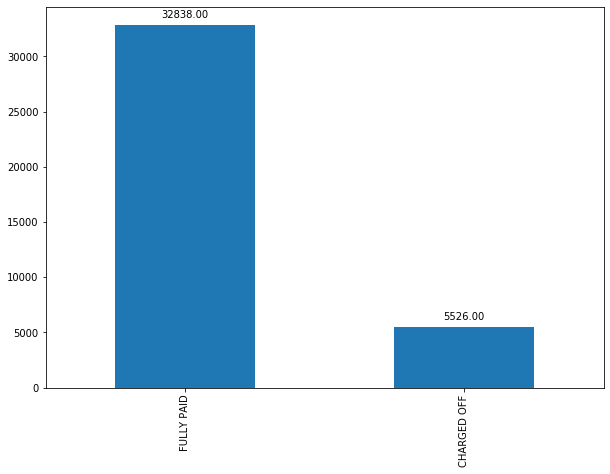

In [96]:
plt.figure(figsize=(10,7))
add_value_labels_plots(df.loan_status.value_counts().plot(kind='bar'),10)
plt.show()

### As there are two categorical variables under the loan_status column, hence we change categorical variables into binomial numeric variables for better analysis 

In [97]:
# Encode the categorical variables to 1 and 0
# here 1 is for Charged off while 0 is fully paid
df.loan_status = df.loan_status.apply(lambda x: 1 if x == 'CHARGED OFF' else 0)

In [98]:
df.loan_status.value_counts()

0    32838
1     5526
Name: loan_status, dtype: int64

In [99]:
round(100 * len(df[df.loan_status == 1]) / len(df),3)

14.404

In [100]:
df.loan_status.sum()/len(df)

0.1440412887081639

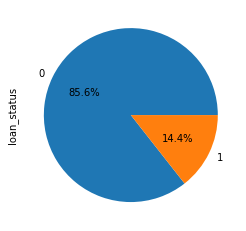

In [101]:
df['loan_status'].value_counts().plot(kind = 'pie', autopct = '%1.1f%%')
plt.show()

### Observation 
- Out of total number of customers 85.6% of customers pay full amount whereas 14.4% custormers default the loan amount

### Loan Amount (loan_amnt) 

In [102]:
df.loan_amnt.describe()

count    38364.000000
mean     11059.091205
std       7345.017336
min        500.000000
25%       5375.000000
50%       9700.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

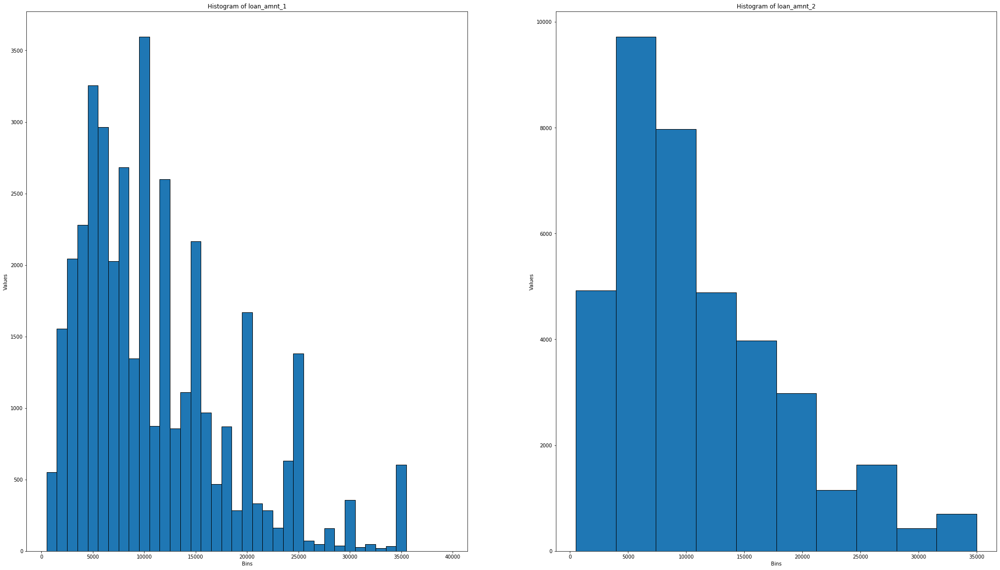

In [103]:
# Univariant analysis on the numerical value using histrogram
plt.subplots(figsize = (35,20))
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
x = [i for i in range(500,40000,1000)]

plt.subplot(1, 2, 1)
ax = plt.hist(df.loan_amnt,bins = x,edgecolor = 'black')
plt.title('Histogram of loan_amnt_1')
plt.xlabel('Bins')
plt.ylabel('Values')

plt.subplot(1, 2, 2)
ax = plt.hist(df.loan_amnt,edgecolor = 'black')
#add_value_labels_plots(ax,size = 10,spacing=5)
plt.title('Histogram of loan_amnt_2')
plt.xlabel('Bins')
plt.ylabel('Values')

plt.show()

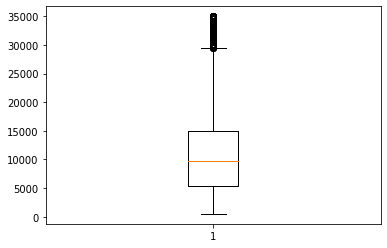

count    38364.000000
mean     11059.091205
std       7345.017336
min        500.000000
10%       3200.000000
20%       5000.000000
25%       5375.000000
30%       6000.000000
40%       7755.000000
50%       9700.000000
60%      11200.000000
70%      14000.000000
80%      16000.000000
90%      21600.000000
95%      25000.000000
100%     35000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


In [104]:
# Box plot to understand the spread of the data
plt.boxplot(df.loan_amnt)
plt.show()

print(df.loan_amnt.describe(percentiles = [0.1,0.2,0.25,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.95,1]))

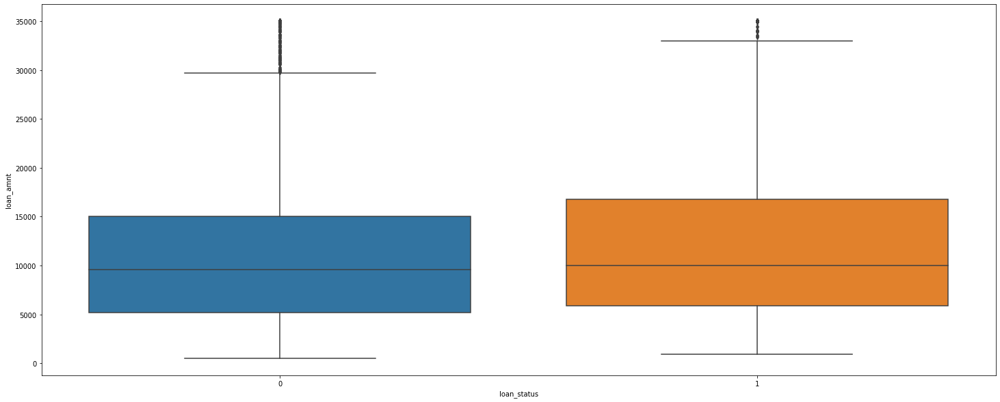

In [105]:
# Box plot to understand the spread of loan_amnt in respective loan_status
plt.subplots(figsize = (25,10))
sns.boxplot(df.loan_status, df['loan_amnt'])
plt.show()

In [106]:
x = df.groupby('loan_status')['loan_amnt'].sum()

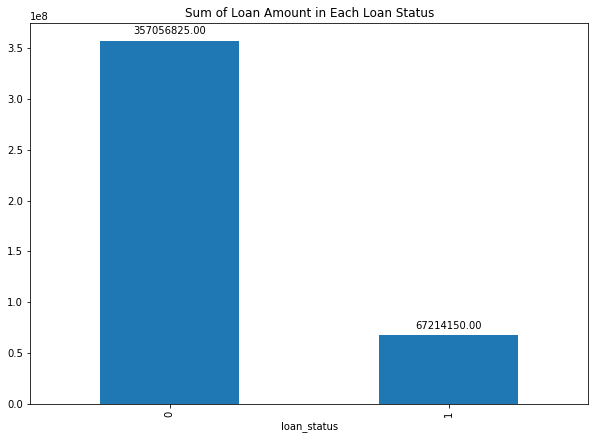

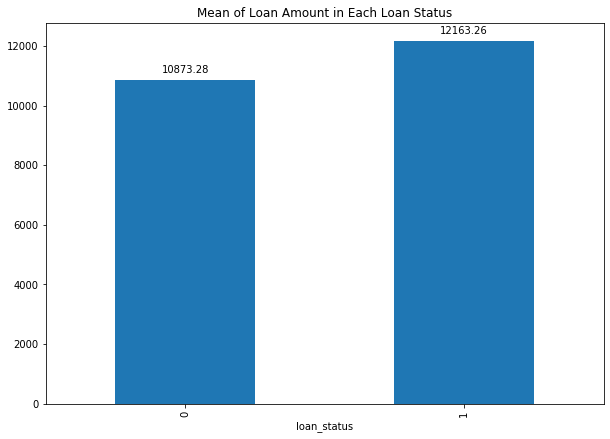

In [107]:
plt.figure(figsize=(10,7))
add_value_labels_plots(df.groupby('loan_status')['loan_amnt'].sum().plot(kind='bar'),10)
plt.title('Sum of Loan Amount in Each Loan Status')
plt.show()

plt.figure(figsize=(10,7))
add_value_labels_plots(df.groupby('loan_status')['loan_amnt'].mean().plot(kind='bar'),10)
plt.title('Mean of Loan Amount in Each Loan Status')
plt.show()

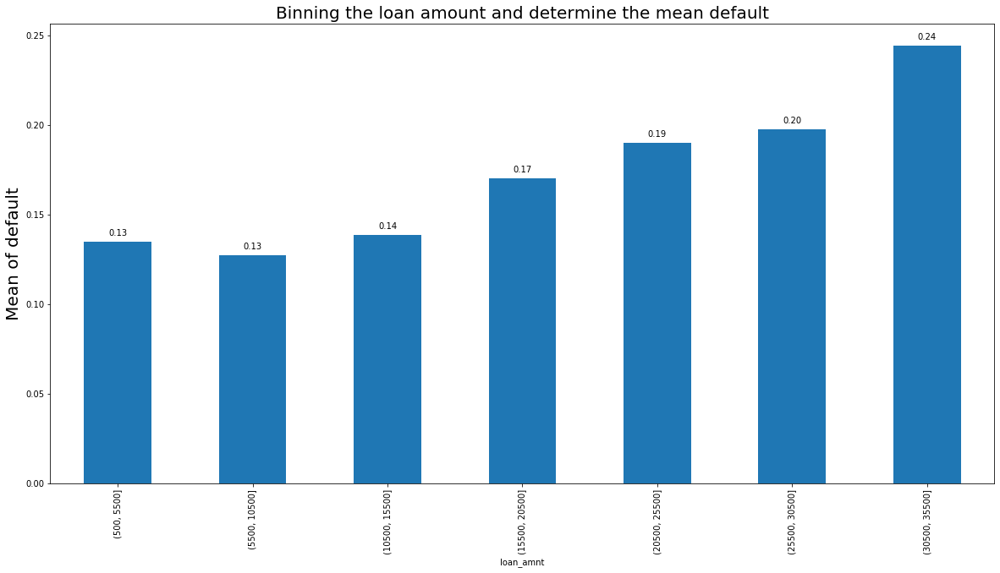

In [108]:
#Distribution of loan amount for all customers by binning with mean default rate in y-axis
plt.figure(figsize=(20,10))
bins = np.arange(df['loan_amnt'].min(),df['loan_amnt'].max() + 5000, 5000)
ax = df.groupby(pd.cut(df['loan_amnt'], bins=bins)).loan_status.mean().plot(kind = 'bar')#.count()
add_value_labels_plots(ax,10,spacing = 5)
ax.set_title('Binning the loan amount and determine the mean default',fontsize = 20)
ax.set_ylabel('Mean of default',fontsize = 20)
plt.show()

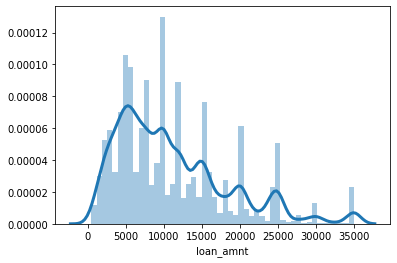

In [109]:
sns.distplot(df.loan_amnt,hist = True, kde = True, kde_kws = {'linewidth' : 3})
plt.show()

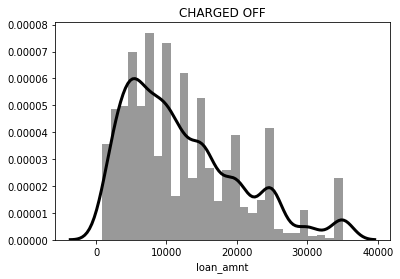

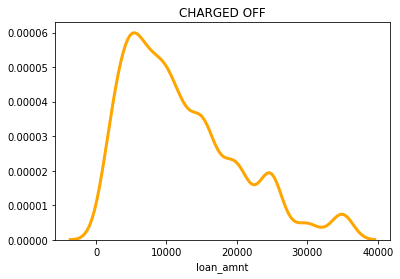

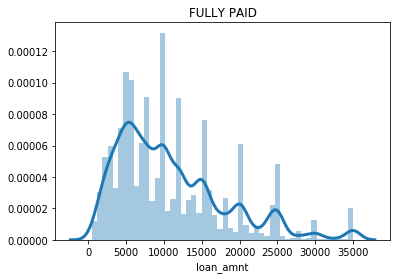

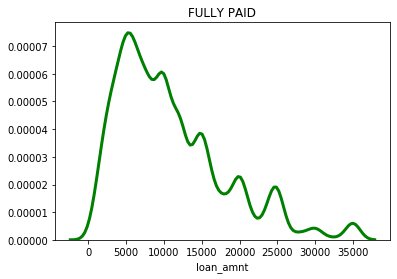

In [110]:
sns.distplot(df[df.loan_status == 1].loan_amnt,hist = True,color = 'Black', kde = True, kde_kws = {'linewidth' : 3})
plt.title("CHARGED OFF")
plt.show()

sns.distplot(df[df.loan_status == 1].loan_amnt,hist = False,color = 'Orange', kde = True, kde_kws = {'linewidth' : 3})
plt.title("CHARGED OFF")
plt.show()

sns.distplot(df[df.loan_status == 0].loan_amnt,hist = True, kde = True, kde_kws = {'linewidth' : 3})
plt.title("FULLY PAID")
plt.show()

sns.distplot(df[df.loan_status == 0].loan_amnt,hist = False,color = 'Green', kde = True, kde_kws = {'linewidth' : 3})
plt.title("FULLY PAID")
plt.show()

###### Divide the variable into various segements for the further analysis and save the new changes in the new variable

In [111]:
x25 =df.loan_amnt.quantile(0.25)
x50 = df.loan_amnt.quantile(0.5)
x75 = df.loan_amnt.quantile(0.75)
x100 = df.loan_amnt.quantile(1)

def loan_amnt(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low loan_amnt'
    elif ((x > x25) & (x <= x50)):
        return 'medium loan_amnt'
    elif ((x > x50) & (x <= x75)):
        return 'High loan_amnt'
    elif ((x > x75) & (x <= x100)):
        return 'Very High loan_amnt'

df['loan_amnt_cat'] = df.loan_amnt.apply(lambda x: loan_amnt(x,x25,x50,x75,x100))

### Loan Amount v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
loan_amnt_cat,,,,
medium loan_amnt,8383,1201,9584,87.469
High loan_amnt,9170,1428,10598,86.526
low loan_amnt,8299,1300,9599,86.457
Very High loan_amnt,6986,1597,8583,81.393


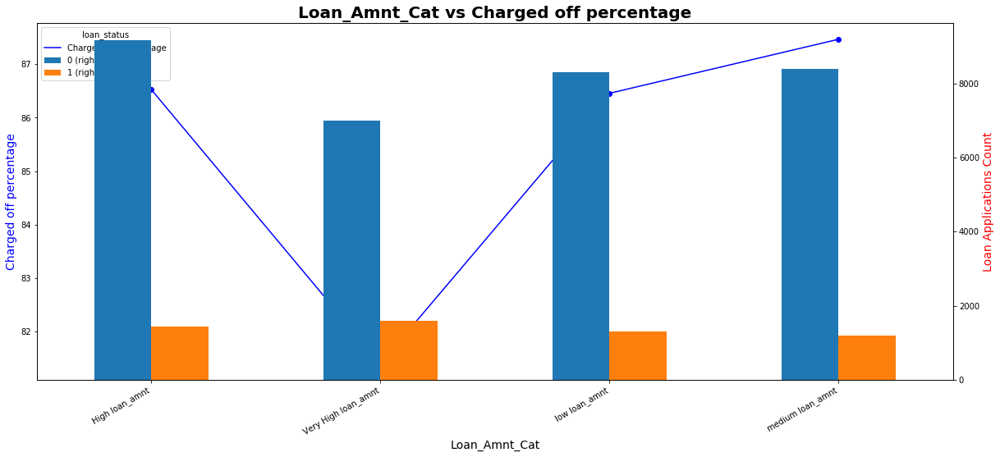

In [112]:
# lets call the our functions table and bivar to plot graphs 
x = table('loan_amnt_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='loan_amnt_cat',stacked=False) 

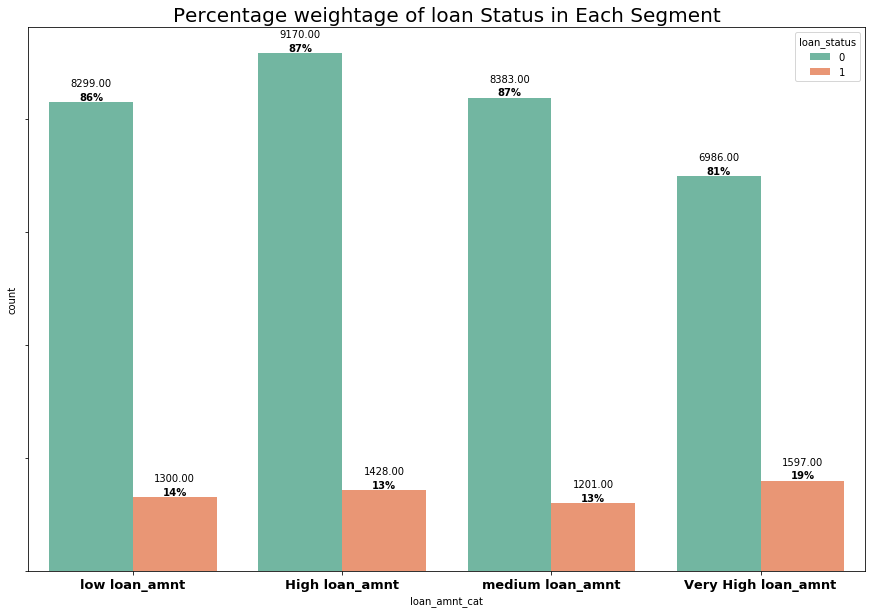

In [113]:
# displaying the default percentage and fully paid percentage in each segment of loan amount
plt.subplots(figsize = (15,10))
ax = sns.countplot(df.loan_amnt_cat, palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
ax.set_title('Percentage weightage of loan Status in Each Segment', fontsize = 20)
plt.show()

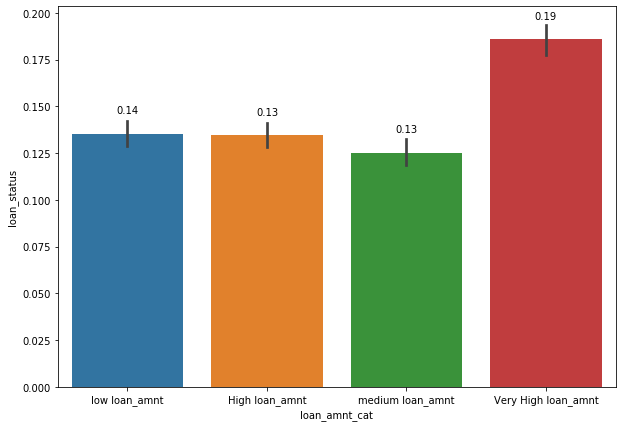

In [114]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.loan_amnt_cat,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Observation  
- The Probability density fuction curve shows that it is right skewed And the loan amnt in the range 30500 - 35500 has highest  default rate with around 24%

### Grade (grade)

In [115]:
df.grade.value_counts()

B    11632
A    10005
C     7780
D     5045
E     2639
F      968
G      295
Name: grade, dtype: int64

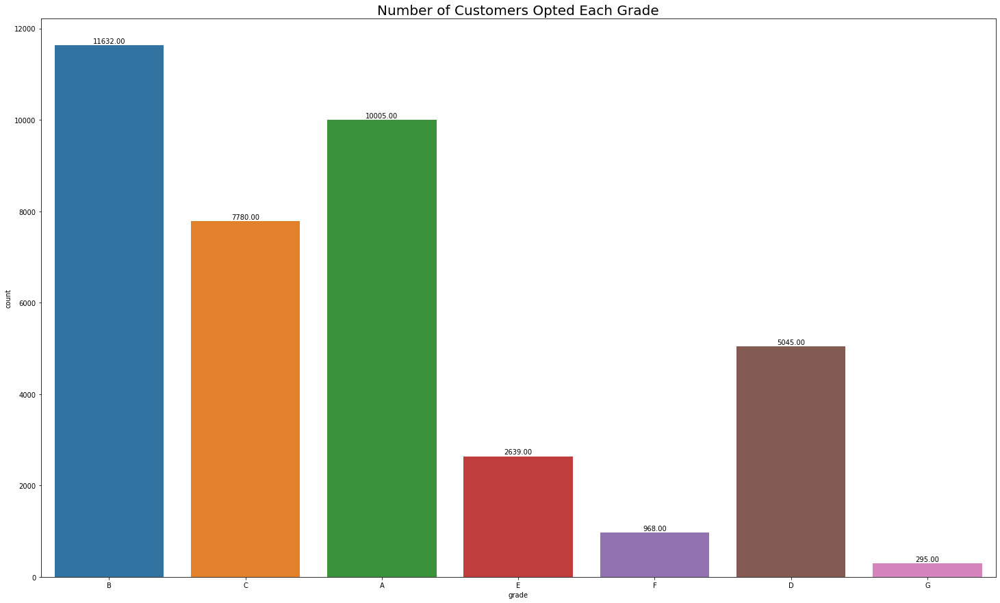

In [116]:
plt.subplots(figsize = (25,15))
ax = sns.countplot(df.grade)
ax.set_title('Number of Customers Opted Each Grade', fontsize = 20)
add_value_labels_plots(ax,10,spacing = 1)
plt.show()

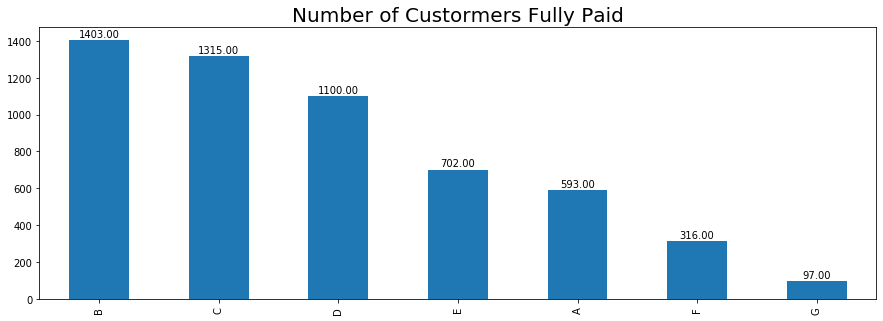

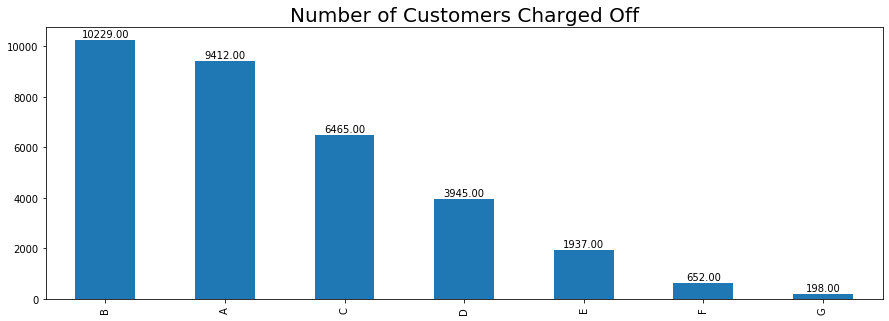

In [117]:
plt.subplots(figsize = (15,5))
ax1 = df[df.loan_status == 1].grade.value_counts().plot(kind = 'bar')
plt.title('Number of Custormers Fully Paid', fontsize = 20)
add_value_labels_plots(ax1,10,spacing = 1)
plt.show()

plt.subplots(figsize = (15,5))
ax2 = df[df.loan_status == 0].grade.value_counts().plot(kind = 'bar')
add_value_labels_plots(ax2,10,spacing = 1)
plt.title('Number of Customers Charged Off', fontsize = 20)
plt.show()

In [118]:
e = df.groupby('grade')['loan_status'].mean()
print(e)

grade
A    0.059270
B    0.120616
C    0.169023
D    0.218038
E    0.266010
F    0.326446
G    0.328814
Name: loan_status, dtype: float64


#### Grade v/s Charged Off percentage

loan_status,0,1,All,Charged_off percentage
grade,,,,
A,9412,593,10005,94.073
B,10229,1403,11632,87.938
C,6465,1315,7780,83.098
D,3945,1100,5045,78.196
E,1937,702,2639,73.399
F,652,316,968,67.355
G,198,97,295,67.119


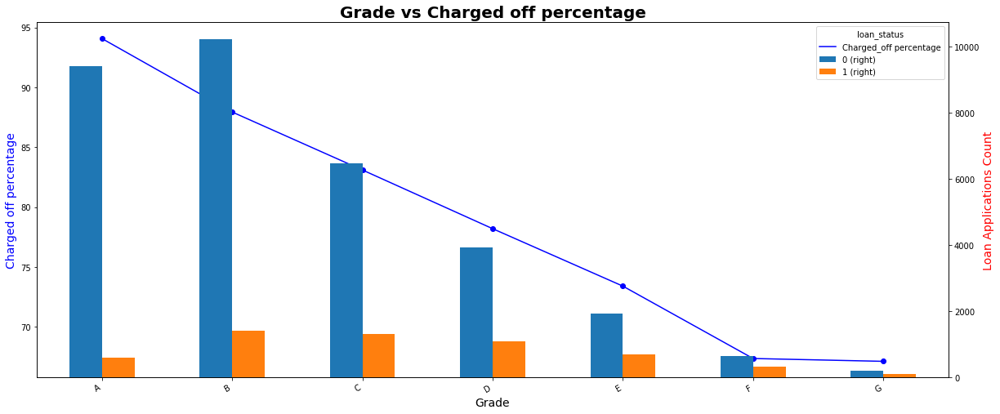

In [119]:
# lets call the our functions table and bivar to plot graphs 
x = table('grade')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='grade',stacked=False)

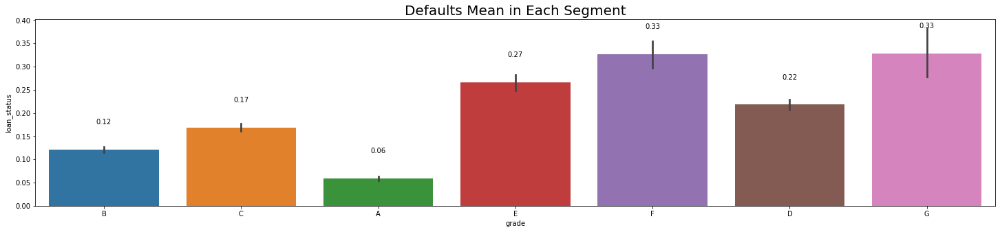

In [120]:
plt.subplots(figsize = (25,5))
ax = sns.barplot(df.grade,df.loan_status)
add_value_labels_plots(ax,10,spacing = 35)
ax.set_title('Defaults Mean in Each Segment', fontsize = 20)
plt.show()

### Observation 
- customers assigned to Grades G & F have highest default rates. 

### Sub Grade (sub_grade)

In [121]:
df.sub_grade.value_counts()

A4    2872
B3    2819
A5    2707
B5    2606
B4    2426
C1    2047
B2    1992
C2    1913
A3    1802
B1    1789
A2    1500
C3    1476
D2    1279
C4    1200
C5    1144
A1    1124
D3    1107
D1     920
D4     913
D5     826
E1     719
E2     607
E3     510
E4     422
E5     381
F1     304
F2     231
F3     174
F4     148
F5     111
G1      91
G2      76
G4      54
G3      45
G5      29
Name: sub_grade, dtype: int64

In [122]:
df.sub_grade.describe()

count     38364
unique       35
top          A4
freq       2872
Name: sub_grade, dtype: object

#### Sub Grade v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
sub_grade,,,,
A1,1095,29,1124,97.420
A2,1427,73,1500,95.133
A3,1701,101,1802,94.395
A4,2694,178,2872,93.802
A5,2495,212,2707,92.168
B1,1621,168,1789,90.609
B2,1769,223,1992,88.805
B3,2480,339,2819,87.974
B4,2105,321,2426,86.768


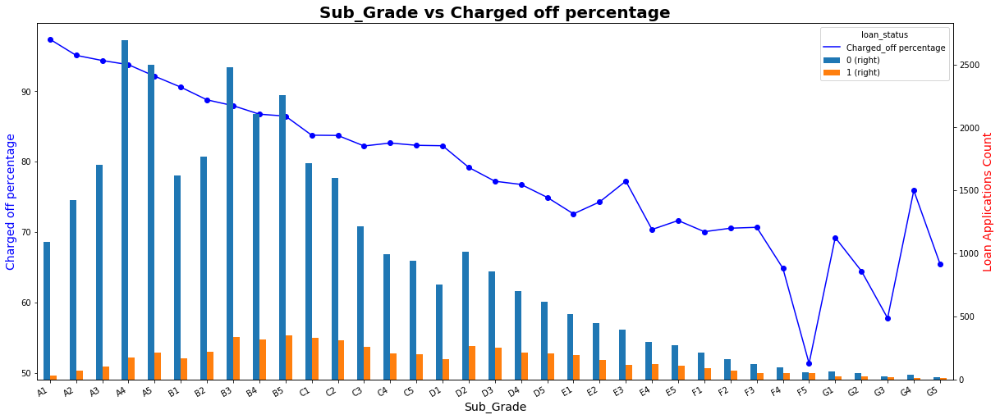

In [123]:
# lets call the our functions table and bivar to plot graphs 
x = table('sub_grade')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='sub_grade',stacked=False) 

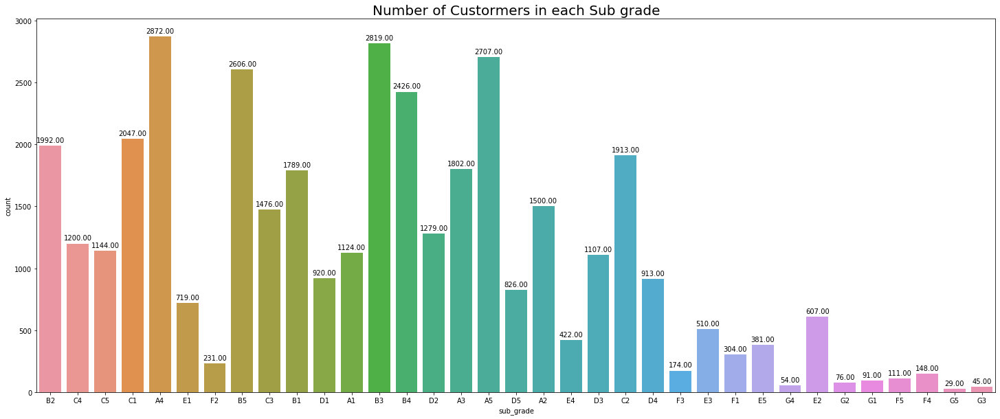

In [124]:
plt.subplots(figsize = (25,10))
ax = sns.countplot(df.sub_grade)
add_value_labels_plots(ax,10,spacing = 3)
ax.set_title('Number of Custormers in each Sub grade', fontsize = 20)
plt.show()

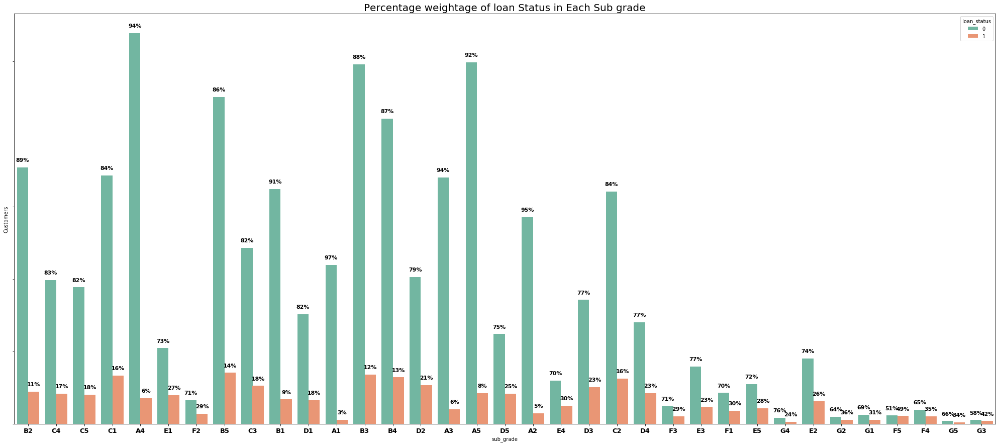

In [125]:
plt.subplots(figsize = (35,15))
ax = sns.countplot(df.sub_grade, palette="Set2", hue = df.loan_status)
ax = annotate_count_plots(ax,11)
ax.set_title('Percentage weightage of loan Status in Each Sub grade', fontsize = 20)
plt.ylabel('Customers')
plt.show()


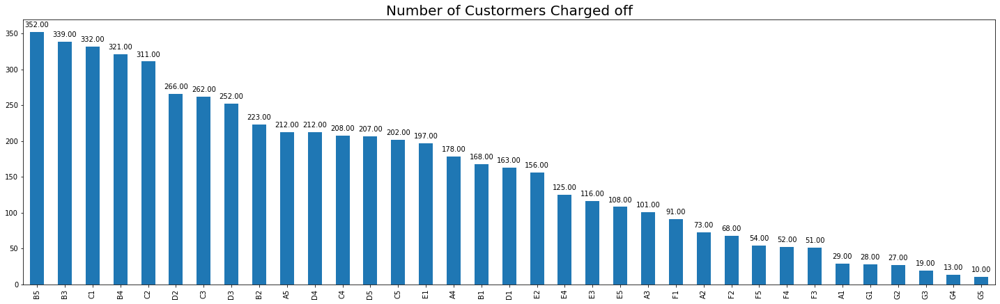

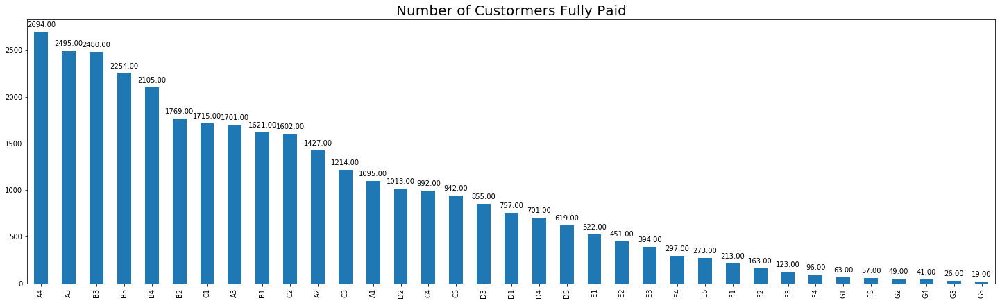

In [126]:
plt.subplots(figsize = (25,7))
ax1 = df[df.loan_status == 1].sub_grade.value_counts().plot(kind = 'bar')
plt.title('Number of Custormers Charged off', fontsize = 20)
add_value_labels_plots(ax1,10,spacing = 5)
plt.show()

plt.subplots(figsize = (25,7))
ax2 = df[df.loan_status == 0].sub_grade.value_counts().plot(kind = 'bar')
plt.title('Number of Custormers Fully Paid', fontsize = 20)
add_value_labels_plots(ax2,10,spacing = 5)
plt.show()

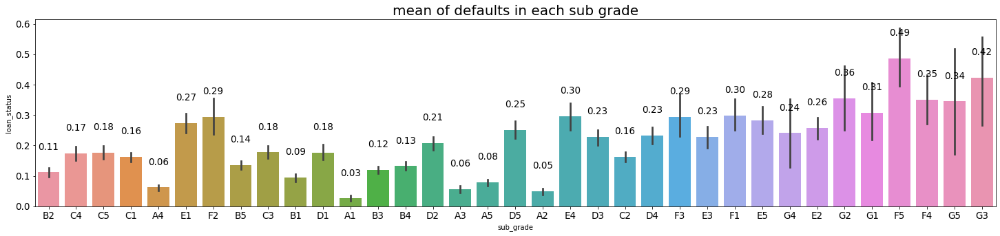

In [127]:
plt.subplots(figsize = (25,5))
ax = sns.barplot(df.sub_grade,df.loan_status)
add_value_labels_plots(ax,13.5,spacing = 30)
plt.title('mean of defaults in each sub grade', fontsize = 20)
plt.show()

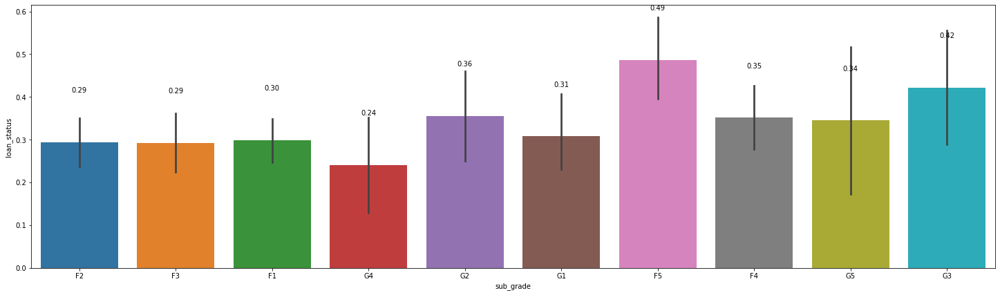

In [128]:
plt.subplots(figsize = (25,7))
ax = sns.barplot(df[df.grade.isin(['G','F'])].sub_grade,df.loan_status)
add_value_labels_plots(ax,10,spacing = 70)
plt.show()

### Observation
- It is observed that F & G grade has higher default, when analysis is made it is observed that sub grade F5 has the highest default compared to any other subgrades with a default rate close to 49%.

In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38364 entries, 0 to 39716
Data columns (total 26 columns):
loan_amnt                  38364 non-null int64
funded_amnt                38364 non-null int64
funded_amnt_inv            38364 non-null float64
term months                38364 non-null float64
int_rate %                 38364 non-null float64
installment                38364 non-null float64
grade                      38364 non-null object
sub_grade                  38364 non-null object
emp_length                 38364 non-null int64
home_ownership             38364 non-null object
annual_inc                 38364 non-null float64
verification_status        38364 non-null object
issue_d                    38364 non-null datetime64[ns]
loan_status                38364 non-null int64
purpose                    38364 non-null object
dti                        38364 non-null float64
open_acc                   38364 non-null int64
pub_rec                    38364 non-null int64
r

### Employement Lenght (emp_length).

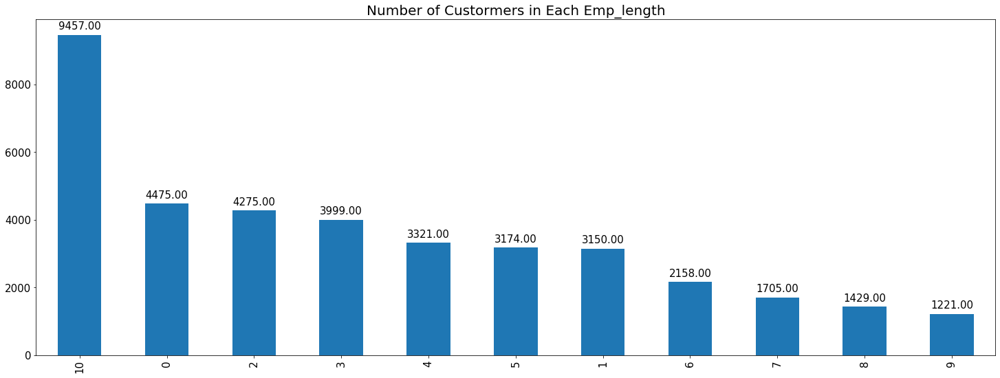

In [130]:
plt.subplots(figsize = (25,9))
ax = df.emp_length.value_counts().sort_values(ascending = False).plot(kind = 'bar')
add_value_labels_plots(ax,15,spacing = 5)
plt.title('Number of Custormers in Each Emp_length', fontsize = 20)
plt.show()

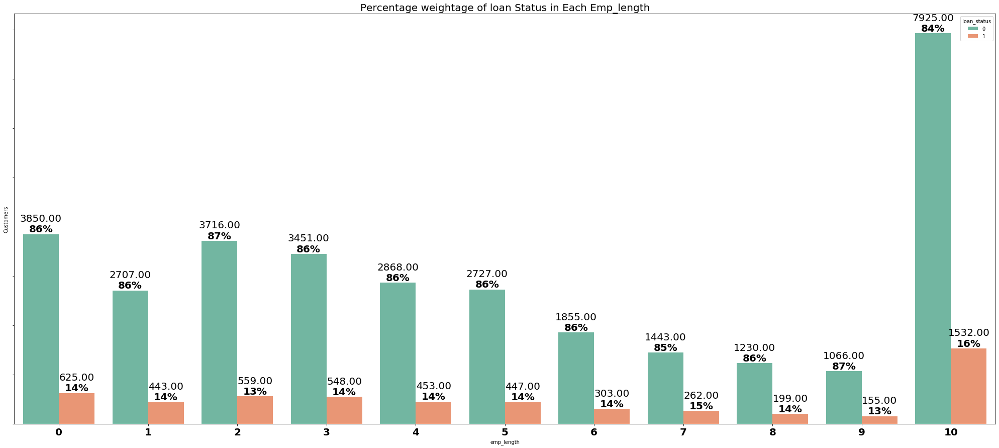

In [131]:
plt.subplots(figsize = (35,15))
ax = sns.countplot(df.emp_length, palette="Set2", hue = df.loan_status)
ax = annotate_count_plots(ax,20)
add_value_labels_plots(ax,20,spacing = 21)
ax.set_title('Percentage weightage of loan Status in Each Emp_length', fontsize = 20)
plt.ylabel('Customers')
plt.show()

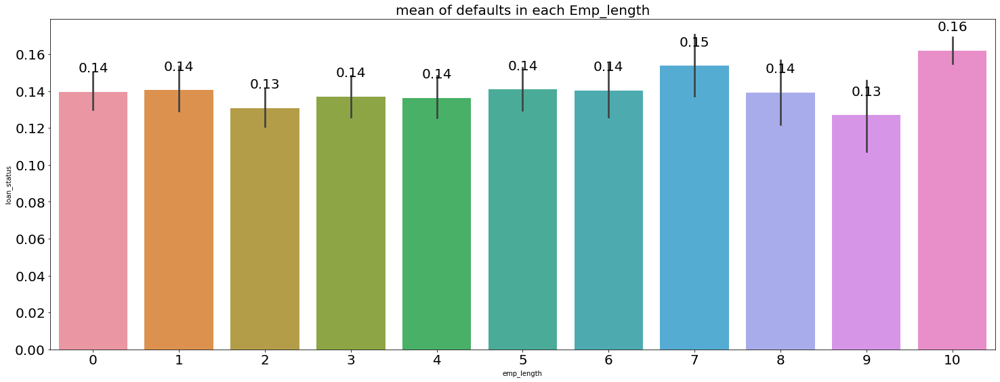

In [132]:
plt.subplots(figsize = (25,9))
ax = sns.barplot(df.emp_length,df.loan_status)
add_value_labels_plots(ax,20,spacing = 25)
plt.title('mean of defaults in each Emp_length', fontsize = 20)
plt.show()

Lets divide emp_length into four sections 0-1, 2-4, 5-7 & 8-9 years of employment.

In [133]:
def four_div_emp_length(x):
    if x <= 2:
        return '0-1 exp_years'
    elif ((x <= 4) & (x > 1)):
        return '2-4 exp_years'
    elif ((x <= 7) & (x > 4)):
        return '5-7 exp_years'
    elif ((x <= 10) & (x > 7)):
        return '8-10 exp_years'
    

In [134]:
df['emp_length_cat'] = df.emp_length.apply(lambda x: four_div_emp_length(x))

#### Employment Length v/s Charged off percentage

loan_status,0,1,All,Charged_off percentage
emp_length_cat,,,,
0-1 exp_years,10273,1627,11900,86.328
2-4 exp_years,6319,1001,7320,86.325
5-7 exp_years,6025,1012,7037,85.619
8-10 exp_years,10221,1886,12107,84.422


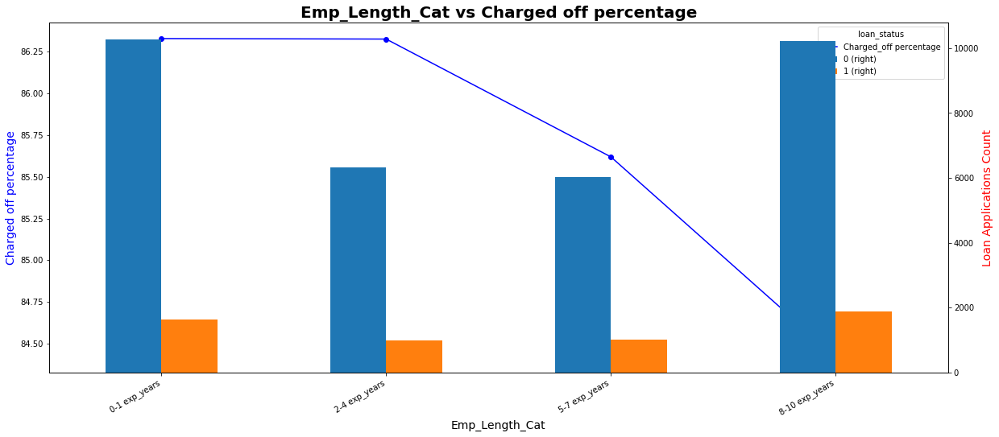

In [135]:
# lets call the our functions table and bivar to plot graphs 
x = table('emp_length_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='emp_length_cat',stacked=False) 

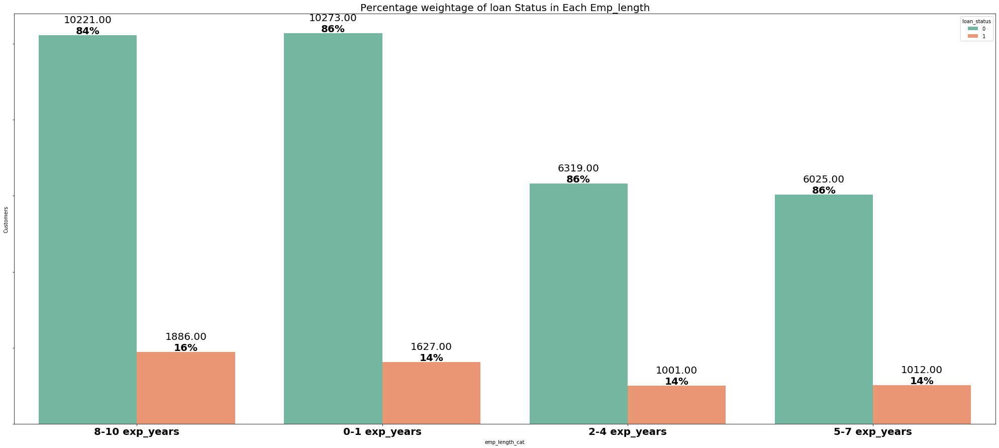

In [136]:
plt.subplots(figsize = (35,15))
ax = sns.countplot(df.emp_length_cat, palette="Set2", hue = df.loan_status)
ax = annotate_count_plots(ax,20)
ax.set_title('Percentage weightage of loan Status in Each Emp_length', fontsize = 20)
add_value_labels_plots(ax,20,spacing = 21)
plt.ylabel('Customers')
plt.show()

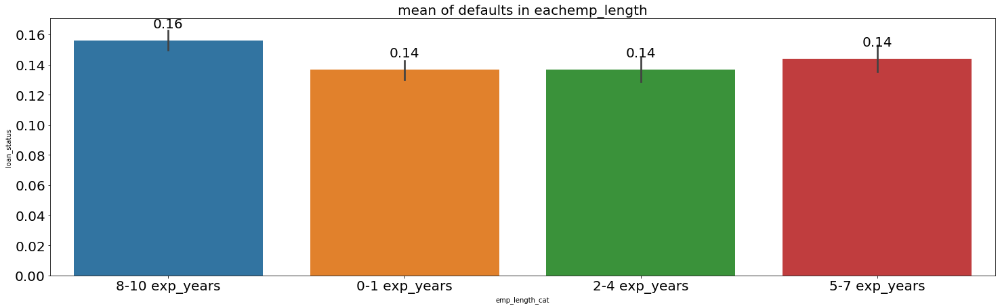

In [137]:
plt.subplots(figsize = (25,7))
ax = sns.barplot(df.emp_length_cat,df.loan_status)
add_value_labels_plots(ax,20,spacing = 15)
plt.title('mean of defaults in eachemp_length', fontsize = 20)
plt.show()

### Observation  
- Customers with more than 8+ years of experience have higher rate of defaults comparatively.

### Home Ownership (home_ownership)

In [138]:
df.home_ownership.value_counts()

RENT        18373
MORTGAGE    16948
OWN          2945
OTHER          95
NONE            3
Name: home_ownership, dtype: int64

In [139]:
df = df[~(df.home_ownership == 'NONE')] 

#### Home Ownership v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
home_ownership,,,,
MORTGAGE,14649,2299,16948,86.435
OWN,2513,432,2945,85.331
RENT,15596,2777,18373,84.885
OTHER,77,18,95,81.053


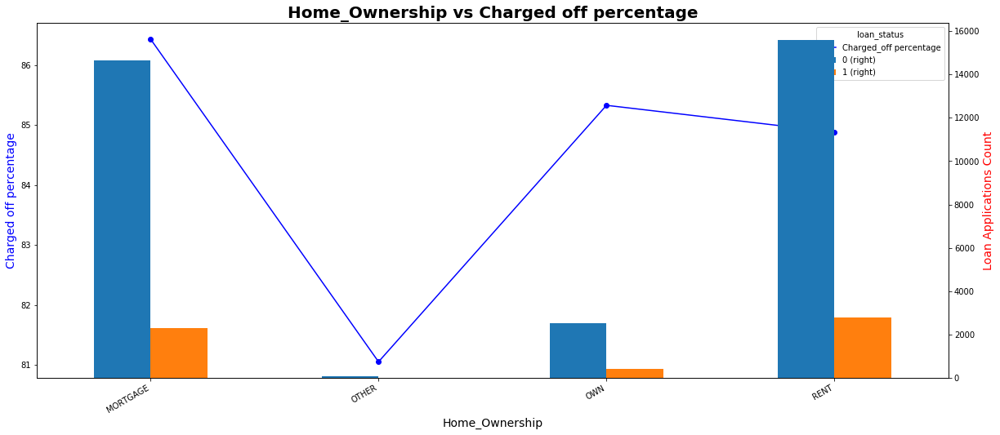

In [140]:
# lets call the our functions table and bivar to plot graphs 
x = table('home_ownership')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='home_ownership',stacked=False) 

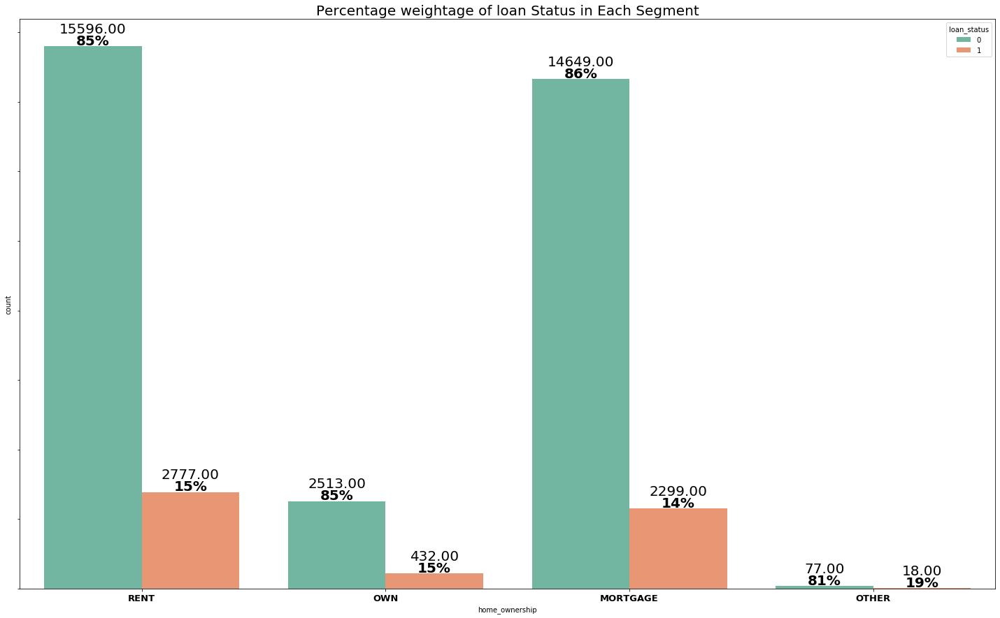

In [141]:
plt.subplots(figsize = (25,15))
ax = sns.countplot(df.home_ownership, palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,20,spacing = 15)
ax = annotate_count_plots(ax,font = 20)
ax.set_title('Percentage weightage of loan Status in Each Segment', fontsize = 20)
plt.show()

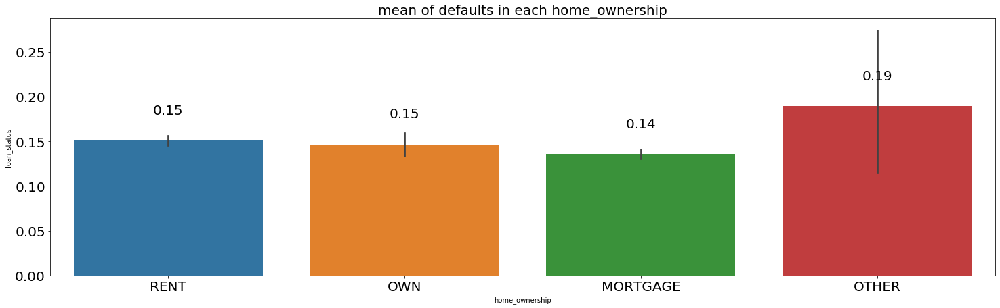

In [142]:
plt.subplots(figsize = (25,7))
ax = sns.barplot(df.home_ownership,df.loan_status)
add_value_labels_plots(ax,20,spacing = 35)
plt.title('mean of defaults in each home_ownership', fontsize = 20)
plt.show()

### Observation 
- Based on the above results we cannot use home_ownership as factor to determine the default. Because acoording to the analysis 'Other' has got highest average of default cases compared to other types of ownership. But this cannot be considered, as the number of samples are limited for 'Others' compared to other ownership types. Hence it is difficult to make conclusions

### Loan Term (term)


In [143]:
df['term months'].value_counts()

36.0    28925
60.0     9436
Name: term months, dtype: int64

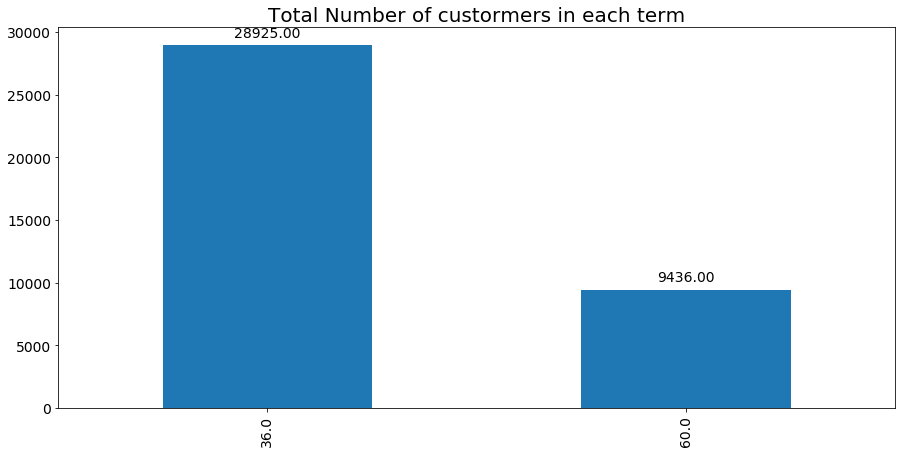

In [144]:
plt.subplots(figsize = (15,7))
ax = df['term months'].value_counts().plot(kind = 'bar')
add_value_labels_plots(ax,14,spacing = 5)
plt.title('Total Number of custormers in each term', fontsize = 20)
plt.show()

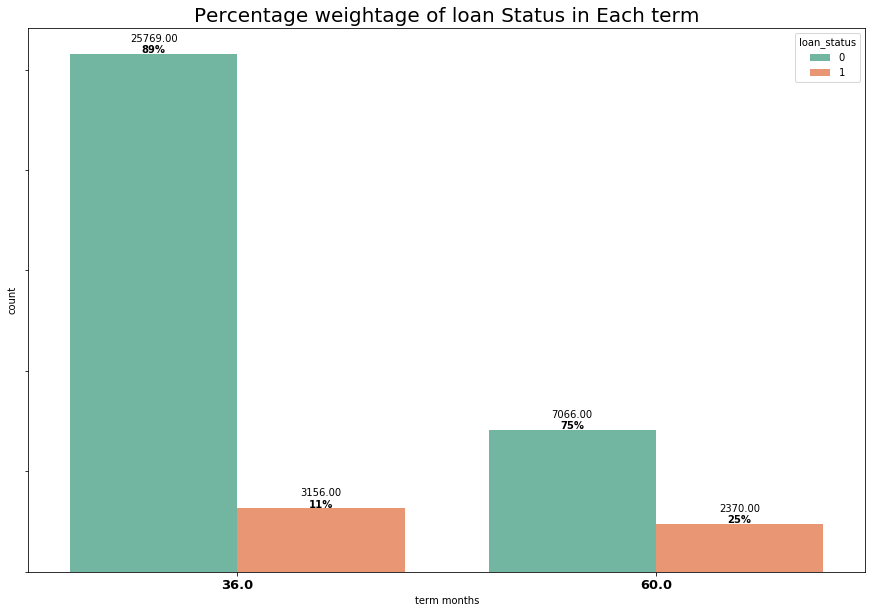

In [145]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['term months'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 10)
ax = annotate_count_plots(ax,font = 10)
ax.set_title('Percentage weightage of loan Status in Each term', fontsize = 20)
plt.show()

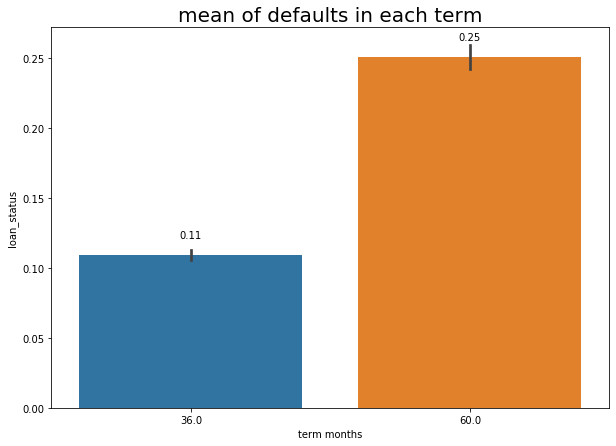

In [146]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(df['term months'],df.loan_status)
add_value_labels_plots(ax,10,spacing = 15)
plt.title('mean of defaults in each term', fontsize = 20)
plt.show()

### Observation
- From the above Analysis Plot it stays that Customers who Opted 60 months term have defaulted the loans

### Interest Rate

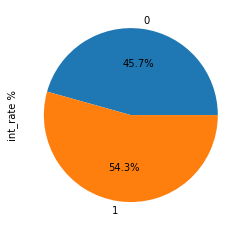

In [147]:
df.groupby('loan_status')['int_rate %'].mean().plot(kind = 'pie', autopct = '%1.1f%%')

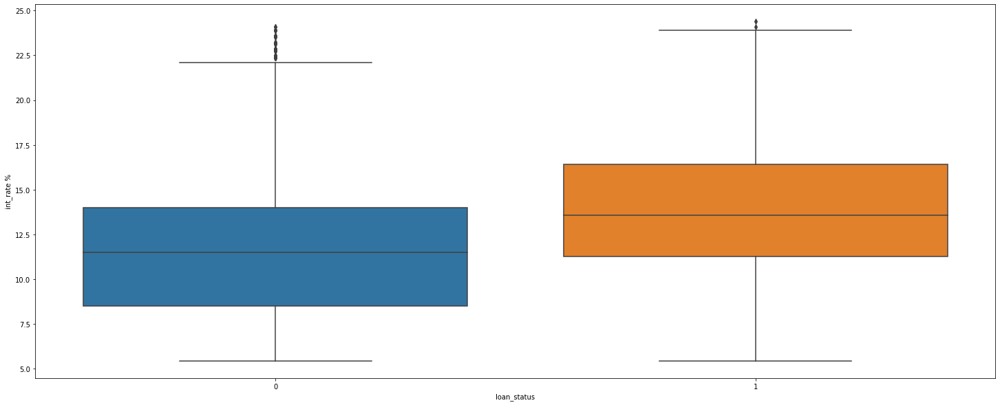

In [148]:
plt.subplots(figsize = (25,10))
sns.boxplot(df.loan_status, df['int_rate %'])
plt.show()

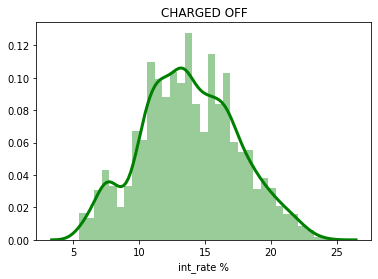

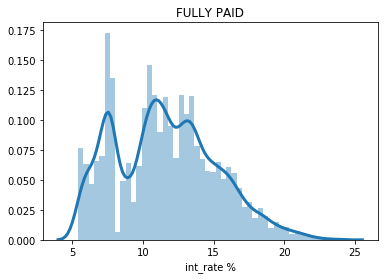

In [149]:
sns.distplot(df[df.loan_status == 1]['int_rate %'],hist = True,color = 'Green', kde = True, kde_kws = {'linewidth' : 3})
plt.title("CHARGED OFF")
plt.show()

sns.distplot(df[df.loan_status == 0]['int_rate %'],hist = True, kde = True, kde_kws = {'linewidth' : 3})
plt.title("FULLY PAID")
plt.show()

### Observation
- From box plot we can observe that higher interest rates have hig defaults.

In [150]:
df['int_rate %'].describe(percentiles = [0.1,0.20,.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,1])

count    38361.000000
mean        11.926356
std          3.689024
min          5.420000
10%          7.140000
20%          7.900000
25%          8.940000
30%          9.990000
40%         10.960000
50%         11.710000
60%         12.730000
70%         13.790000
75%         14.350000
80%         15.210000
90%         16.820000
100%        24.400000
max         24.400000
Name: int_rate %, dtype: float64

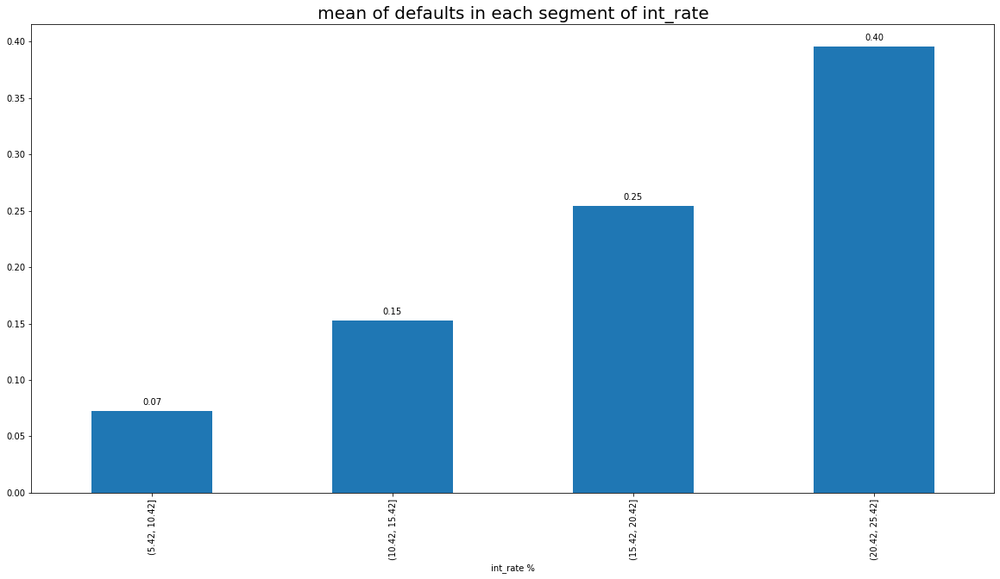

In [151]:
plt.figure(figsize=(20,10))
bins = np.arange(df['int_rate %'].min(),df['int_rate %'].max() + 5, 5)
ax = df.groupby(pd.cut(df['int_rate %'], bins=bins)).loan_status.mean().plot(kind = 'bar')#.count()
add_value_labels_plots(ax,10,spacing = 5)
plt.title('mean of defaults in each segment of int_rate', fontsize = 20)
plt.show()

In [152]:
x25 = df['int_rate %'].quantile(0.25)
x50 = df['int_rate %'].quantile(0.5)
x75 = df['int_rate %'].quantile(0.75)
x100 = df['int_rate %'].quantile(1)

def int_rate(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low int_rate'
    elif ((x > x25) & (x <= x50)):
        return 'medium int_rate'
    elif ((x > x50) & (x <= x75)):
        return 'High int_rate'
    elif ((x > x75) & (x <= x100)):
        return 'Very High int-rate'
    

In [153]:
df['int_rate_cat %'] = df['int_rate %'].apply(lambda x: int_rate(x,x25,x50,x75,x100))

#### Interest rate cat v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
int_rate_cat %,,,,
low int_rate,9192,577,9769,94.094
medium int_rate,8365,1103,9468,88.350
High int_rate,8052,1504,9556,84.261
Very High int-rate,7226,2342,9568,75.523


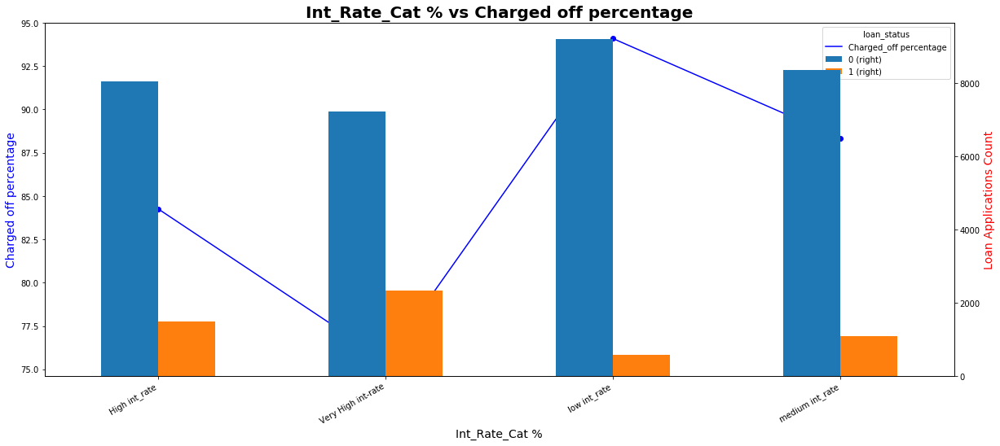

In [154]:
# lets call the our functions table and bivar to plot graphs 
x = table('int_rate_cat %')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='int_rate_cat %',stacked=False) 

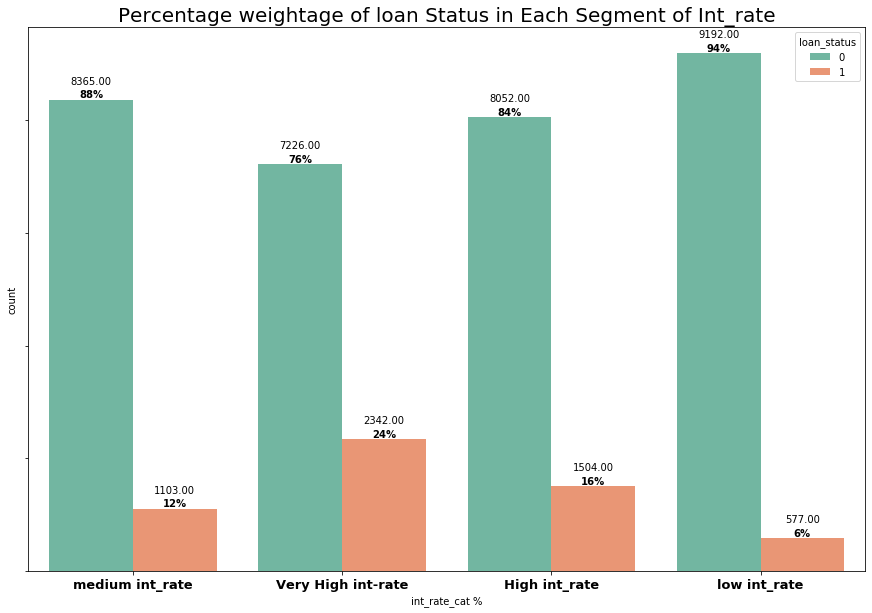

In [155]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['int_rate_cat %'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
ax.set_title('Percentage weightage of loan Status in Each Segment of Int_rate', fontsize = 20)
plt.show()

### Observation
- From the above analysis, it is observed that custormers with very high interest rates had high default rates. very High Interests rates is in range of 14.35% interest to 24.4% interest rate. 

### Annual Income (annual_inc)

In [156]:
df.annual_inc.describe(percentiles = [0,0.1,0.206,.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.95,1])

count    3.836100e+04
mean     6.883221e+04
std      6.427990e+04
min      4.000000e+03
0%       4.000000e+03
10%      3.000000e+04
20.6%    3.800000e+04
25%      4.000000e+04
30%      4.482800e+04
40%      5.000400e+04
50%      5.900000e+04
60%      6.506100e+04
70%      7.500000e+04
75%      8.200000e+04
80%      9.000000e+04
90%      1.151542e+05
95%      1.400040e+05
100%     6.000000e+06
max      6.000000e+06
Name: annual_inc, dtype: float64

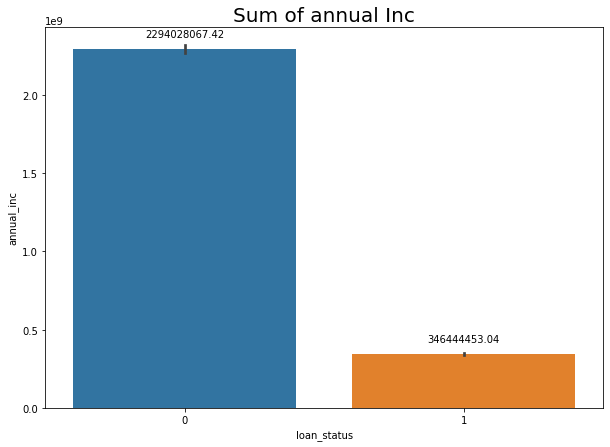

In [157]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(y = df.annual_inc,x = df.loan_status,estimator = np.sum)
plt.title('Sum of annual Inc', fontsize = 20)
add_value_labels_plots(ax,10,spacing = 10)
plt.show()

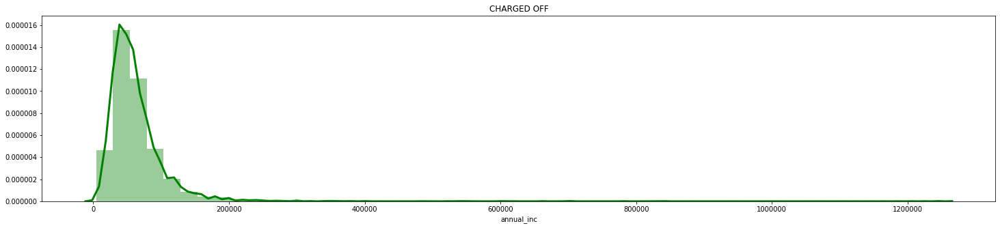

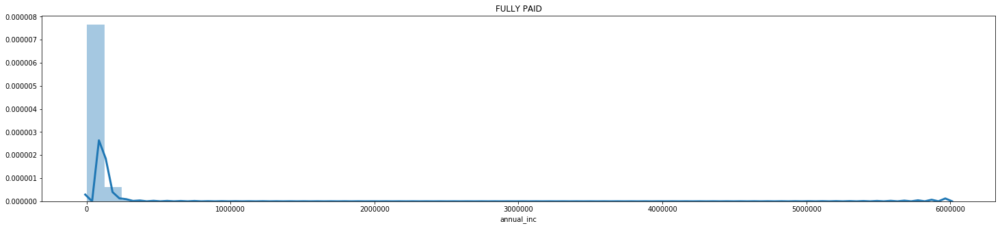

In [158]:
plt.subplots(figsize = (25,5))
sns.distplot(df[df.loan_status == 1]['annual_inc'],hist = True,color = 'Green', kde = True, kde_kws = {'linewidth' : 3})
plt.title("CHARGED OFF")
plt.show()

plt.subplots(figsize = (25,5))
sns.distplot(df[df.loan_status == 0]['annual_inc'],hist = True, kde = True, kde_kws = {'linewidth' : 3})
plt.title("FULLY PAID")
plt.show()

In [159]:
x25 = df['annual_inc'].quantile(0.25)
x50 = df['annual_inc'].quantile(0.5)
x75 = df['annual_inc'].quantile(0.75)
x100 = df['annual_inc'].quantile(1)

def income(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low income'
    elif ((x > x25) & (x <= x50)):
        return 'medium income'
    elif ((x > x50) & (x <= x75)):
        return 'High income'
    elif ((x > x75) & (x <= x100)):
        return 'Very High income'

In [160]:
df['annual_inc_cat'] = df['annual_inc'].apply(lambda x: income(x,x25,x50,x75,x100))

loan_status,0,1,All,Charged_off percentage
annual_inc_cat,,,,
Very High income,8483,1063,9546,88.864
High income,8223,1322,9545,86.150
medium income,8221,1436,9657,85.130
low income,7908,1705,9613,82.264


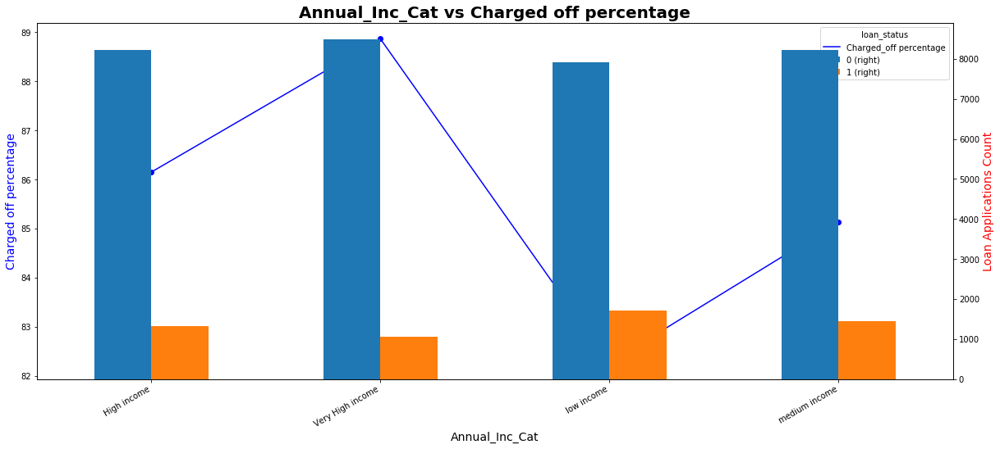

In [161]:
# lets call the our functions table and bivar to plot graphs 
x = table('annual_inc_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='annual_inc_cat',stacked=False) 

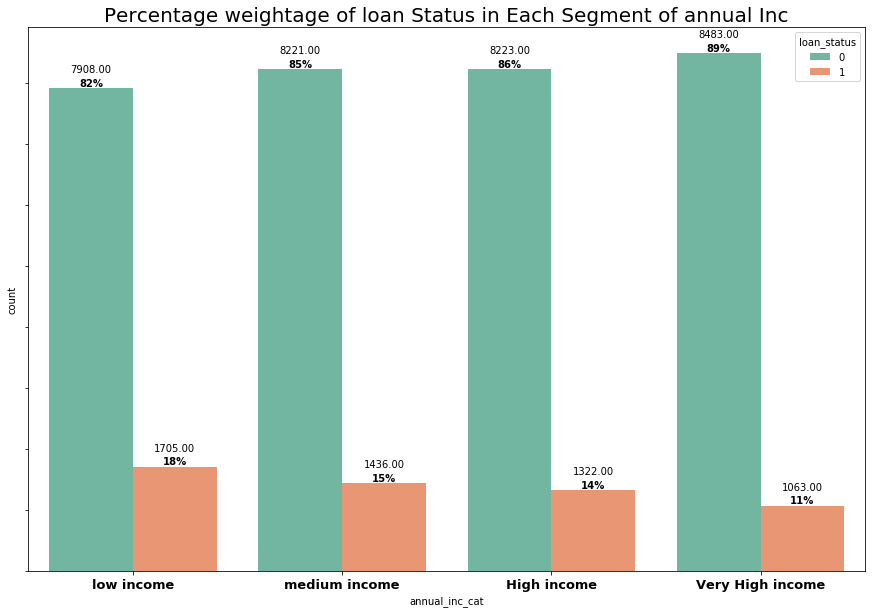

In [162]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['annual_inc_cat'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
ax.set_title('Percentage weightage of loan Status in Each Segment of annual Inc', fontsize = 20)
plt.show()

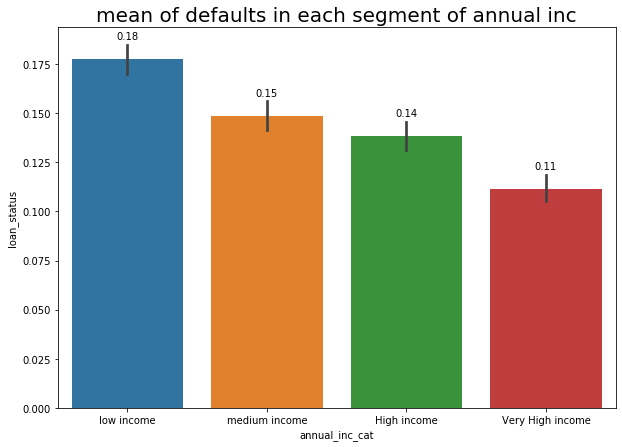

In [163]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.annual_inc_cat,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.title('mean of defaults in each segment of annual inc', fontsize = 20)
plt.show()

### Observation
- Customers with low Income have high default rate with 18% Charged off. 

### Verification Status

In [164]:
df.verification_status.value_counts()

NOT VERIFIED       16588
VERIFIED           12142
SOURCE VERIFIED     9631
Name: verification_status, dtype: int64

#### Verification Status v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
verification_status,,,,
NOT VERIFIED,14493,2095,16588,87.370
SOURCE VERIFIED,8216,1415,9631,85.308
VERIFIED,10126,2016,12142,83.396


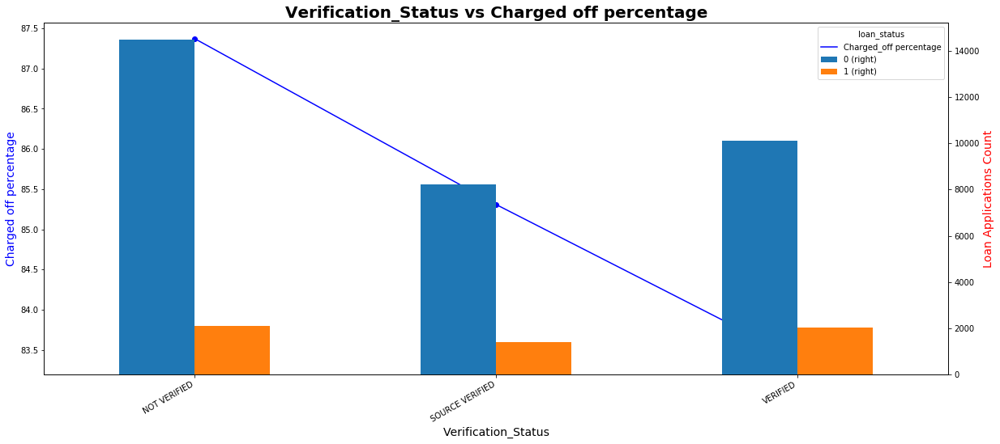

In [165]:
# lets call the our functions table and bivar to plot graphs 
x = table('verification_status')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='verification_status',stacked=False) 

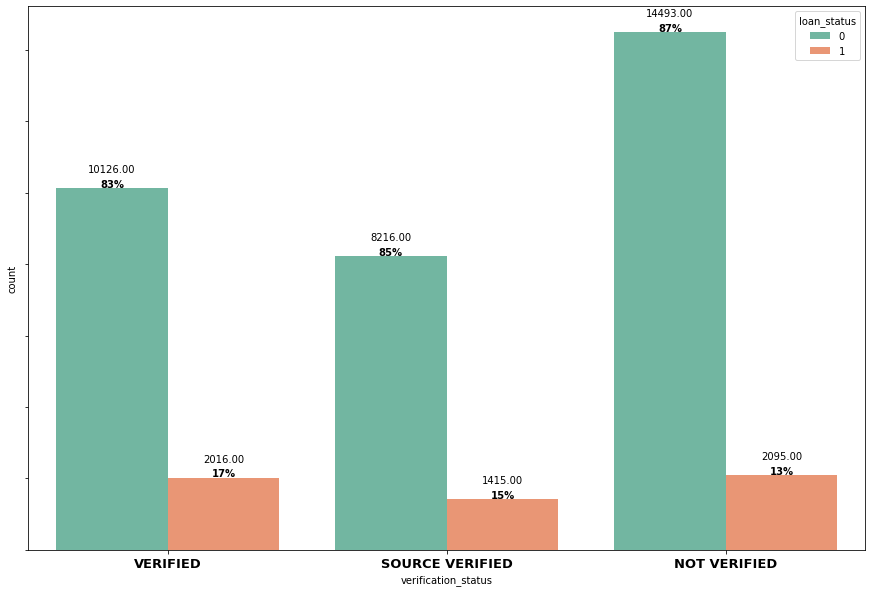

In [166]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['verification_status'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

### Observation
- It looks like the verified customers have high default rate.

### Purpose of Loan (purpose)

In [167]:
df.purpose.value_counts()[0:6]

DEBT_CONSOLIDATION    17982
CREDIT_CARD            5010
OTHER                  3832
HOME_IMPROVEMENT       2856
MAJOR_PURCHASE         2131
SMALL_BUSINESS         1737
Name: purpose, dtype: int64

### Purpose v/s Charged off percentage

loan_status,0,1,All,Charged_off percentage
purpose,,,,
WEDDING,829,90,919,90.207
MAJOR_PURCHASE,1915,216,2131,89.864
CAR,1333,157,1490,89.463
CREDIT_CARD,4473,537,5010,89.281
HOME_IMPROVEMENT,2518,338,2856,88.165
VACATION,318,52,370,85.946
DEBT_CONSOLIDATION,15255,2727,17982,84.835
MEDICAL,573,105,678,84.513
HOUSE,308,57,365,84.384


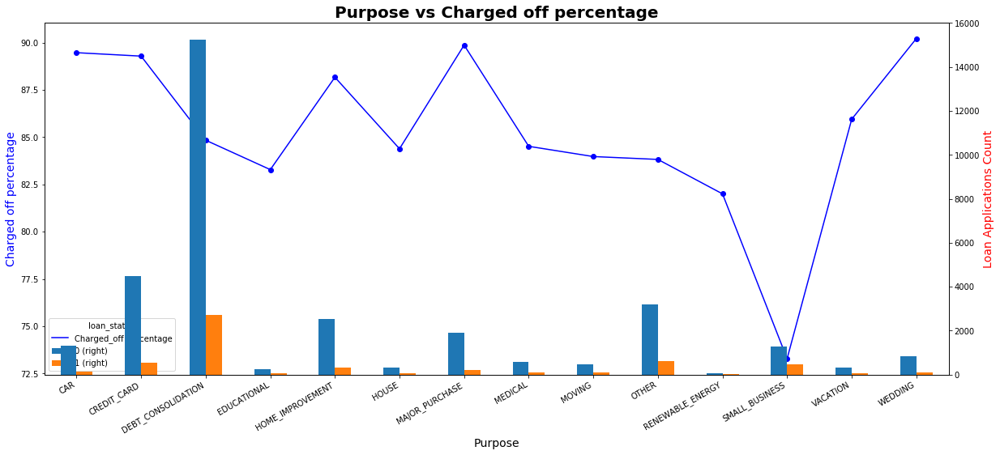

In [168]:
# lets call the our functions table and bivar to plot graphs 
x = table('purpose')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='purpose',stacked=False) 

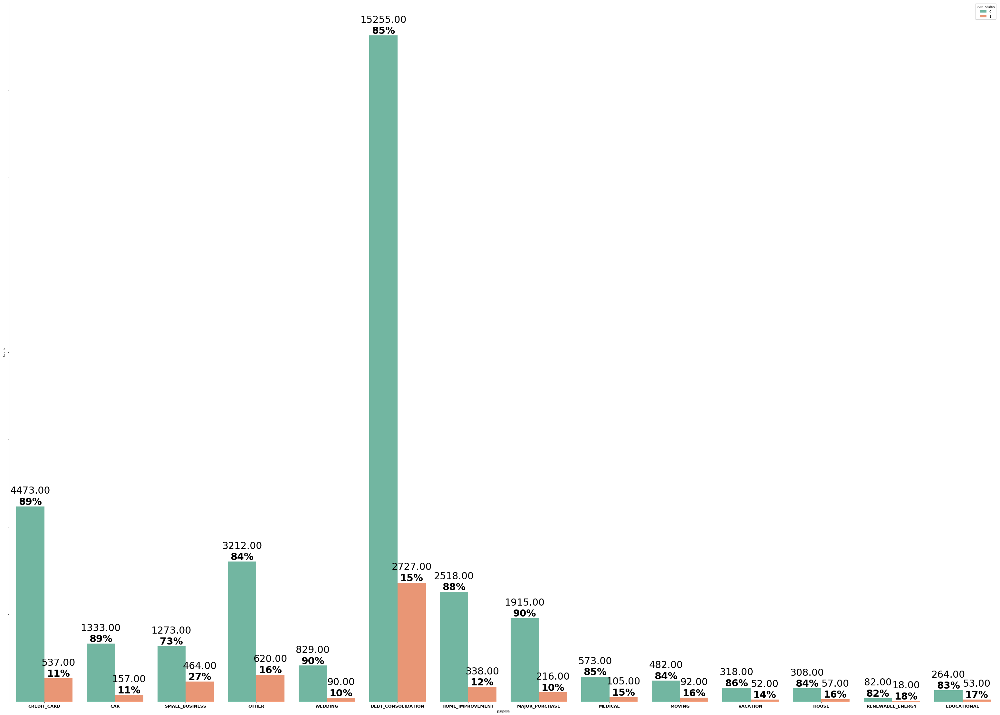

In [169]:
plt.subplots(figsize = (55,40))
ax = sns.countplot(df['purpose'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,30,spacing = 34)
ax = annotate_count_plots(ax,font = 30)
plt.show()

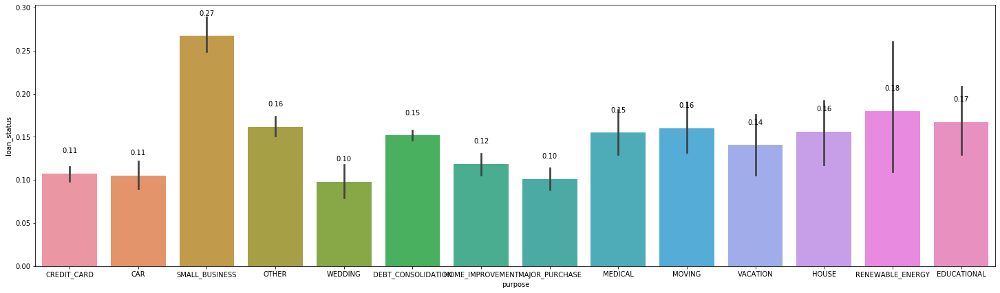

In [170]:
plt.subplots(figsize = (25,7))
ax = sns.barplot(x = df.purpose,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 28)
plt.show()

### Observation
- From the above observation it is seen that Small Business has highest default rate almost about 27%

### Dti

In [171]:
df.dti.describe(percentiles = [0,0.1,0.2,0.206,.25,0.3,0.335,0.4,0.45,0.5,0.6,0.7,0.75,0.8,0.9,0.95,1])

count    38361.000000
mean        13.277361
std          6.668639
min          0.000000
0%           0.000000
10%          4.070000
20%          6.930000
20.6%        7.100000
25%          8.140000
30%          9.250000
33.5%       10.006000
40%         11.350000
45%         12.400000
50%         13.370000
60%         15.310000
70%         17.430000
75%         18.560000
80%         19.710000
90%         22.290000
95%         23.800000
100%        29.990000
max         29.990000
Name: dti, dtype: float64

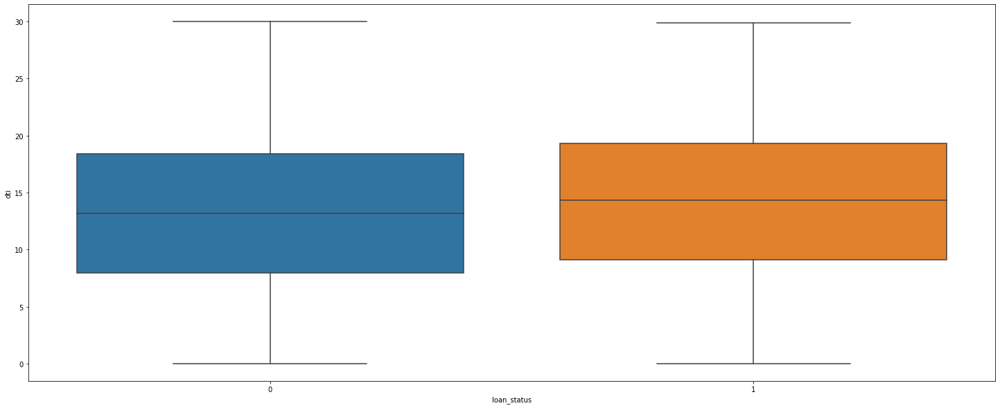

In [172]:
plt.subplots(figsize = (25,10))
sns.boxplot(y = df.dti,x = df.loan_status)
plt.show()

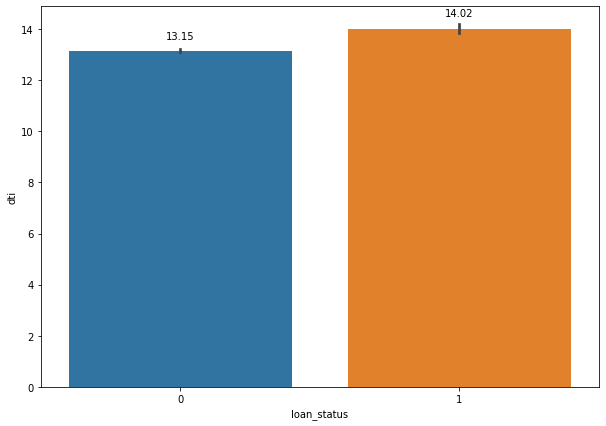

In [173]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(y = df.dti,x = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 10)
plt.show()

In [174]:
x25 = df['dti'].quantile(0.25)
x50 = df['dti'].quantile(0.5)
x75 = df['dti'].quantile(0.75)
x100 = df['dti'].quantile(1)

def dti(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low dti'
    elif ((x > x25) & (x <= x50)):
        return 'medium dti'
    elif ((x > x50) & (x <= x75)):
        return 'High dti'
    elif ((x > x75) & (x <= x100)):
        return 'Very High dti'

df['dti_cat'] = df['dti'].apply(lambda x: dti(x,x25,x50,x75,x100))

### DTI category v/s Charged off percentage

loan_status,0,1,All,Charged_off percentage
dti_cat,,,,
low dti,8434,1163,9597,87.882
medium dti,8277,1312,9589,86.318
High dti,8134,1464,9598,84.747
Very High dti,7990,1587,9577,83.429


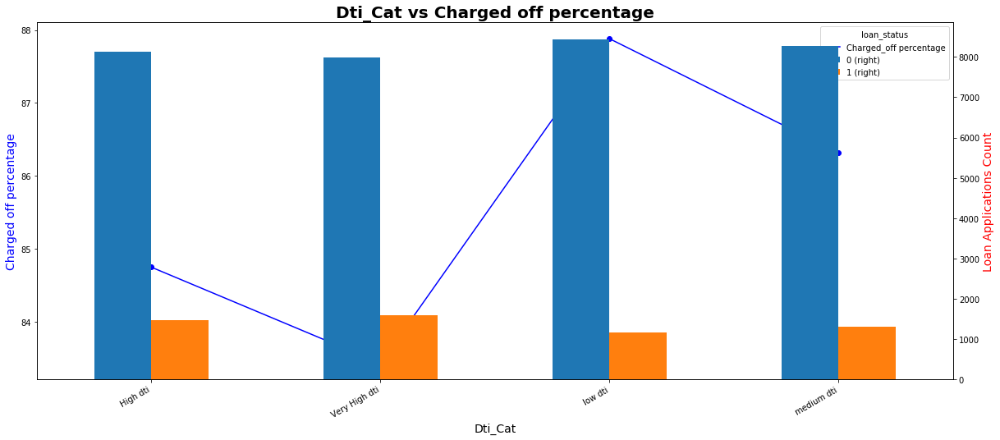

In [175]:
# lets call the our functions table and bivar to plot graphs 
x = table('dti_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='dti_cat',stacked=False) 

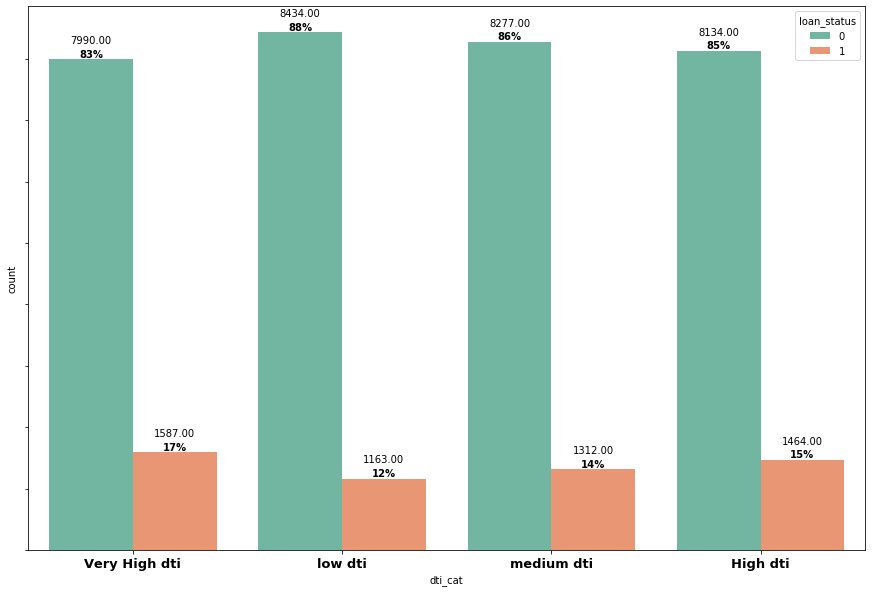

In [176]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['dti_cat'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

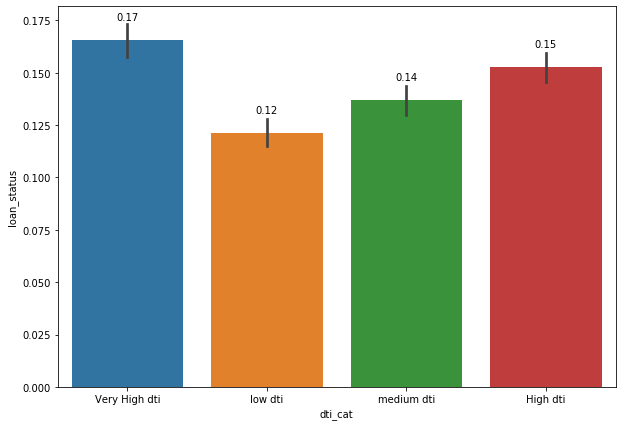

In [177]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.dti_cat,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Observation
- From the above analysis it is observed that Very high dti translates into higher default rates, which ranges from 18.56 to 29.99

### Issue date (Issue_d)

In [178]:
df.issue_d

0       2011-12-01
1       2011-12-01
2       2011-12-01
3       2011-12-01
5       2011-12-01
           ...    
39712   2007-07-01
39713   2007-07-01
39714   2007-07-01
39715   2007-07-01
39716   2007-06-01
Name: issue_d, Length: 38361, dtype: datetime64[ns]

In [179]:
df['issue_d_year'] = df.issue_d.apply(lambda x: x.year)

In [180]:
df['issue_d_month'] = df.issue_d.apply(lambda x: x.month)

In [181]:
df.issue_d_year.value_counts()

2011    20417
2010    11466
2009     4679
2008     1552
2007      247
Name: issue_d_year, dtype: int64

In [182]:
df.issue_d_month.value_counts()

12    4203
11    3983
10    3736
9     3479
8     3374
7     3327
6     3152
5     2907
4     2821
3     2671
1     2363
2     2345
Name: issue_d_month, dtype: int64

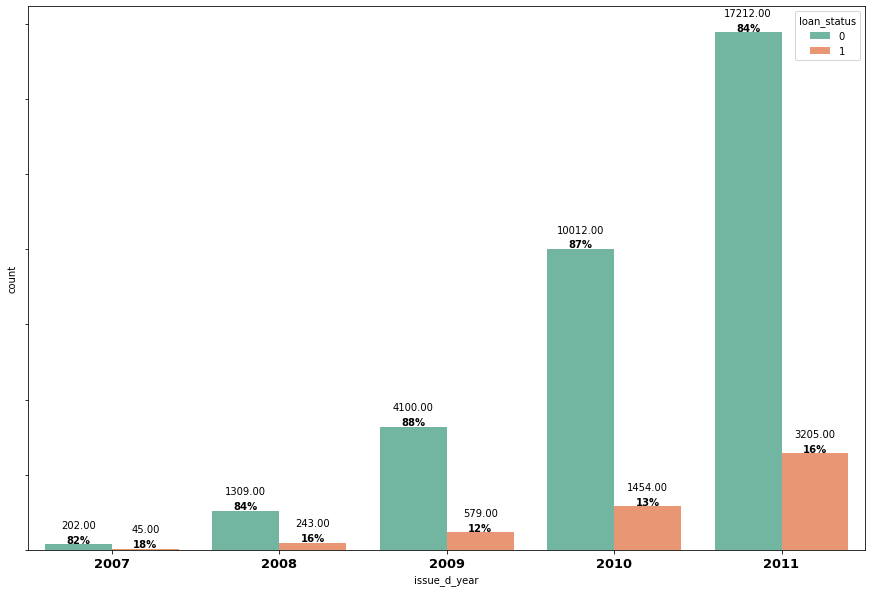

In [183]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df.issue_d_year, palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

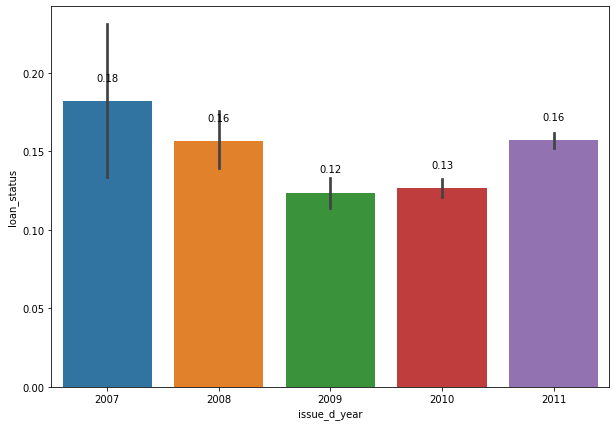

In [184]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.issue_d_year,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

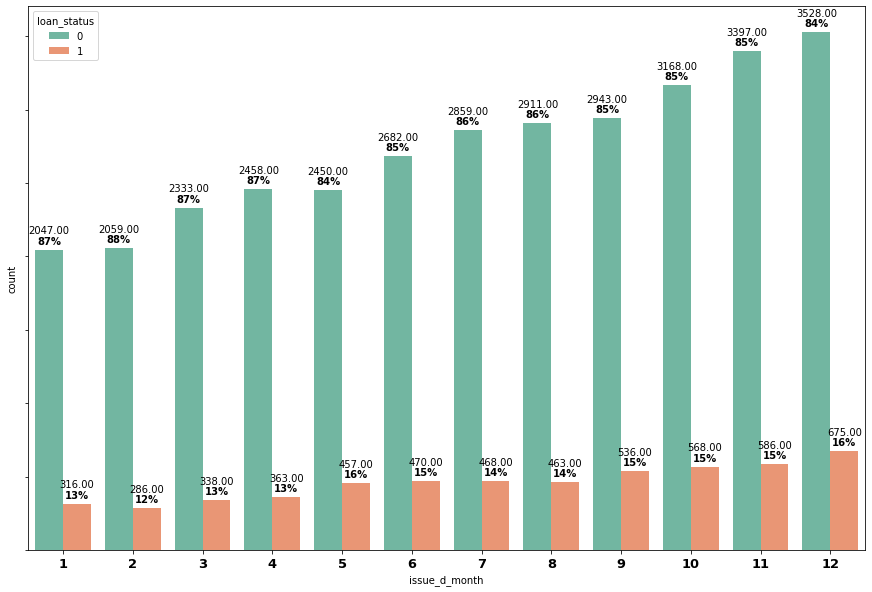

In [185]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df.issue_d_month, palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

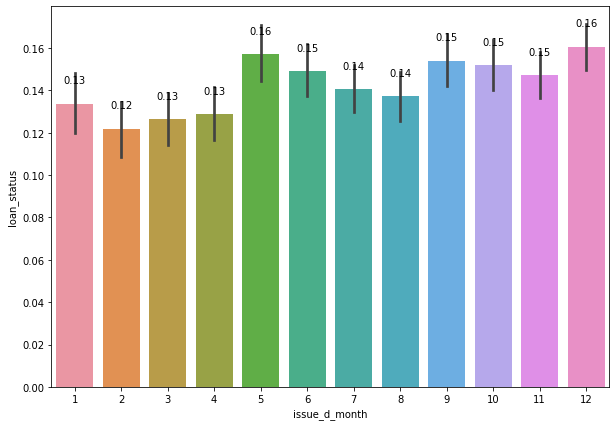

In [186]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.issue_d_month,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Funded Amount (funded_amnt)


In [187]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38361 entries, 0 to 39716
Data columns (total 32 columns):
loan_amnt                  38361 non-null int64
funded_amnt                38361 non-null int64
funded_amnt_inv            38361 non-null float64
term months                38361 non-null float64
int_rate %                 38361 non-null float64
installment                38361 non-null float64
grade                      38361 non-null object
sub_grade                  38361 non-null object
emp_length                 38361 non-null int64
home_ownership             38361 non-null object
annual_inc                 38361 non-null float64
verification_status        38361 non-null object
issue_d                    38361 non-null datetime64[ns]
loan_status                38361 non-null int64
purpose                    38361 non-null object
dti                        38361 non-null float64
open_acc                   38361 non-null int64
pub_rec                    38361 non-null int64
r

In [188]:
df.funded_amnt.describe(percentiles = [0,0.1,0.2,.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,0.95,1])

count    38361.000000
mean     10795.745679
std       7086.652463
min        500.000000
0%         500.000000
10%       3100.000000
20%       5000.000000
25%       5200.000000
30%       6000.000000
40%       7500.000000
50%       9600.000000
60%      11000.000000
70%      13000.000000
75%      15000.000000
80%      16000.000000
90%      20000.000000
95%      25000.000000
100%     35000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

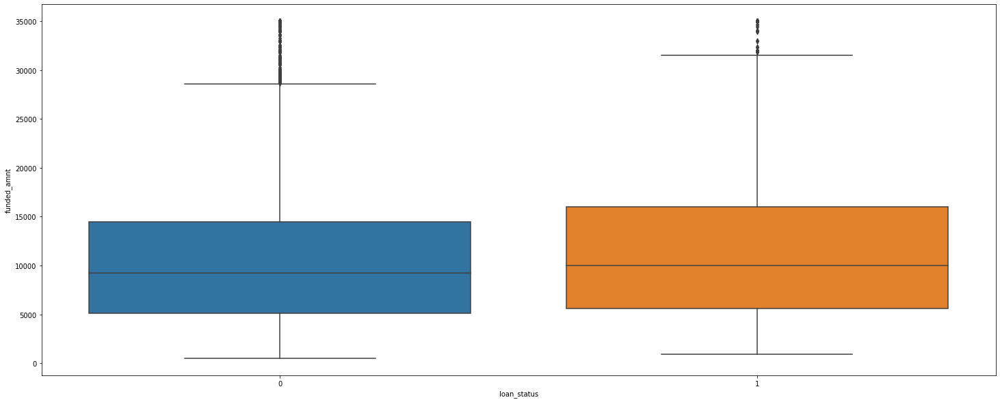

In [189]:
plt.subplots(figsize = (25,10))
sns.boxplot(y = df.funded_amnt,x = df.loan_status)
plt.show()

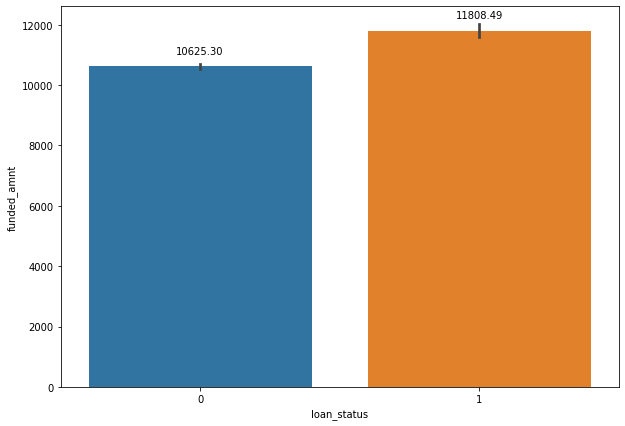

In [190]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(y = df.funded_amnt,x = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 10)
plt.show()

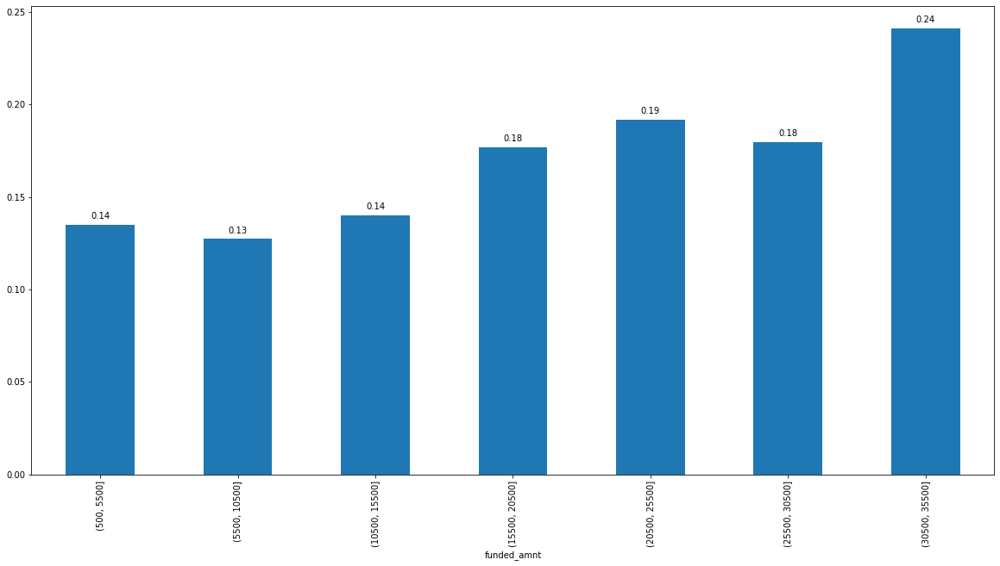

In [191]:
plt.figure(figsize=(20,10))
bins = np.arange(df['funded_amnt'].min(),df['funded_amnt'].max() + 5000, 5000)
ax = df.groupby(pd.cut(df['funded_amnt'], bins=bins)).loan_status.mean().plot(kind = 'bar')#.count()
add_value_labels_plots(ax,10,spacing = 5)
plt.show()

In [192]:
x25 =df.funded_amnt.quantile(0.25)
x50 = df.funded_amnt.quantile(0.5)
x75 = df.funded_amnt.quantile(0.75)
x100 = df.funded_amnt.quantile(1)

def funded_amnt(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low funded_amnt'
    elif ((x > x25) & (x <= x50)):
        return 'medium funded_amnt'
    elif ((x > x50) & (x <= x75)):
        return 'High funded_amnt'
    elif ((x > x75) & (x <= x100)):
        return 'Very High funded_amnt'

df['funded_amnt_cat'] = df.funded_amnt.apply(lambda x: funded_amnt(x,x25,x50,x75,x100))

### Funded amount category v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
funded_amnt_cat,,,,
medium funded_amnt,8653,1232,9885,87.537
High funded_amnt,9279,1463,10742,86.381
low funded_amnt,8305,1310,9615,86.375
Very High funded_amnt,6598,1521,8119,81.266


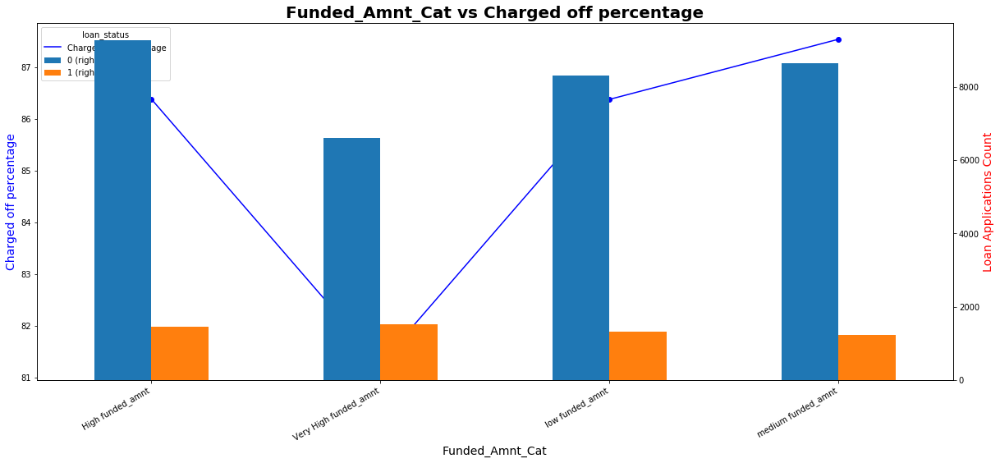

In [193]:
# lets call the our functions table and bivar to plot graphs 
x = table('funded_amnt_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='funded_amnt_cat',stacked=False) 

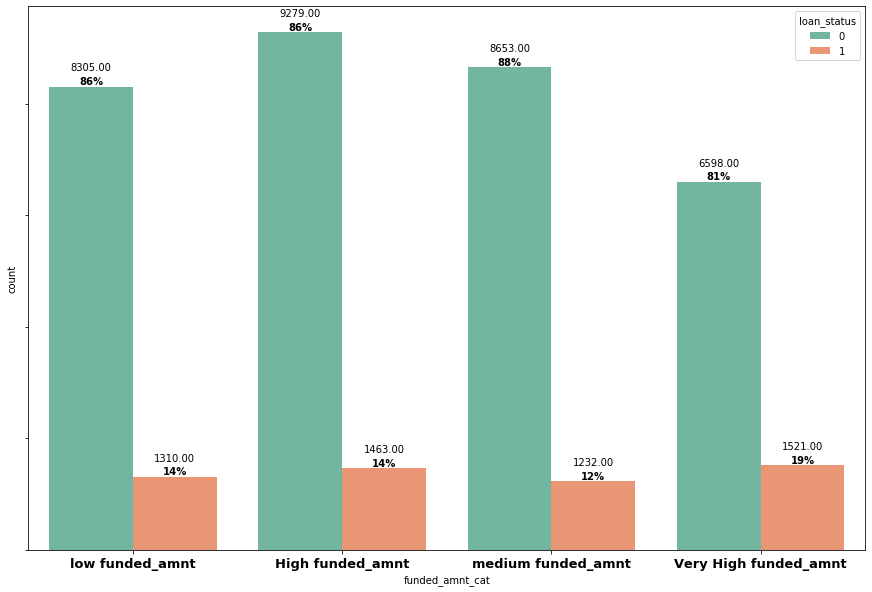

In [194]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df.funded_amnt_cat, palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

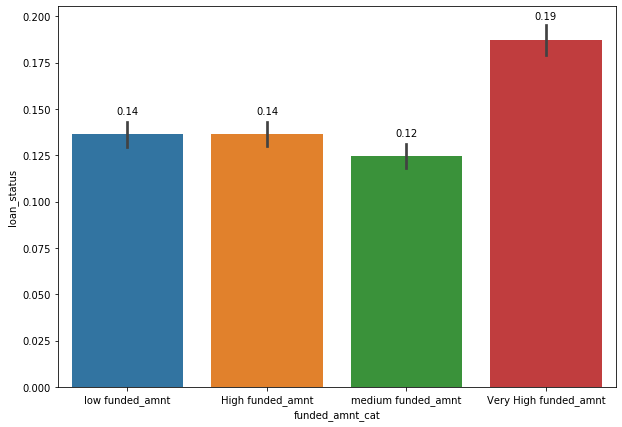

In [195]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.funded_amnt_cat,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Observation
- Very high funded_amnt has high default cases comparitively, the range between 75th quantile and 100th quantile has highest default cases.

### Revolving line utilization rate (revol_util %)

In [196]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38361 entries, 0 to 39716
Data columns (total 33 columns):
loan_amnt                  38361 non-null int64
funded_amnt                38361 non-null int64
funded_amnt_inv            38361 non-null float64
term months                38361 non-null float64
int_rate %                 38361 non-null float64
installment                38361 non-null float64
grade                      38361 non-null object
sub_grade                  38361 non-null object
emp_length                 38361 non-null int64
home_ownership             38361 non-null object
annual_inc                 38361 non-null float64
verification_status        38361 non-null object
issue_d                    38361 non-null datetime64[ns]
loan_status                38361 non-null int64
purpose                    38361 non-null object
dti                        38361 non-null float64
open_acc                   38361 non-null int64
pub_rec                    38361 non-null int64
r

In [197]:
df['revol_util %']

0        83.7
1         9.4
2        98.5
3        21.0
5        28.3
         ... 
39712    13.1
39713    26.9
39714    19.4
39715     0.7
39716    51.5
Name: revol_util %, Length: 38361, dtype: float64

In [198]:
df['revol_util %'].describe(percentiles = [0.1,0.20,.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,1])

count    38361.000000
mean        48.725699
std         28.356986
min          0.000000
10%          8.500000
20%         20.000000
25%         25.200000
30%         30.300000
40%         39.900000
50%         49.100000
60%         58.200000
70%         67.500000
75%         72.300000
80%         77.300000
90%         87.800000
100%        99.900000
max         99.900000
Name: revol_util %, dtype: float64

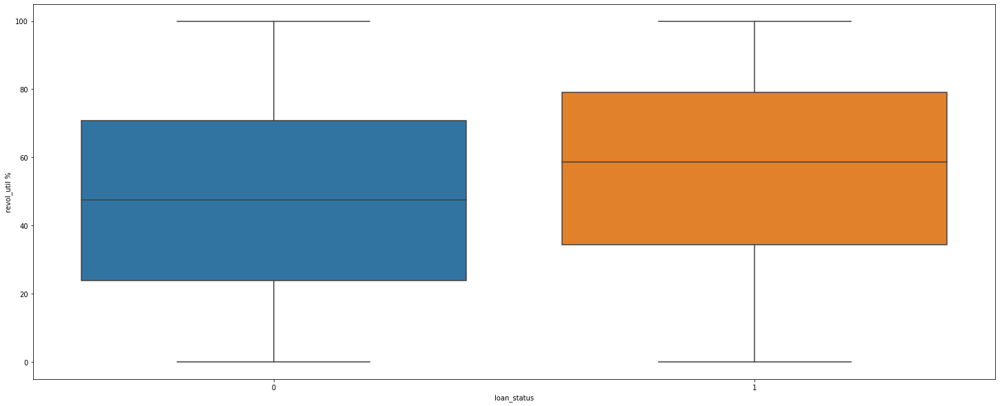

In [199]:
plt.subplots(figsize = (25,10))
sns.boxplot(y = df['revol_util %'],x = df.loan_status)
plt.show()

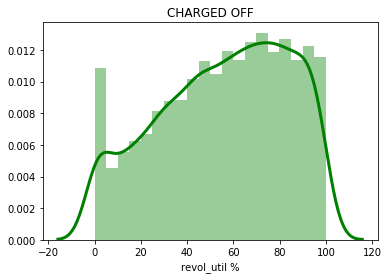

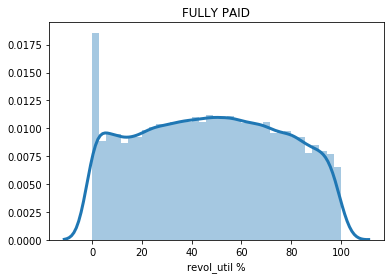

In [200]:
sns.distplot(df[df.loan_status == 1]['revol_util %'],hist = True,color = 'Green', kde = True, kde_kws = {'linewidth' : 3})
plt.title("CHARGED OFF")
plt.show()

sns.distplot(df[df.loan_status == 0]['revol_util %'],hist = True, kde = True, kde_kws = {'linewidth' : 3})
plt.title("FULLY PAID")
plt.show()

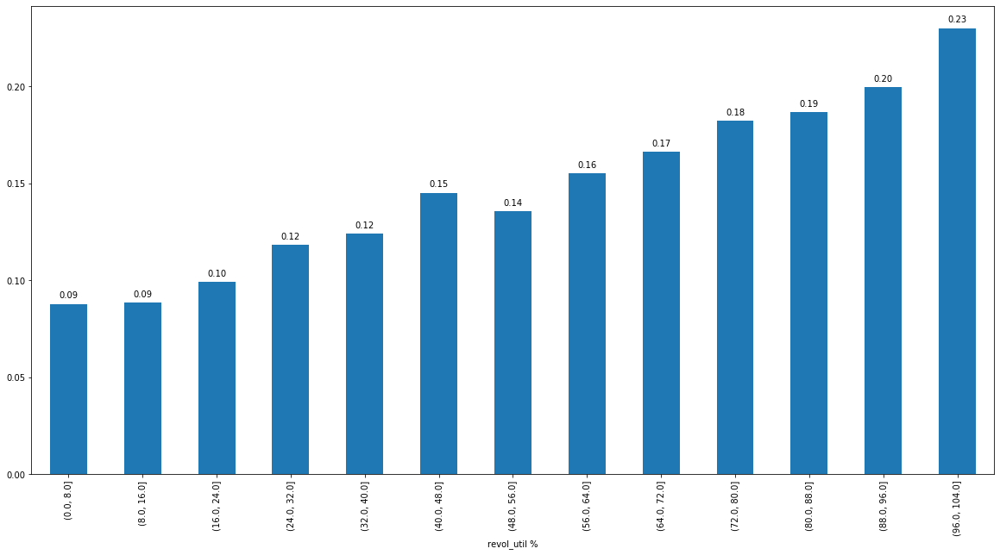

In [201]:
plt.figure(figsize=(20,10))
bins = np.arange(df['revol_util %'].min(),df['revol_util %'].max() + 8, 8)
ax = df.groupby(pd.cut(df['revol_util %'], bins=bins)).loan_status.mean().plot(kind = 'bar')
add_value_labels_plots(ax,10,spacing = 5)
plt.show()

In [202]:
x25 = df['revol_util %'].quantile(0.25)
x50 = df['revol_util %'].quantile(0.5)
x75 = df['revol_util %'].quantile(0.75)
x100 = df['revol_util %'].quantile(1)

def revol_util(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low revol_util'
    elif ((x > x25) & (x <= x50)):
        return 'medium revol_util'
    elif ((x > x50) & (x <= x75)):
        return 'High revol_util'
    elif ((x > x75) & (x <= x100)):
        return 'Very High revol_util'

In [203]:
df['revol_util_cat %'] = df['revol_util %'].apply(lambda x: revol_util(x,x25,x50,x75,x100))

#### Revol Util Cat v/s Charged off percentage.

loan_status,0,1,All,Charged_off percentage
revol_util_cat %,,,,
low revol_util,8655,944,9599,90.166
medium revol_util,8355,1242,9597,87.058
High revol_util,8113,1484,9597,84.537
Very High revol_util,7712,1856,9568,80.602


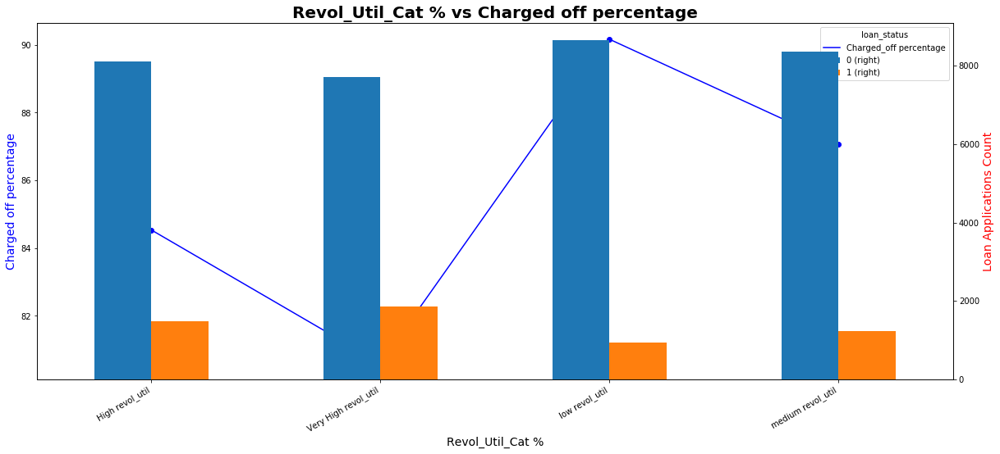

In [204]:
# lets call the our functions table and bivar to plot graphs 
x = table('revol_util_cat %')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='revol_util_cat %',stacked=False) 

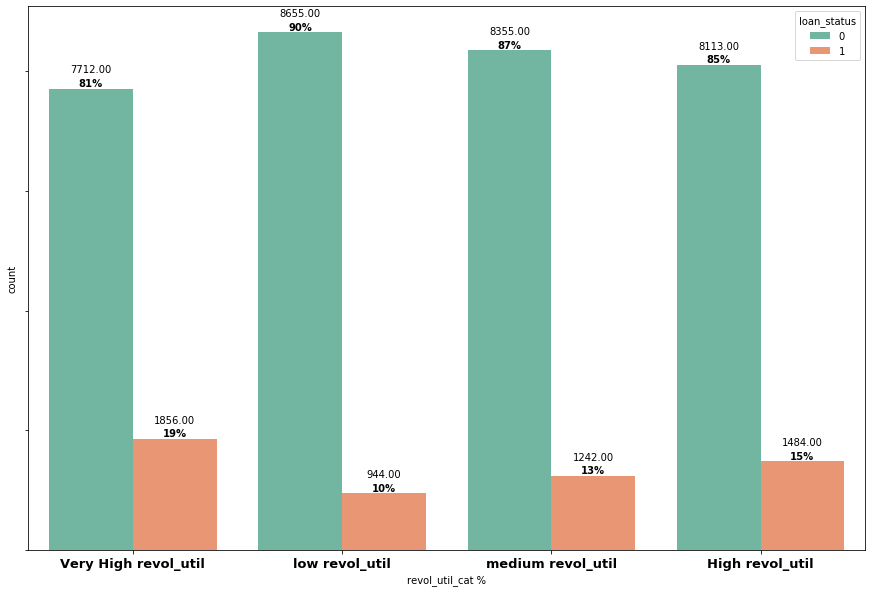

In [205]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['revol_util_cat %'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

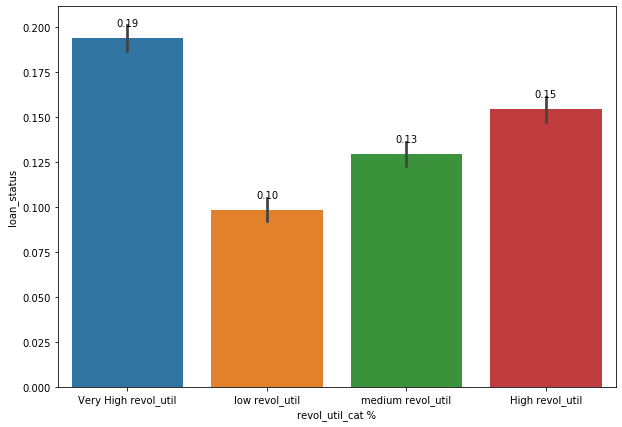

In [206]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df['revol_util_cat %'],y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 10)
plt.show()

### Observation
- Custormers with high revolt_util rate has high default rate (directly proportional to each other)

### Installment

In [207]:
df.installment.describe()

count    38361.000000
mean       322.806530
std        208.574977
min         15.690000
25%        165.820000
50%        278.240000
75%        426.100000
max       1305.190000
Name: installment, dtype: float64

In [208]:
df.installment.describe(percentiles = [0.1,0.20,.25,0.3,0.4,0.5,0.6,0.7,0.75,0.8,0.9,1])

count    38361.000000
mean       322.806530
std        208.574977
min         15.690000
10%         99.350000
20%        150.300000
25%        165.820000
30%        186.610000
40%        229.140000
50%        278.240000
60%        328.040000
70%        387.150000
75%        426.100000
80%        481.210000
90%        620.900000
100%      1305.190000
max       1305.190000
Name: installment, dtype: float64

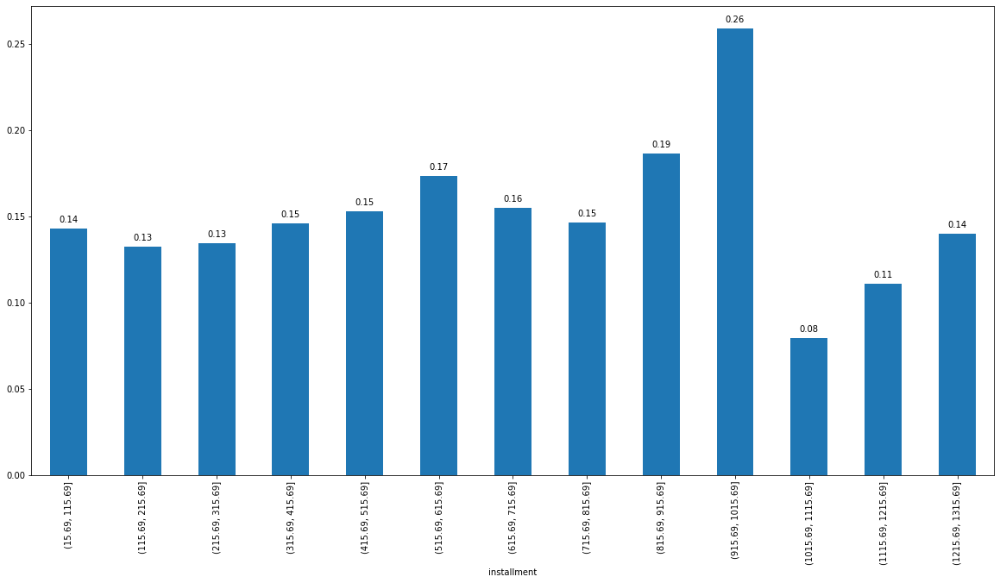

In [209]:
plt.figure(figsize=(20,10))
bins = np.arange(df['installment'].min(),df['installment'].max() + 100, 100)
ax = df.groupby(pd.cut(df['installment'], bins=bins)).loan_status.mean().plot(kind = 'bar')
add_value_labels_plots(ax,10,spacing = 5)
plt.show()

In [210]:
x25 = df['installment'].quantile(0.25)
x50 = df['installment'].quantile(0.5)
x75 = df['installment'].quantile(0.75)
x100 = df['installment'].quantile(1)

def installment(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low installment'
    elif ((x > x25) & (x <= x50)):
        return 'medium installment'
    elif ((x > x50) & (x <= x75)):
        return 'High installment'
    elif ((x > x75) & (x <= x100)):
        return 'Very High installment'

df['installment_cat'] = df['installment'].apply(lambda x: installment(x,x25,x50,x75,x100))

### Installment Category v/s Charged off percentage

loan_status,0,1,All,Charged_off percentage
installment_cat,,,,
medium installment,8303,1287,9590,86.580
low installment,8287,1304,9591,86.404
High installment,8221,1387,9608,85.564
Very High installment,8024,1548,9572,83.828


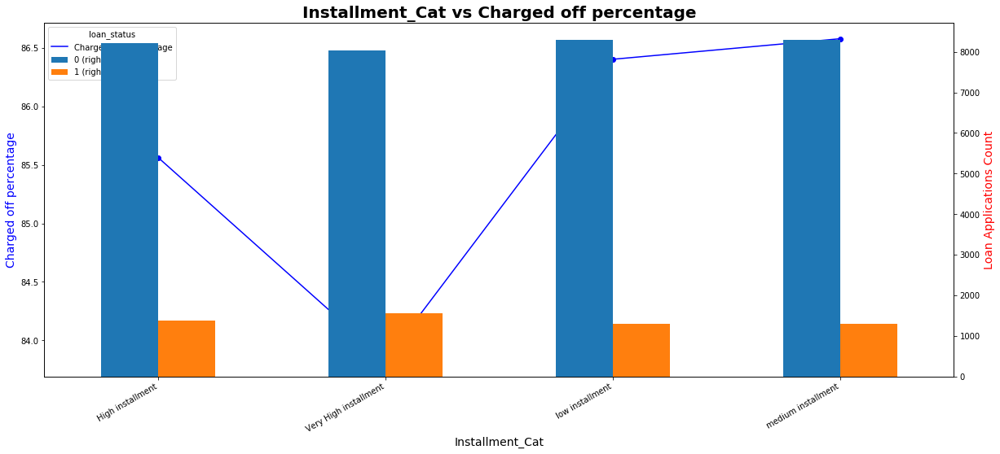

In [211]:
# lets call the our functions table and bivar to plot graphs 
x = table('installment_cat')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='installment_cat',stacked=False) 

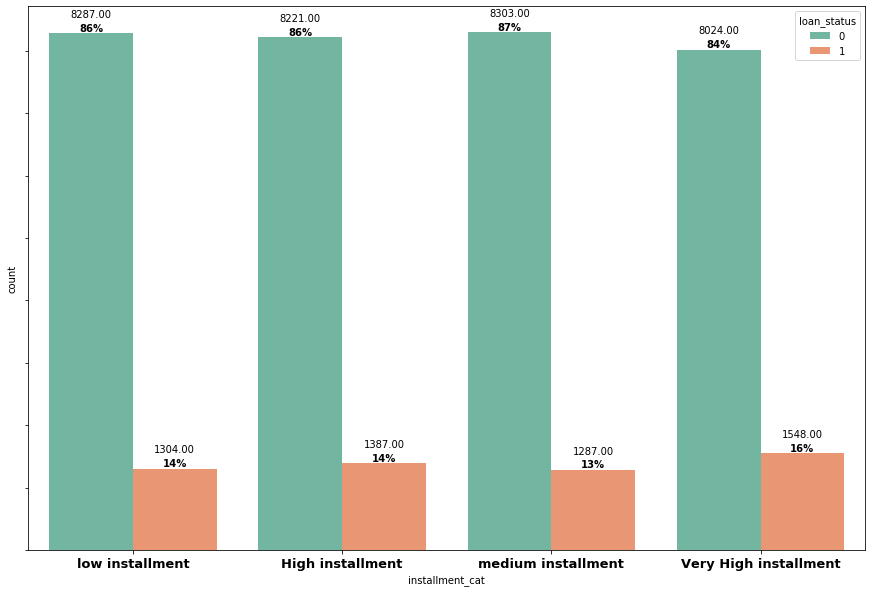

In [212]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['installment_cat'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

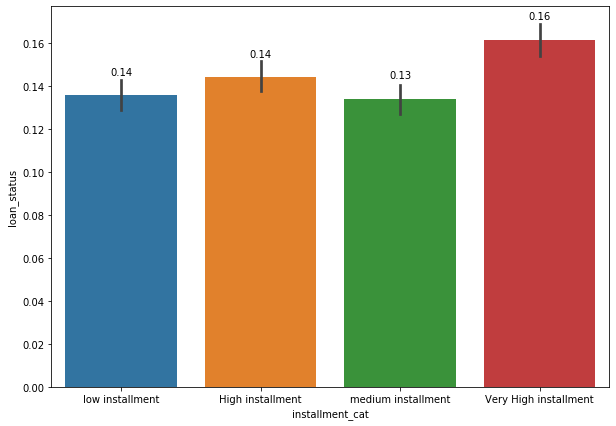

In [213]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df.installment_cat,y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Observation
- It is observed that installments with very high rate have high defaults, especially for installments between the range 915 - 1015, has very high default rate close to 26%.

### Pub_Rec_bankruptcies

In [214]:
df.pub_rec_bankruptcies.describe()

count    38361.000000
mean         0.042543
std          0.202472
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: pub_rec_bankruptcies, dtype: float64

In [215]:
df.pub_rec_bankruptcies.value_counts()

0.0    36734
1.0     1622
2.0        5
Name: pub_rec_bankruptcies, dtype: int64

### Public Record Bankruptcies v/s Charged off percentage

loan_status,0,1,All,Charged_off percentage
pub_rec_bankruptcies,,,,
0.0,31568,5166,36734,85.937
1.0,1264,358,1622,77.928
2.0,3,2,5,60.000


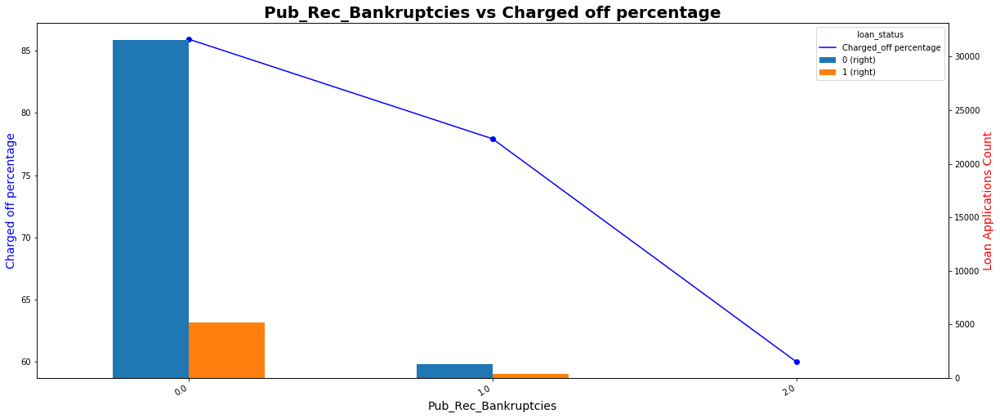

In [216]:
# lets call the our functions table and bivar to plot graphs 
x = table('pub_rec_bankruptcies')

# Displaying the output in descending order based on the 'Charged_off percentage' column
display(x.sort_values('Charged_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='pub_rec_bankruptcies',stacked=False) 

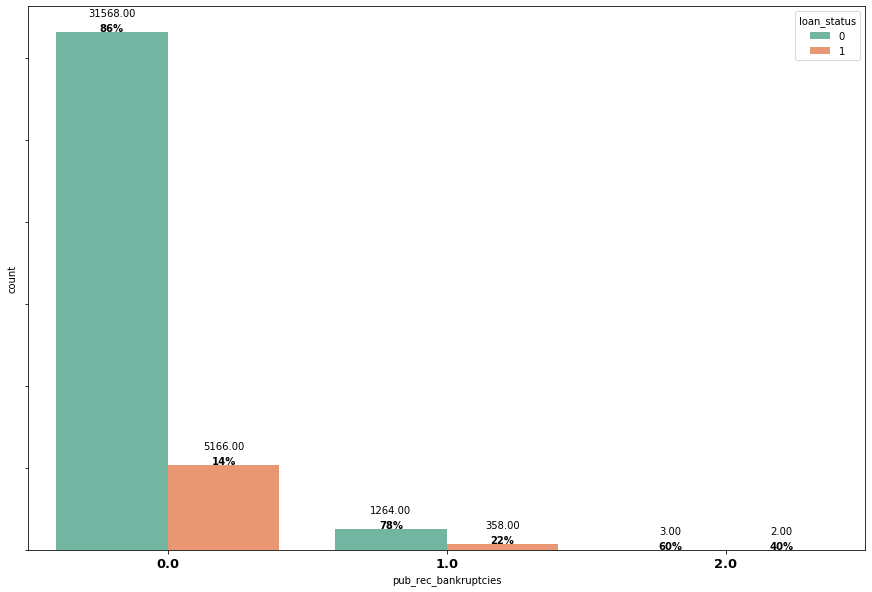

In [217]:
plt.subplots(figsize = (15,10))
ax = sns.countplot(df['pub_rec_bankruptcies'], palette="Set2", hue = df.loan_status)
add_value_labels_plots(ax,10,spacing = 14)
ax = annotate_count_plots(ax,font = 10)
plt.show()

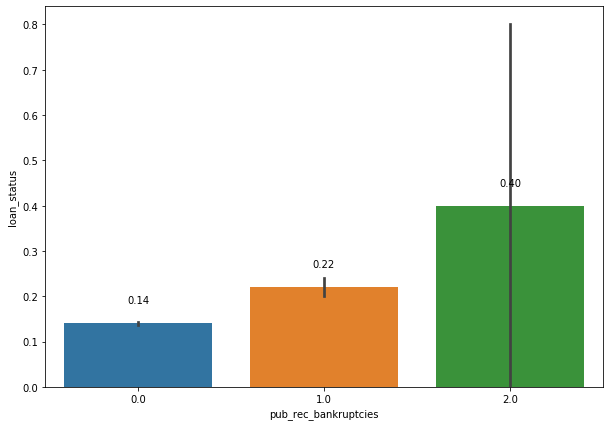

In [218]:
plt.subplots(figsize = (10,7))
ax = sns.barplot(x = df['pub_rec_bankruptcies'],y = df.loan_status,estimator = np.mean)
add_value_labels_plots(ax,10,spacing = 18)
plt.show()

### Observation
- Custormers with bankruptcies equal 1 or greater than 1 have hifh chances of default rates.

#### Lets summarise  the impact of each variable on loan_status

In [219]:
def influence_percentage(cols):
        dictionary = dict()
        for i in cols:
            x = df.groupby(i).loan_status.mean().sort_values(ascending = False)
            y = round(100*round((x[0] - x[-1]),2),2)  
            dictionary.update({i:y})
        
        return dictionary
                       

In [220]:
x = list(df.loc[:, df.dtypes == object].columns)
y = influence_percentage(x)
print(y)

{'grade': 27.0, 'sub_grade': 46.0, 'home_ownership': 5.0, 'verification_status': 4.0, 'purpose': 17.0, 'loan_amnt_cat': 6.0, 'emp_length_cat': 2.0, 'int_rate_cat %': 19.0, 'annual_inc_cat': 7.0, 'dti_cat': 4.0, 'funded_amnt_cat': 6.0, 'revol_util_cat %': 10.0, 'installment_cat': 3.0}


In [221]:
sorted(y.values())

[2.0, 3.0, 4.0, 4.0, 5.0, 6.0, 6.0, 7.0, 10.0, 17.0, 19.0, 27.0, 46.0]

In [222]:
x1 = df.groupby('term months').loan_status.mean().sort_values(ascending = False)
print(x1)

term months
60.0    0.251166
36.0    0.109110
Name: loan_status, dtype: float64


In [223]:
x2 = df.groupby('pub_rec_bankruptcies').loan_status.mean().sort_values(ascending = False)
print(x2)

pub_rec_bankruptcies
2.0    0.400000
1.0    0.220715
0.0    0.140633
Name: loan_status, dtype: float64


In [224]:
print(round(100*(x2[2] - x2[0]),2))
print(round(100*(0.251166 - 0.109110)))

25.94
14


#### sub_grade : 46.0 %
#### pub_rec_bankruptcies : 26%
#### int_rate  : 19 %
#### purpose : 17 %
#### term : 15 %
#### revol_util : 9%
#### annual_inc : 7%

#### It is observed that the average charged off rate is around 14.4%, hence anything beyound that percentage must be considered for the analysis


## Bivariant Analysis

In [225]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38361 entries, 0 to 39716
Data columns (total 35 columns):
loan_amnt                  38361 non-null int64
funded_amnt                38361 non-null int64
funded_amnt_inv            38361 non-null float64
term months                38361 non-null float64
int_rate %                 38361 non-null float64
installment                38361 non-null float64
grade                      38361 non-null object
sub_grade                  38361 non-null object
emp_length                 38361 non-null int64
home_ownership             38361 non-null object
annual_inc                 38361 non-null float64
verification_status        38361 non-null object
issue_d                    38361 non-null datetime64[ns]
loan_status                38361 non-null int64
purpose                    38361 non-null object
dti                        38361 non-null float64
open_acc                   38361 non-null int64
pub_rec                    38361 non-null int64
r

In [226]:
def bivariant_plots(cat1,cat2,cat3 = 'loan_status',plot1 = True,plot2 = True, plot3 = True,x1 = 25,y1 = 15,x2 = 25,y2 = 15,axsize1 = 10,spacing1 = 15,axsize2 = 10,spacing2 = 29,Set = 'dark'):
    x = pd.crosstab([df[cat1],df[cat2]],df[cat3],margins=True)
    print(x)
    
    if plot1 == True:                                             # plots the bar plot for bivariant analysis,count, with stacked
        ax = pd.crosstab([df[cat1],df[cat2]],df[cat3])
        ax.plot(kind="bar", figsize=(15,8),  stacked=True)
        plt.show()
    
    if plot2 == True:                                        # barplots are plotted to understand the variation, mean of the variable
        plt.subplots(figsize = (x1,y1))
        ax = df.groupby([cat1,cat2])[cat3].mean().plot(kind='bar')
        add_value_labels_plots(ax,axsize1,spacing = spacing1)
        plt.show()
    
    if plot3 == True:                                       # Barplots are plotted for bivariant analysis
        plt.subplots(figsize = (x2,y2))
        ax = sns.barplot(x = df[cat2],y = df.loan_status,hue = df[cat1] ,palette=Set)
        add_value_labels_plots(ax,axsize2,spacing = spacing2)
        plt.show()
    

In [227]:
def bivariant_box_joint_plots(cat1,cat2,plot1 = True,plot2 = True,x = 20, y = 5):
        
        if plot1 == True:
            sns.jointplot(data=df[df.loan_status == 1], x=cat1, y=cat2)  # We obtain scatter plots   
            
        if plot2 == True:                     # We obtataine the spread of the data 
            plt.figure(figsize=(x,y))
            df.boxplot(column=cat1, by=cat2,figsize=(10,5))
            plt.show()
            
        

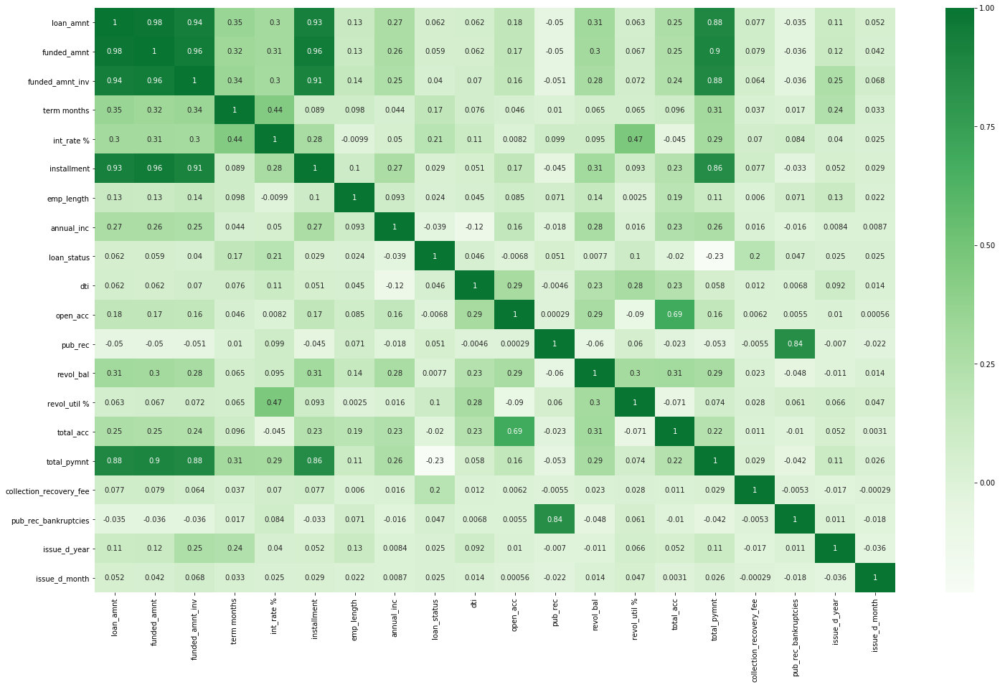

In [228]:
plt.subplots(figsize = (25,15))
x = df.corr()
sns.heatmap(x,cmap = 'Greens', annot=True, center=0.5)
plt.show()

### loan_status, interest_rate, emp_length

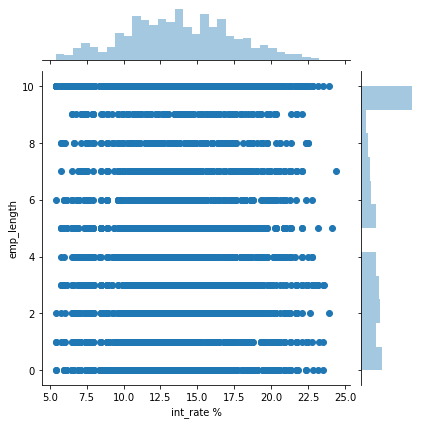

<Figure size 1440x360 with 0 Axes>

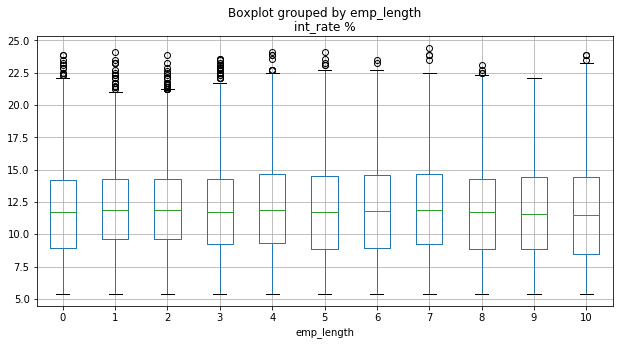

<Figure size 1440x360 with 0 Axes>

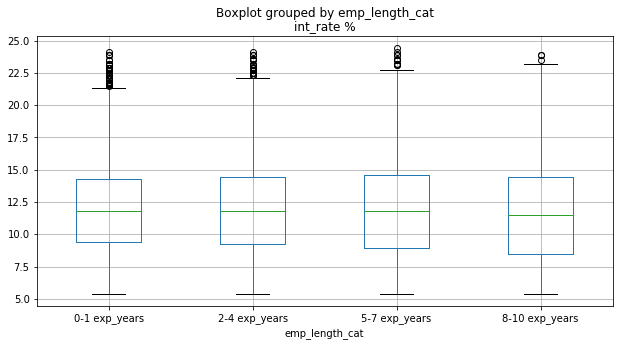

In [229]:
bivariant_box_joint_plots(cat2 = 'emp_length' ,cat1 = 'int_rate %',plot1 = True,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'emp_length_cat' ,cat1 = 'int_rate %',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                            0     1    All
emp_length_cat int_rate_cat %                        
0-1 exp_years  High int_rate        2748   466   3214
               Very High int-rate   2187   644   2831
               low int_rate         2655   165   2820
               medium int_rate      2681   352   3033
2-4 exp_years  High int_rate        1584   264   1848
               Very High int-rate   1424   443   1867
               low int_rate         1698    95   1793
               medium int_rate      1613   199   1812
5-7 exp_years  High int_rate        1426   279   1705
               Very High int-rate   1374   442   1816
               low int_rate         1703    95   1798
               medium int_rate      1521   196   1717
8-10 exp_years High int_rate        2294   495   2789
               Very High int-rate   2241   813   3054
               low int_rate         3136   222   3358
               medium int_rate      2550   356   2906
All                         

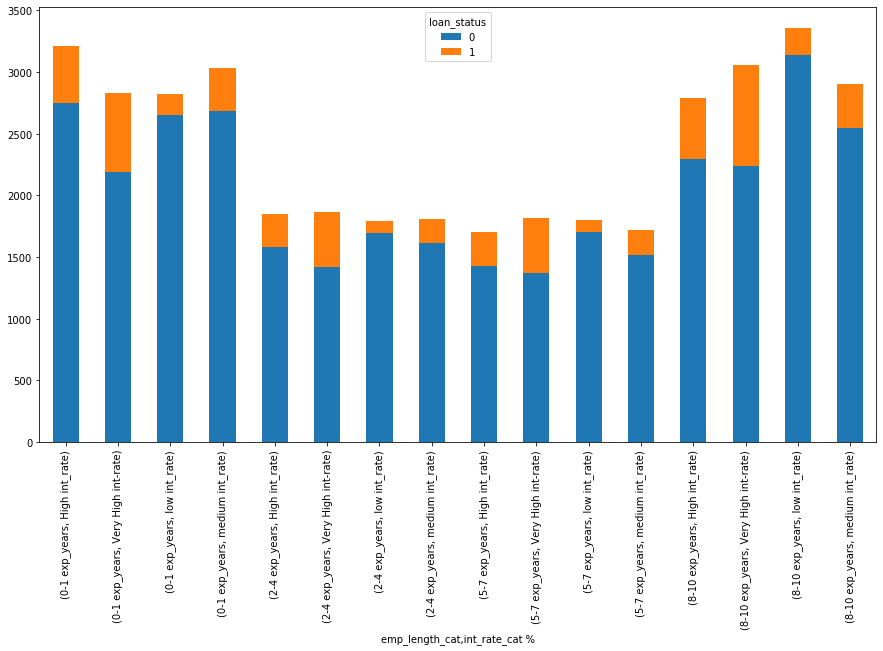

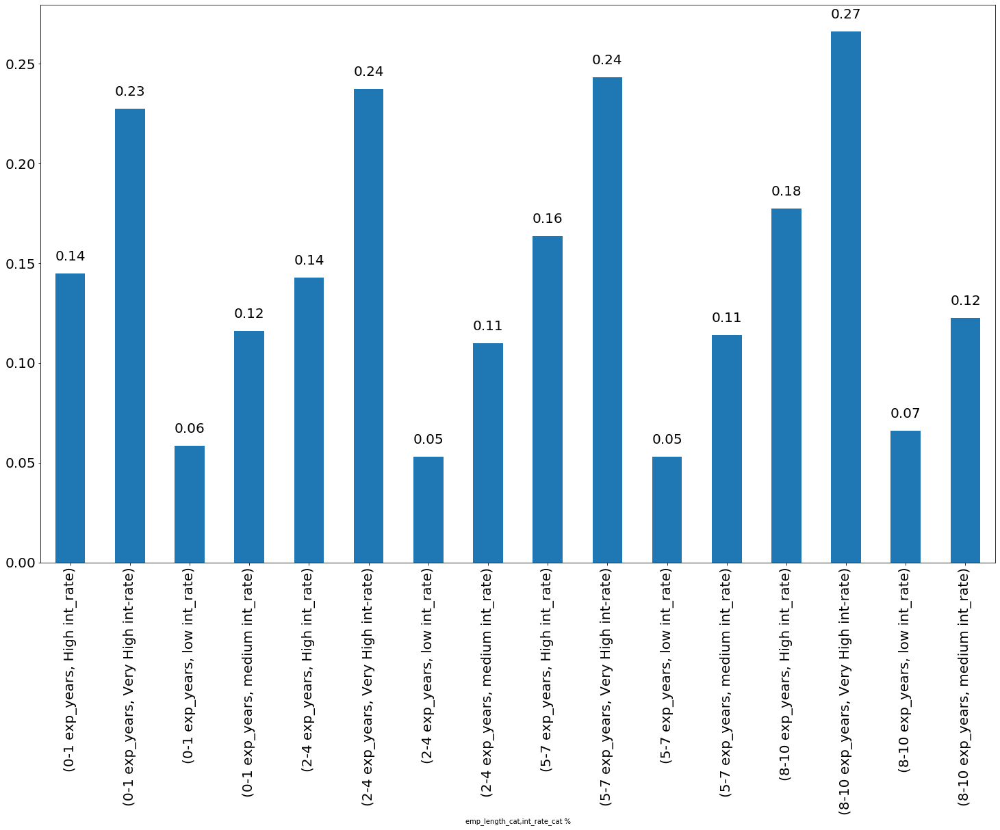

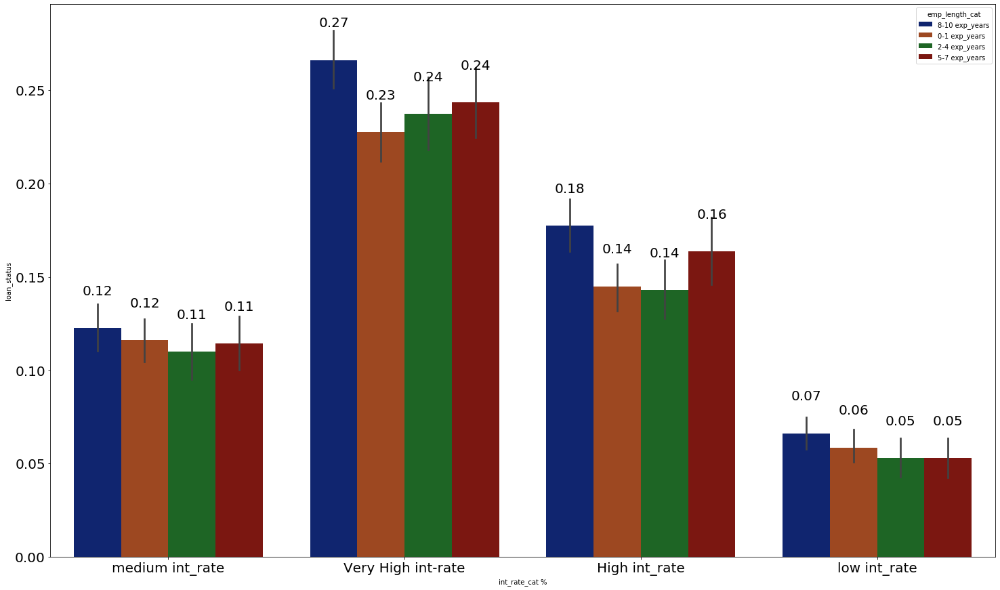

In [230]:
bivariant_plots('emp_length_cat','int_rate_cat %',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 20, spacing1 = 15, axsize2 = 20,spacing2 = 45,Set = 'dark' )

### Observation
- it is observed that as the intrest rate increases the default cases are proportionaly increasing. and another observation is default cases is highest for experience greater than 8 years for any intrest rate when compared to other experienced candidates

### loan_status, interest_rate, term

<Figure size 1440x360 with 0 Axes>

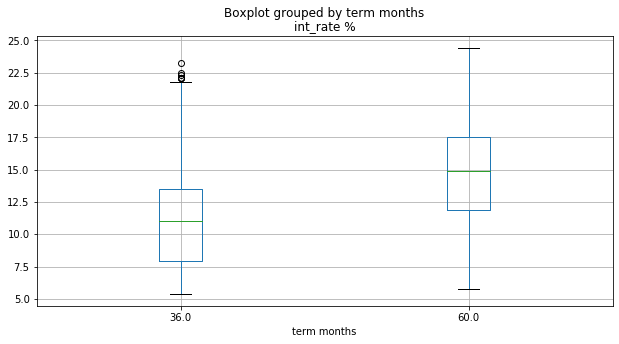

In [231]:
bivariant_box_joint_plots(cat2 = 'term months' ,cat1 = 'int_rate %',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                         0     1    All
term months int_rate_cat %                        
36.0        High int_rate        6299   986   7285
            Very High int-rate   3759   840   4599
            low int_rate         8796   535   9331
            medium int_rate      6915   795   7710
60.0        High int_rate        1753   518   2271
            Very High int-rate   3467  1502   4969
            low int_rate          396    42    438
            medium int_rate      1450   308   1758
All                             32835  5526  38361


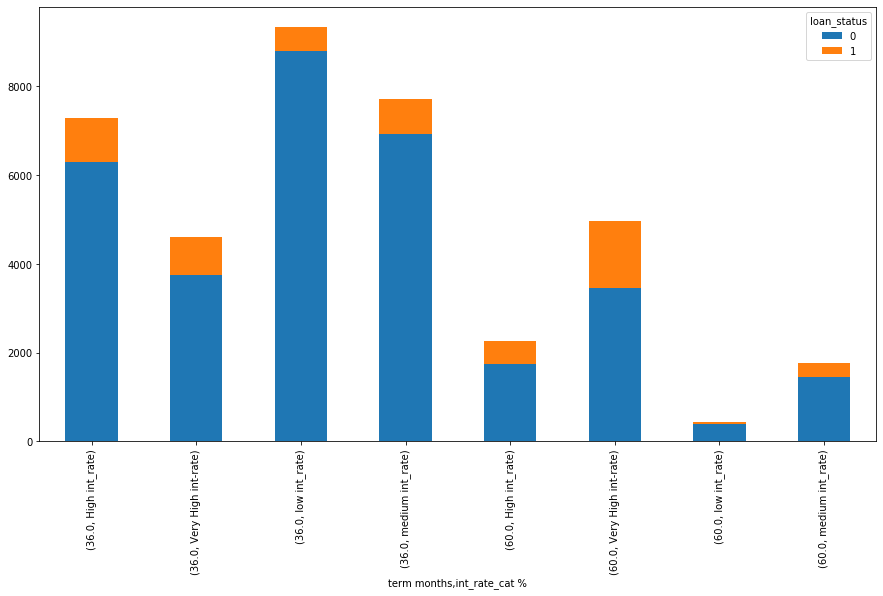

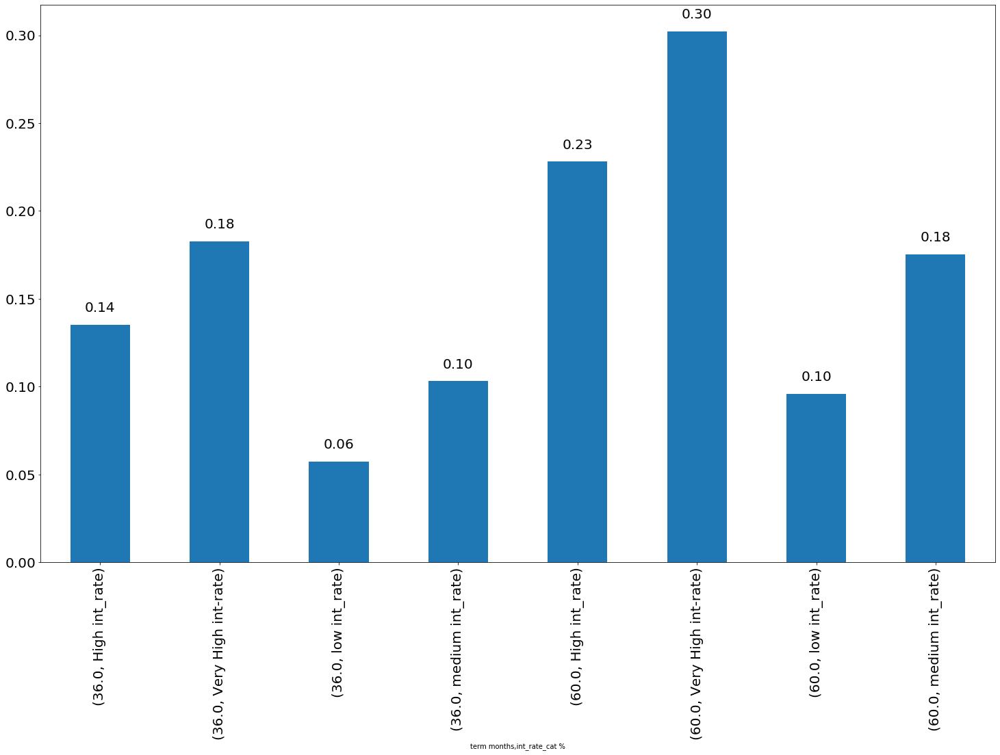

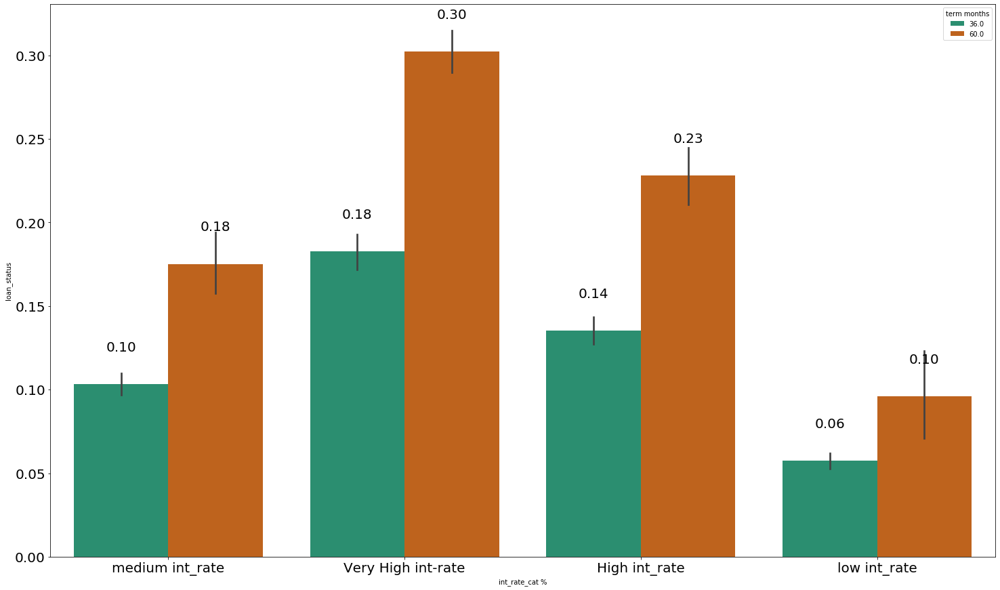

In [232]:
bivariant_plots('term months','int_rate_cat %',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 20, spacing1 = 15, axsize2 = 20,spacing2 = 45,Set = 'Dark2' )

### Observation
- It is observed that the rise in interest rate the default cases also increseas in both types of terms 60 months term must be avoided as it is seen that it carries high defaulters

### loan_status, interest_rate, Purpose

<Figure size 1440x360 with 0 Axes>

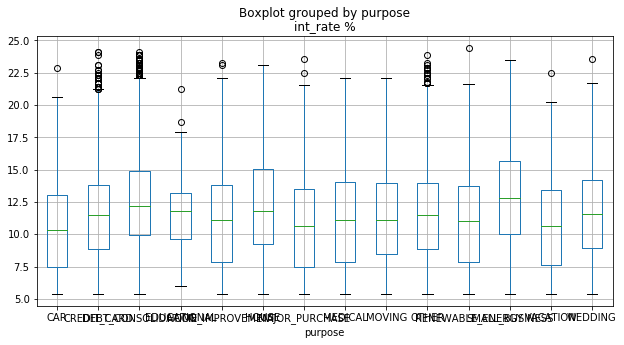

In [233]:
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                                0     1    All
int_rate_cat %     purpose                               
High int_rate      CAR                   242    34    276
                   CREDIT_CARD          1103   150   1253
                   DEBT_CONSOLIDATION   3986   734   4720
                   EDUCATIONAL           100    22    122
                   HOME_IMPROVEMENT      512   102    614
                   HOUSE                  68    12     80
                   MAJOR_PURCHASE        401    64    465
                   MEDICAL               123    30    153
                   MOVING                110    20    130
                   OTHER                 836   180   1016
                   RENEWABLE_ENERGY       18     3     21
                   SMALL_BUSINESS        278   112    390
                   VACATION               61    13     74
                   WEDDING               214    28    242
Very High int-rate CAR                   169    45    214
              

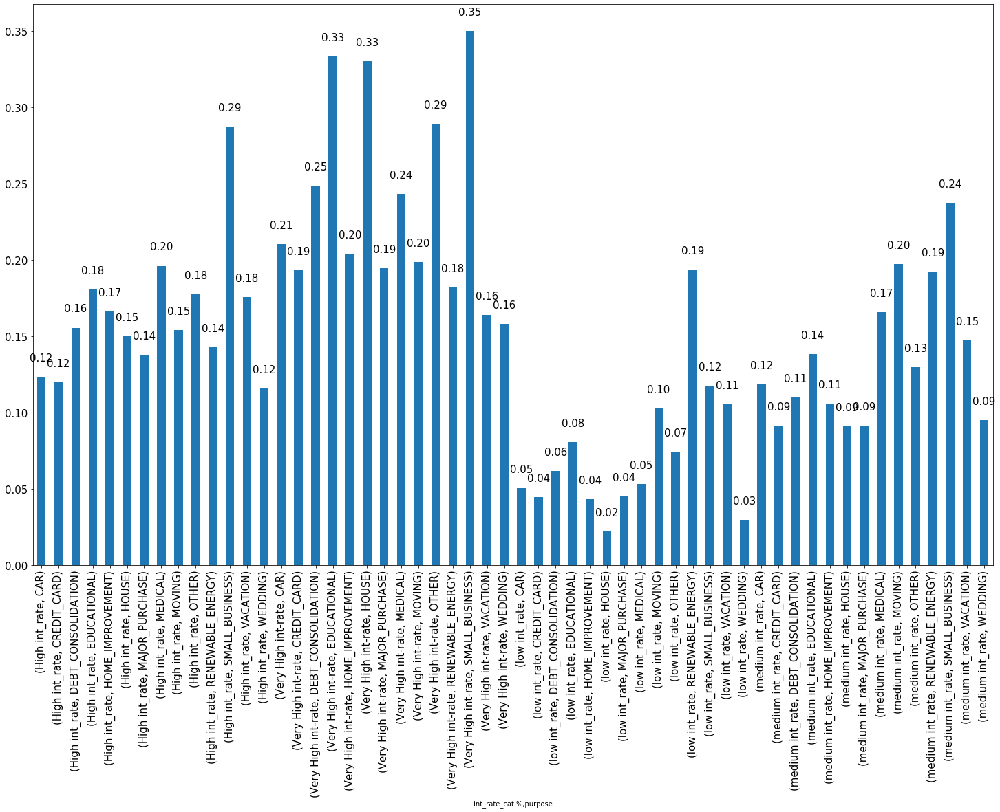

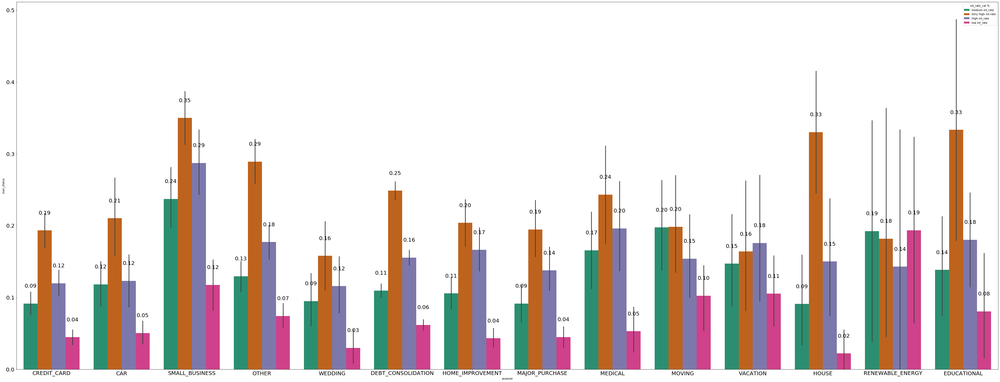

In [234]:
bivariant_plots(cat2 = 'purpose',cat1 = 'int_rate_cat %',plot1 = False,x1 = 25,y1 = 15,x2 = 65, y2 = 25, axsize1 = 15, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation
- Very High Interest rate are the key reason for the defaults and lending companies should be carefull with custormers who are borrowing loans for small business, education, other

### loan_status, interest_rate, Subgrade

<Figure size 1440x360 with 0 Axes>

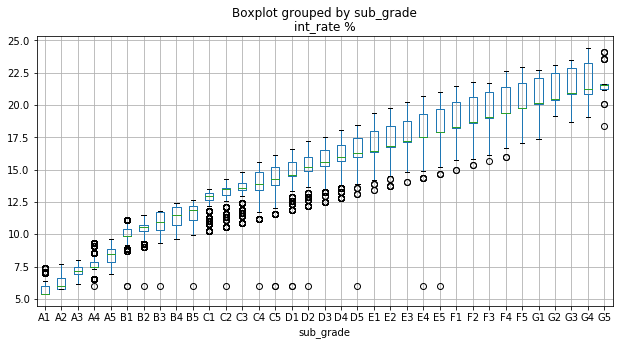

In [235]:
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'sub_grade',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                       0     1    All
sub_grade int_rate_cat %                        
A1        low int_rate         1095    29   1124
A2        low int_rate         1427    73   1500
A3        low int_rate         1700   101   1801
A4        low int_rate         2506   167   2673
          medium int_rate       188    11    199
...                             ...   ...    ...
G2        Very High int-rate     49    27     76
G3        Very High int-rate     26    19     45
G4        Very High int-rate     41    13     54
G5        Very High int-rate     19    10     29
All                           32835  5526  38361

[69 rows x 3 columns]


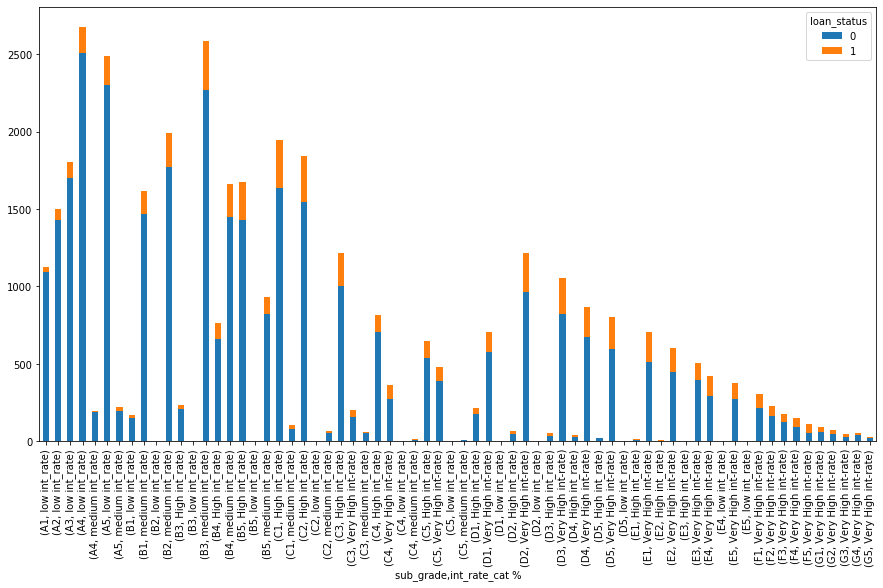

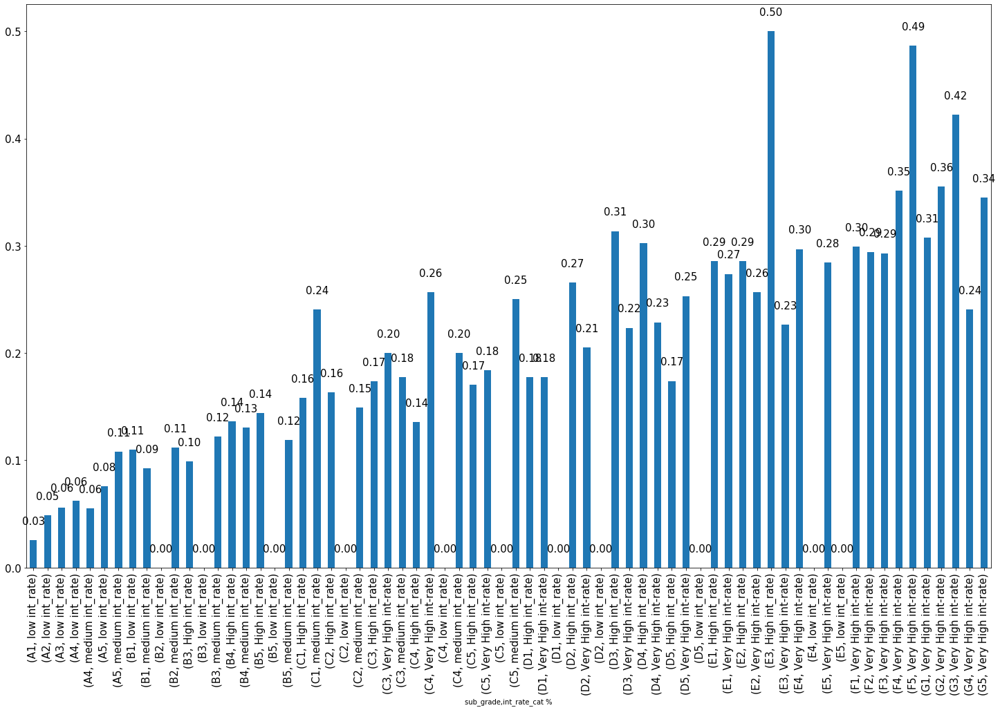

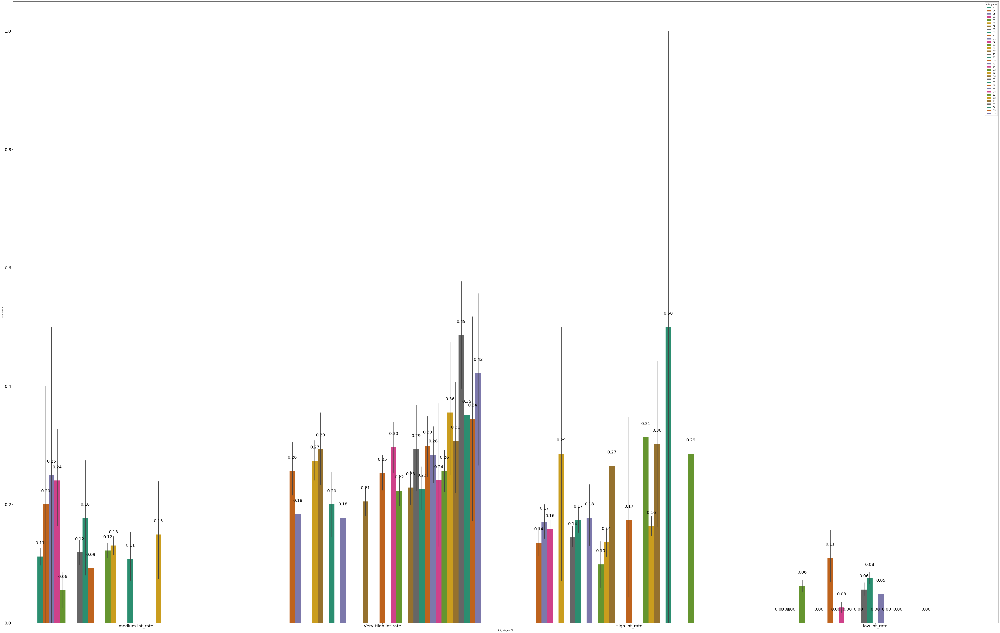

In [236]:
bivariant_plots(cat1 = 'sub_grade',cat2 = 'int_rate_cat %',plot1 = True ,x1 = 25,y1 = 15,x2 = 85, y2 = 55, axsize1 = 15, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation 
- it is observed for the low quality grades have higher interest rates and sub grades of grade F and G have the highest defaults.

### loan_status, interest_rate, pub_rec_bankruptcies 

<Figure size 1440x360 with 0 Axes>

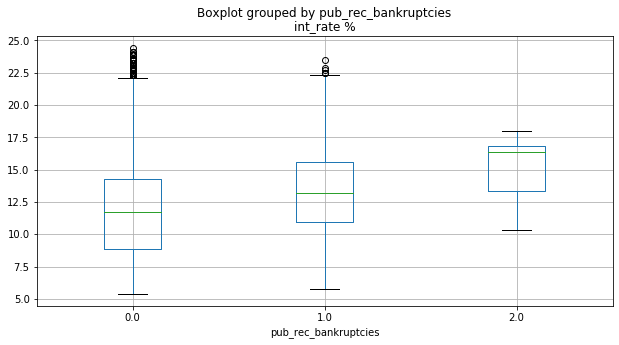

In [237]:
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'pub_rec_bankruptcies',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                                  0     1    All
int_rate_cat %     pub_rec_bankruptcies                    
High int_rate      0.0                    7643  1408   9051
                   1.0                     408    96    504
                   2.0                       1     0      1
Very High int-rate 0.0                    6846  2145   8991
                   1.0                     378   196    574
                   2.0                       2     1      3
low int_rate       0.0                    9077   566   9643
                   1.0                     115    11    126
medium int_rate    0.0                    8002  1047   9049
                   1.0                     363    55    418
                   2.0                       0     1      1
All                                      32835  5526  38361


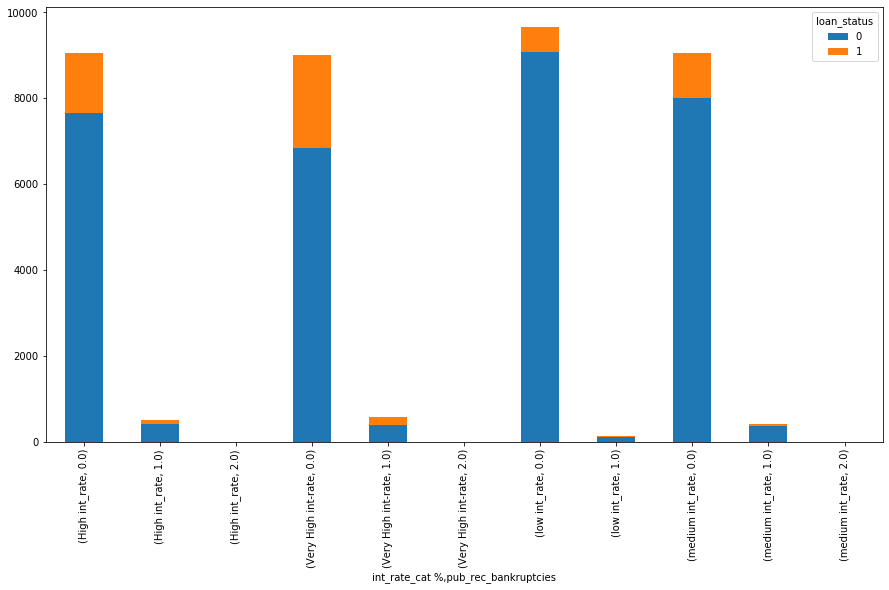

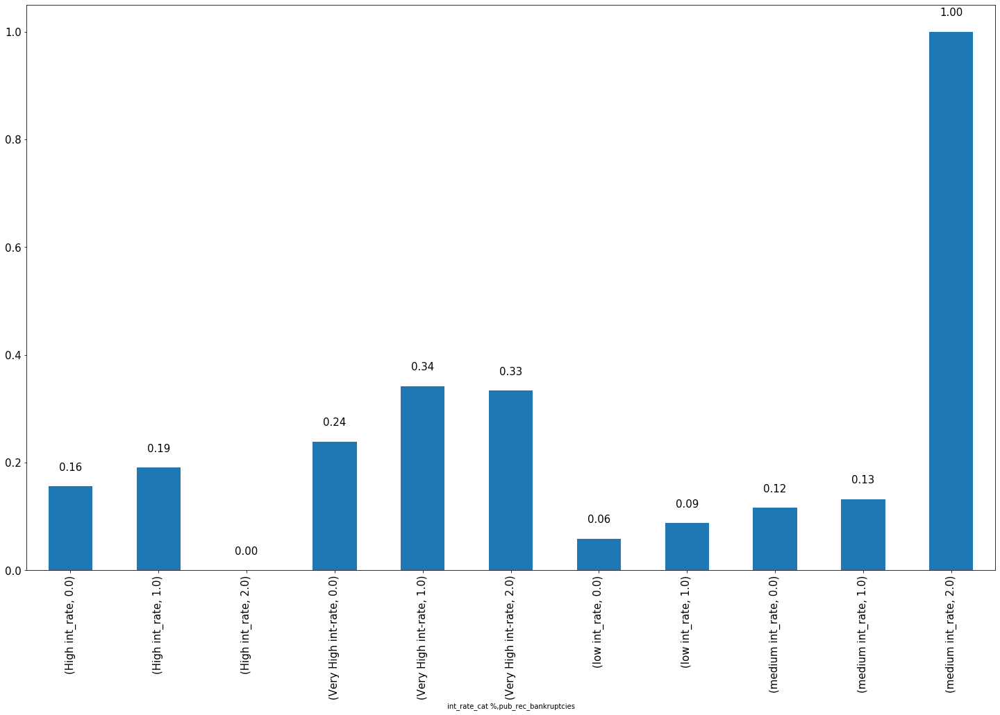

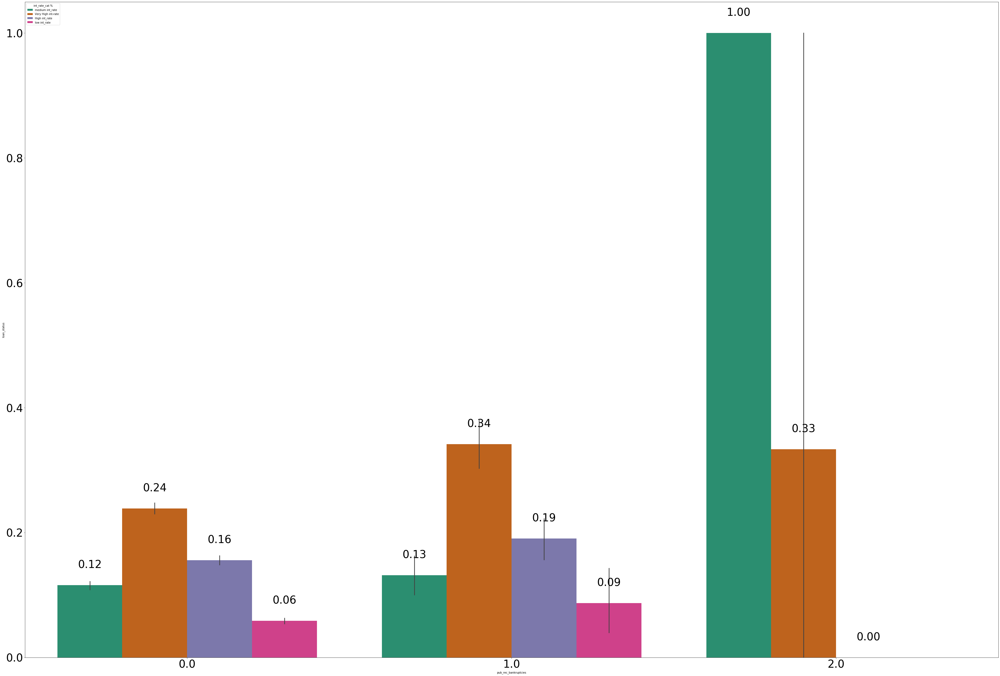

In [238]:
bivariant_plots(cat1 = 'int_rate_cat %',cat2 = 'pub_rec_bankruptcies',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 15, spacing1 = 20, axsize2 = 40,spacing2 = 55,Set = 'Dark2' )

### Observation
- It is observed default case are highest for 1 and 2 banrupticies for a given interest rate

### loan_status, interest_rate, annual_inc

<Figure size 1440x360 with 0 Axes>

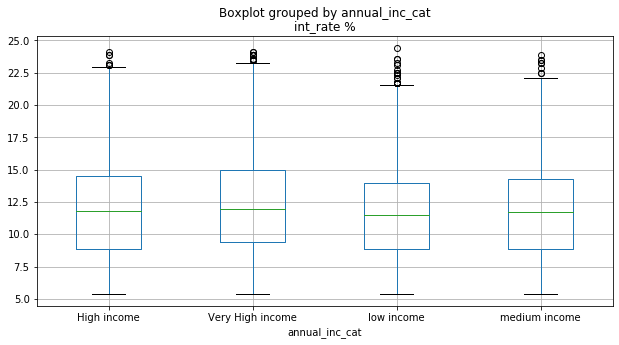

<Figure size 1440x360 with 0 Axes>

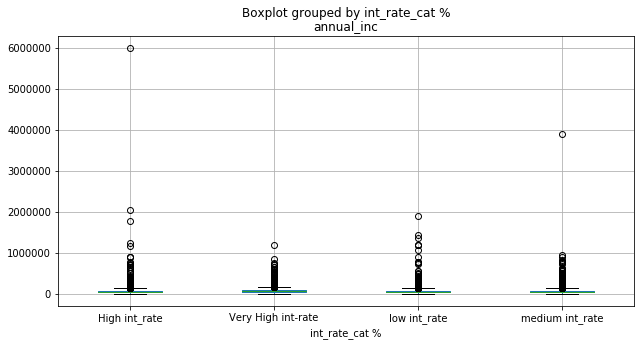

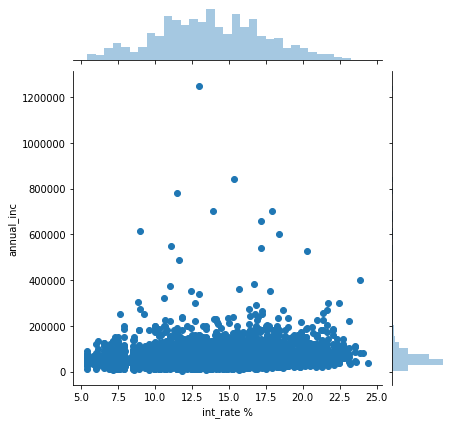

In [239]:
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'annual_inc_cat',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'int_rate_cat %' ,cat1 = 'annual_inc',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'annual_inc',plot1 = True,plot2 = False,x = 20, y = 5)

loan_status                              0     1    All
int_rate_cat %     annual_inc_cat                      
High int_rate      High income        2005   334   2339
                   Very High income   2005   261   2266
                   low income         1985   515   2500
                   medium income      2057   394   2451
Very High int-rate High income        1810   633   2443
                   Very High income   2205   549   2754
                   low income         1496   573   2069
                   medium income      1715   587   2302
low int_rate       High income        2381   108   2489
                   Very High income   2218    71   2289
                   low income         2259   229   2488
                   medium income      2334   169   2503
medium int_rate    High income        2027   247   2274
                   Very High income   2055   182   2237
                   low income         2168   388   2556
                   medium income      2115   286

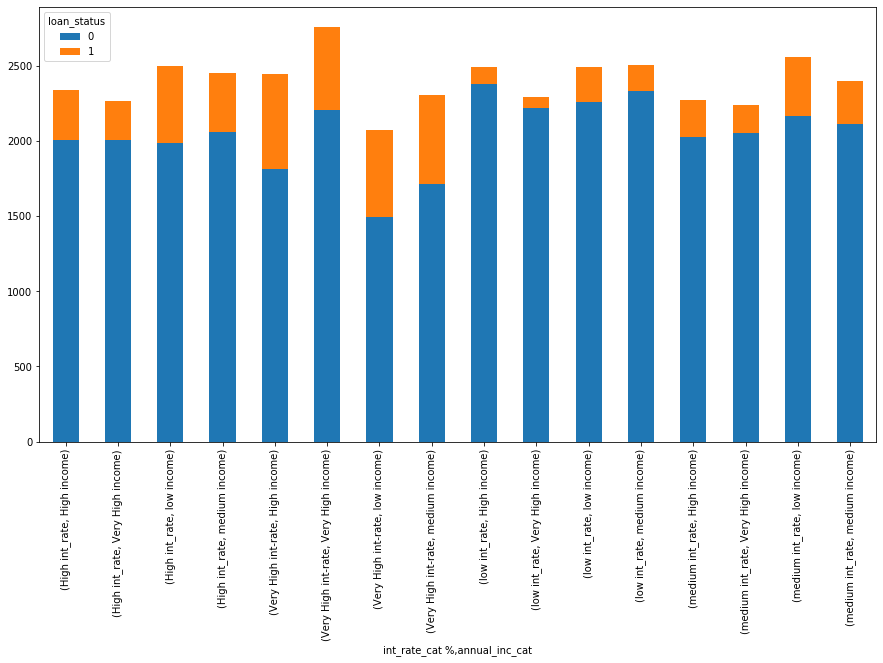

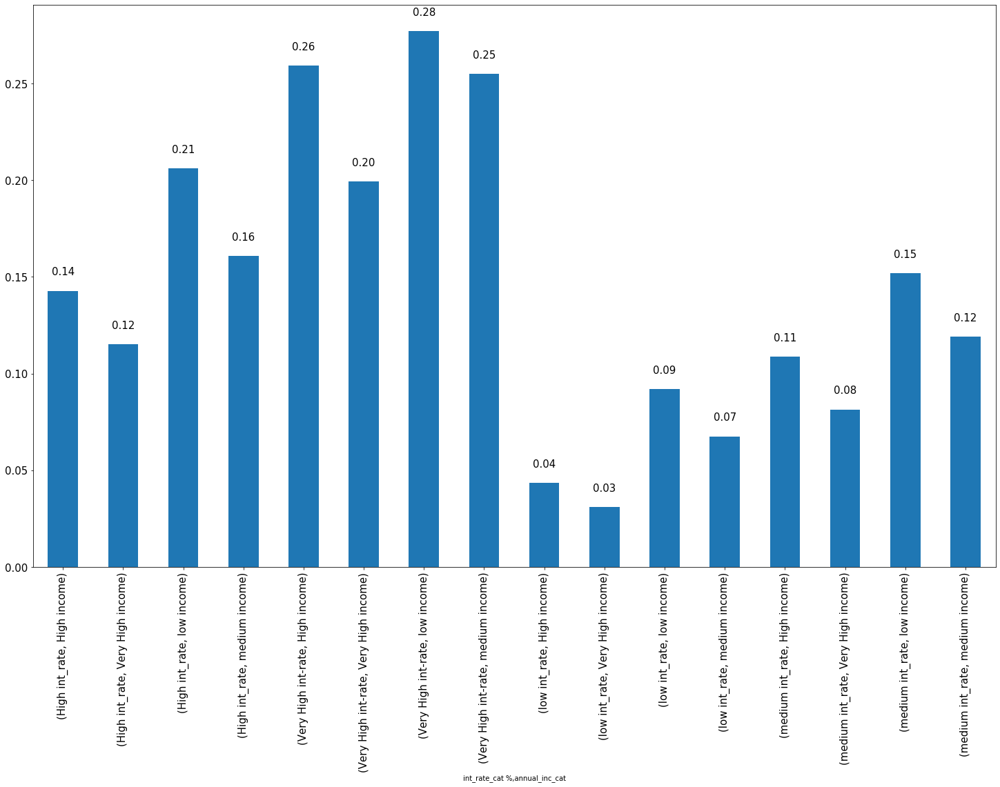

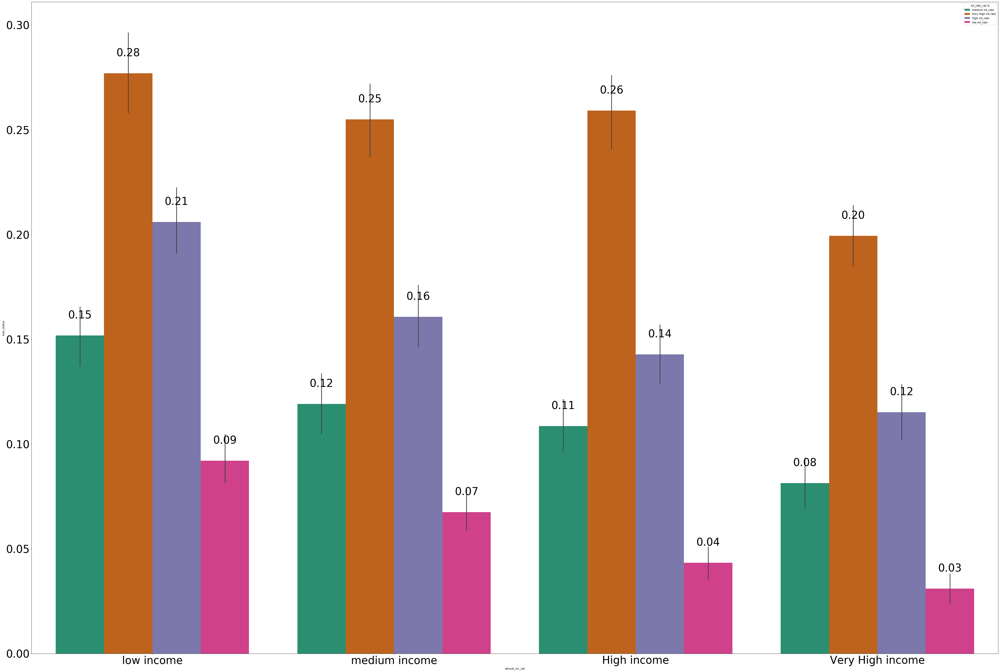

In [240]:
bivariant_plots(cat1 = 'int_rate_cat %',cat2 = 'annual_inc_cat',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 15, spacing1 = 20, axsize2 = 40,spacing2 = 55,Set = 'Dark2' )

### Observation 
- Lower annual income with higher interest rates have a huge amount of default cases, it is also observerd from the joint plot where the dat point density is higher in high intrest rates and at lower income 

### loan_status, interest_rate, Dti

<Figure size 1440x360 with 0 Axes>

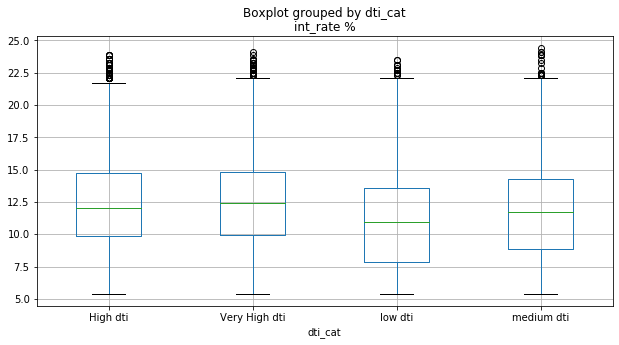

<Figure size 1440x360 with 0 Axes>

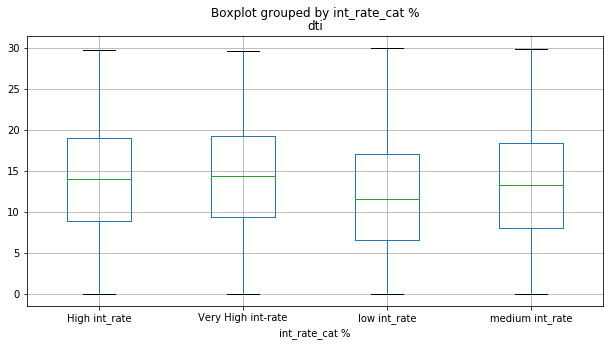

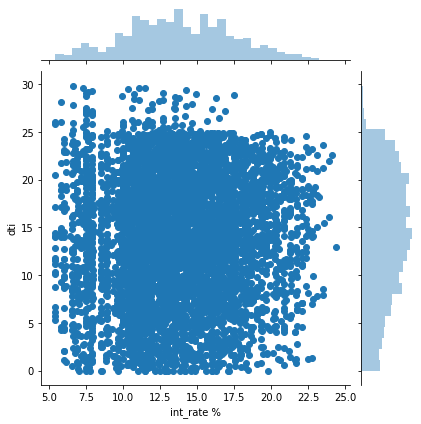

In [241]:
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'dti_cat',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'int_rate_cat %' ,cat1 = 'dti',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'int_rate %' ,cat2 = 'dti',plot1 = True,plot2 = False,x = 20, y = 5)

loan_status                           0     1    All
int_rate_cat %     dti_cat                          
High int_rate      High dti        2153   392   2545
                   Very High dti   2117   462   2579
                   low dti         1758   301   2059
                   medium dti      2024   349   2373
Very High int-rate High dti        1974   630   2604
                   Very High dti   2031   687   2718
                   low dti         1489   446   1935
                   medium dti      1732   579   2311
low int_rate       High dti        1917   139   2056
                   Very High dti   1836   152   1988
                   low dti         3038   143   3181
                   medium dti      2401   143   2544
medium int_rate    High dti        2090   303   2393
                   Very High dti   2006   286   2292
                   low dti         2149   273   2422
                   medium dti      2120   241   2361
All                               32835  5526 

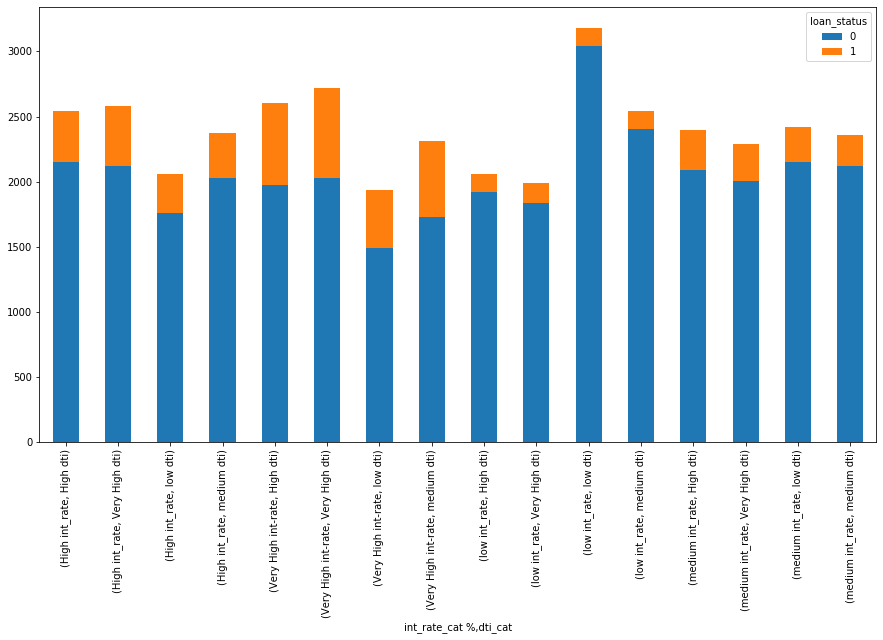

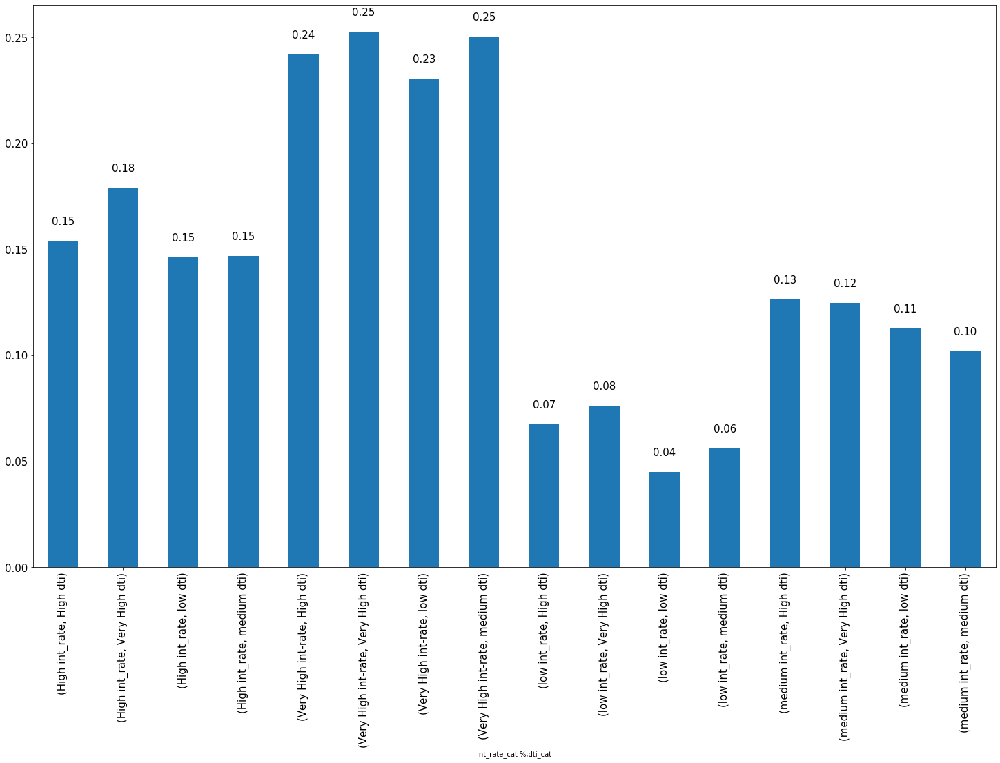

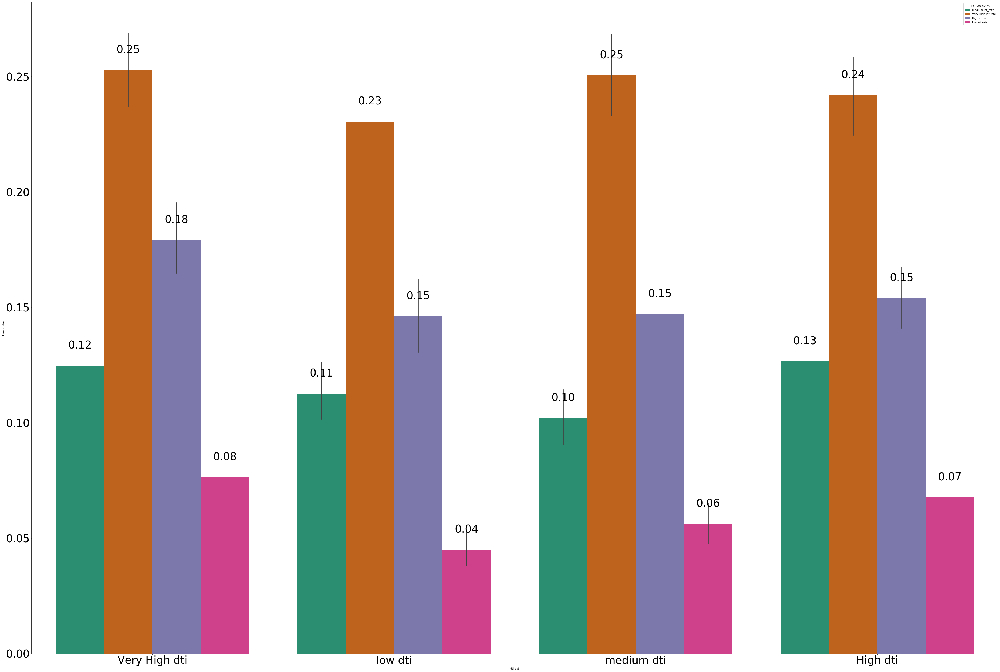

In [242]:
bivariant_plots(cat1 = 'int_rate_cat %',cat2 = 'dti_cat',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 15, spacing1 = 20, axsize2 = 40,spacing2 = 55,Set = 'Dark2' )

### loan_status, loan_amnt, emp_length

<Figure size 1440x360 with 0 Axes>

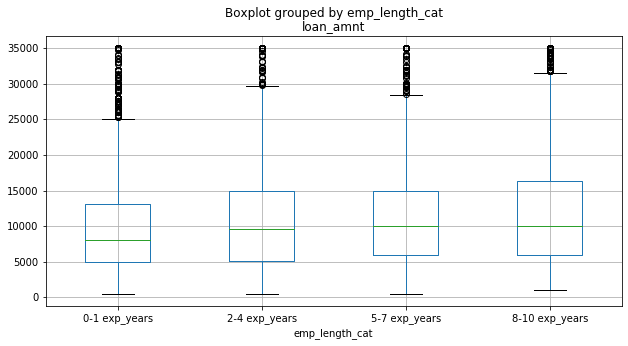

<Figure size 1440x360 with 0 Axes>

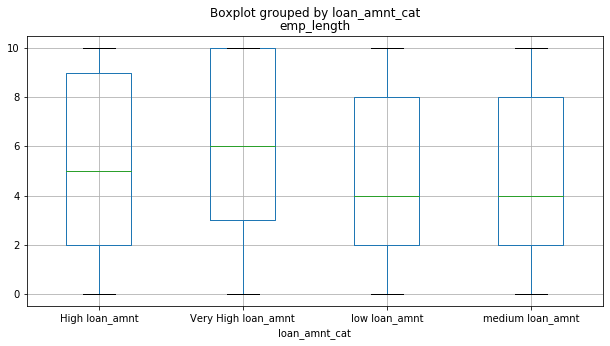

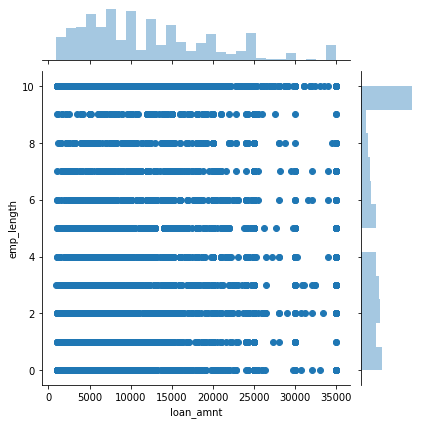

In [243]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'emp_length_cat',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'loan_amnt_cat' ,cat1 = 'emp_length',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'emp_length',plot1 = True,plot2 = False,x = 20, y = 5)

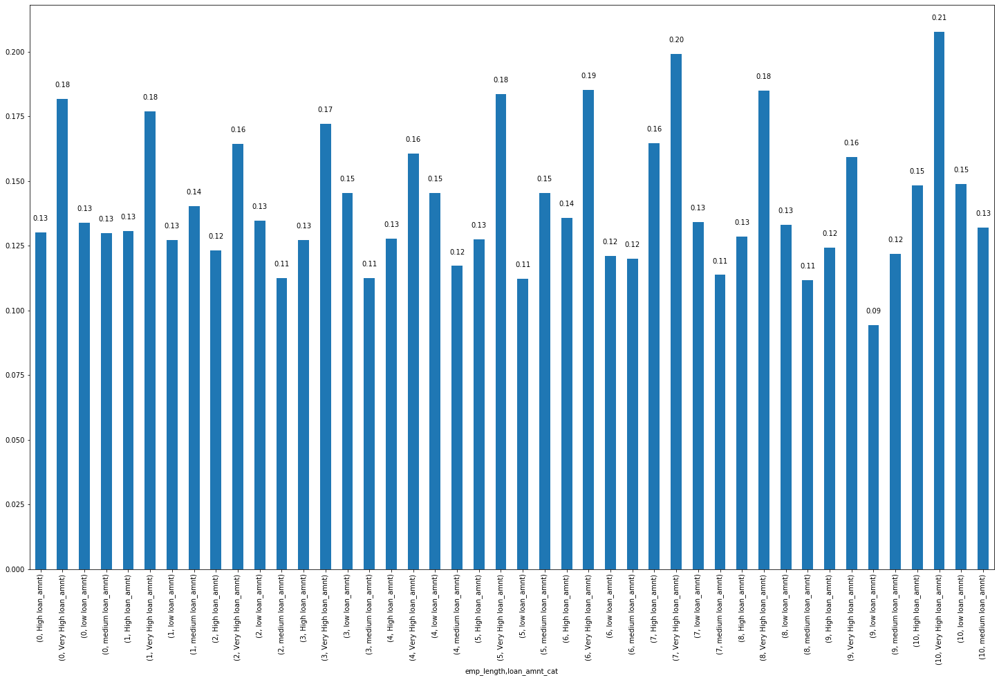

In [244]:
plt.subplots(figsize = (25,15))
ax = df.groupby(['emp_length','loan_amnt_cat'])['loan_status'].mean().plot(kind='bar')
add_value_labels_plots(ax,10,spacing = 15)
plt.show()

loan_status                             0     1    All
emp_length_cat loan_amnt_cat                          
0-1 exp_years  High loan_amnt        2698   395   3093
               Very High loan_amnt   1699   358   2057
               low loan_amnt         3052   466   3518
               medium loan_amnt      2822   408   3230
2-4 exp_years  High loan_amnt        1841   269   2110
               Very High loan_amnt   1239   248   1487
               low loan_amnt         1593   271   1864
               medium loan_amnt      1646   213   1859
5-7 exp_years  High loan_amnt        1741   281   2022
               Very High loan_amnt   1325   307   1632
               low loan_amnt         1408   192   1600
               medium loan_amnt      1550   232   1782
8-10 exp_years High loan_amnt        2889   483   3372
               Very High loan_amnt   2723   684   3407
               low loan_amnt         2244   371   2615
               medium loan_amnt      2365   348   2713
All       

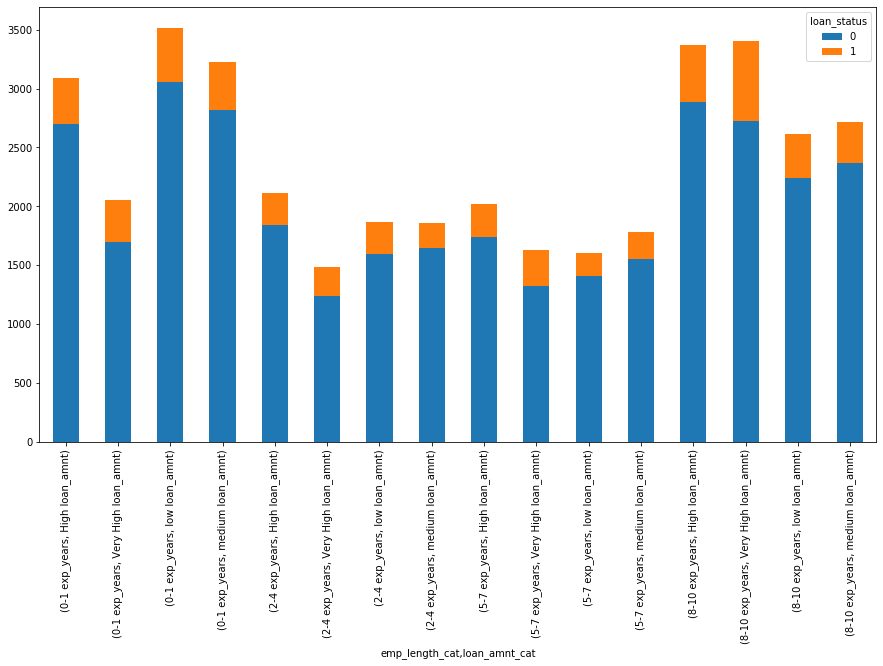

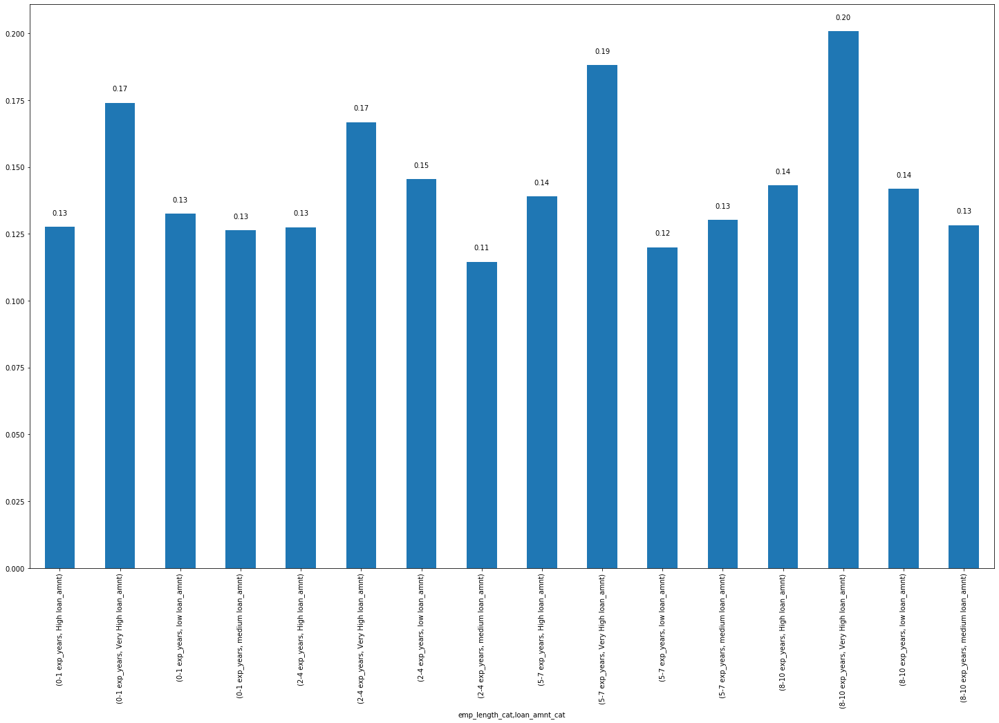

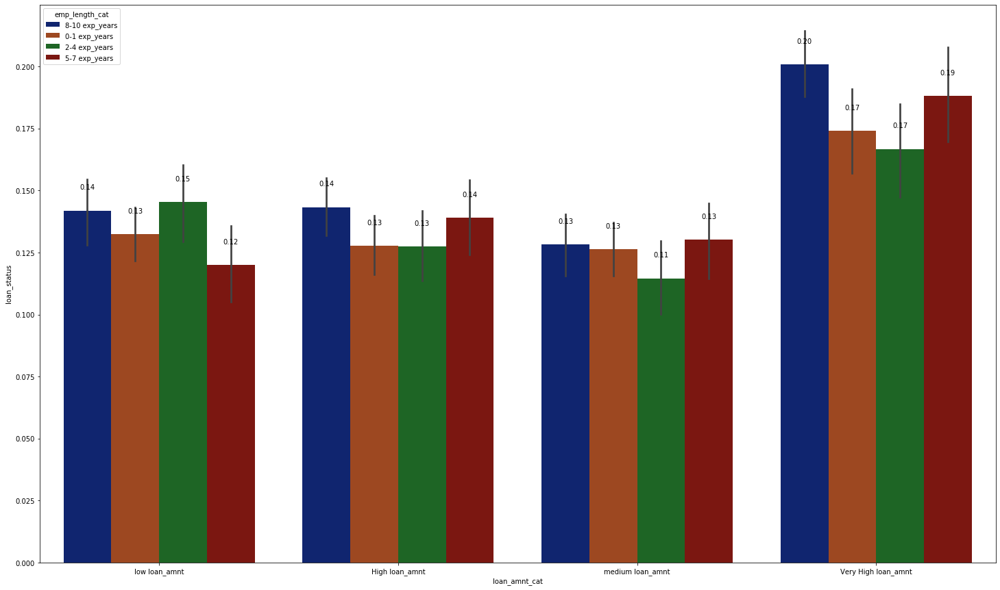

In [245]:
bivariant_plots('emp_length_cat','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

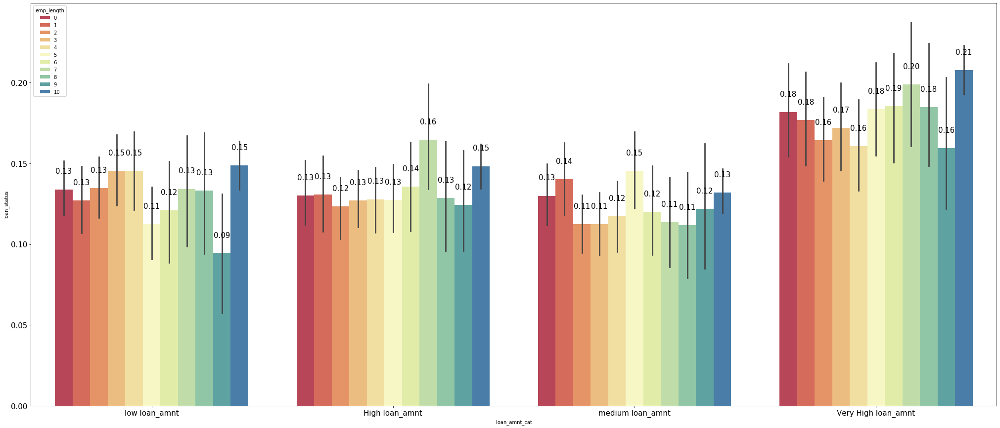

In [246]:
plt.subplots(figsize = (35,15))
ax = sns.barplot(x = df.loan_amnt_cat,y = df.loan_status,hue = df['emp_length'] ,palette="Spectral")
add_value_labels_plots(ax,15,spacing = 29)
plt.show()

### Observation 
- From above analysis it is observed that when customers are funded with very high amount tend to have very high default rate, in addition to that customers with 6+ years taking high amnt of loan have high default rates

### loan_status, loan_amnt, Installment

<Figure size 1440x360 with 0 Axes>

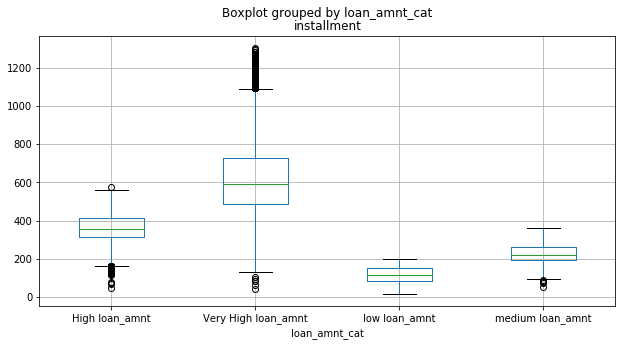

<Figure size 1440x360 with 0 Axes>

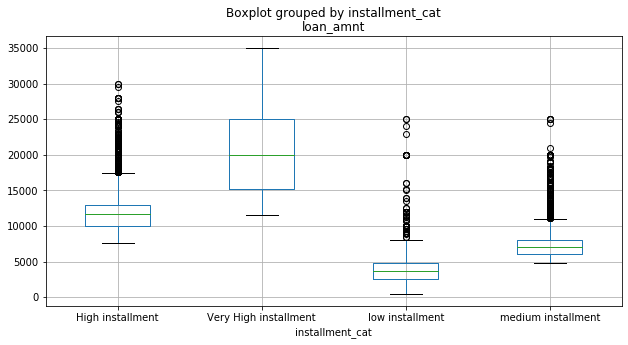

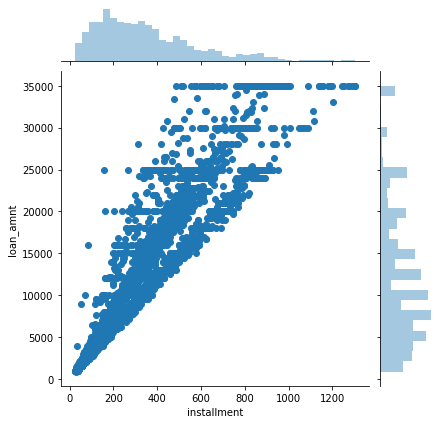

In [247]:
bivariant_box_joint_plots(cat2 = 'loan_amnt_cat' ,cat1 = 'installment',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'installment_cat',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'loan_amnt' ,cat1 = 'installment',plot1 = True,plot2 = False,x = 20, y = 5)

loan_status                                    0     1    All
installment_cat       loan_amnt_cat                          
High installment      High loan_amnt        6025   934   6959
                      Very High loan_amnt    939   275   1214
                      medium loan_amnt      1257   178   1435
Very High installment High loan_amnt        2110   254   2364
                      Very High loan_amnt   5914  1294   7208
low installment       High loan_amnt          47     9     56
                      Very High loan_amnt     11     3     14
                      low loan_amnt         7652  1139   8791
                      medium loan_amnt       577   153    730
medium installment    High loan_amnt         987   231   1218
                      Very High loan_amnt    122    25    147
                      low loan_amnt          645   161    806
                      medium loan_amnt      6549   870   7419
All                                        32835  5526  38361


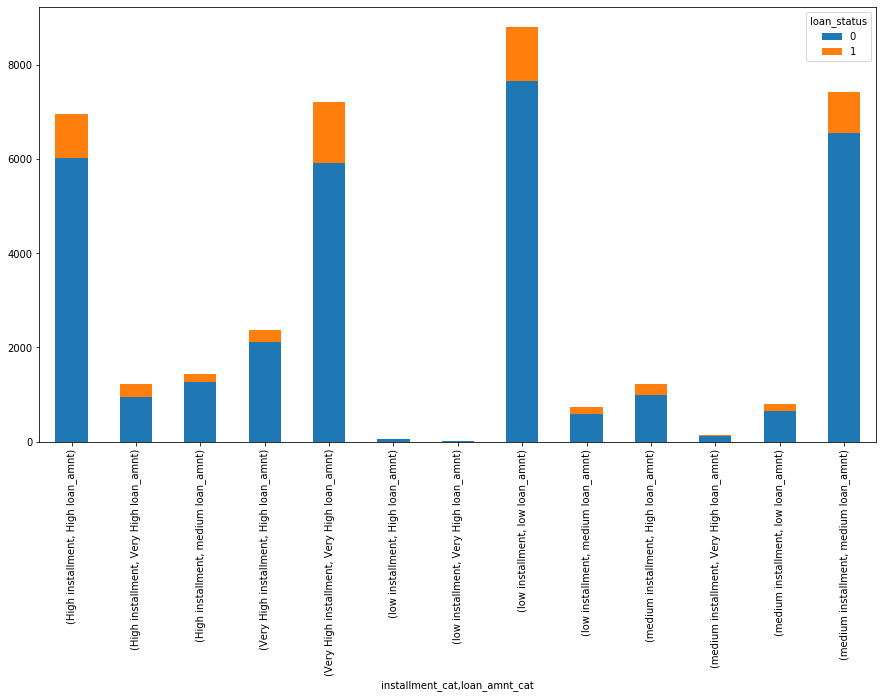

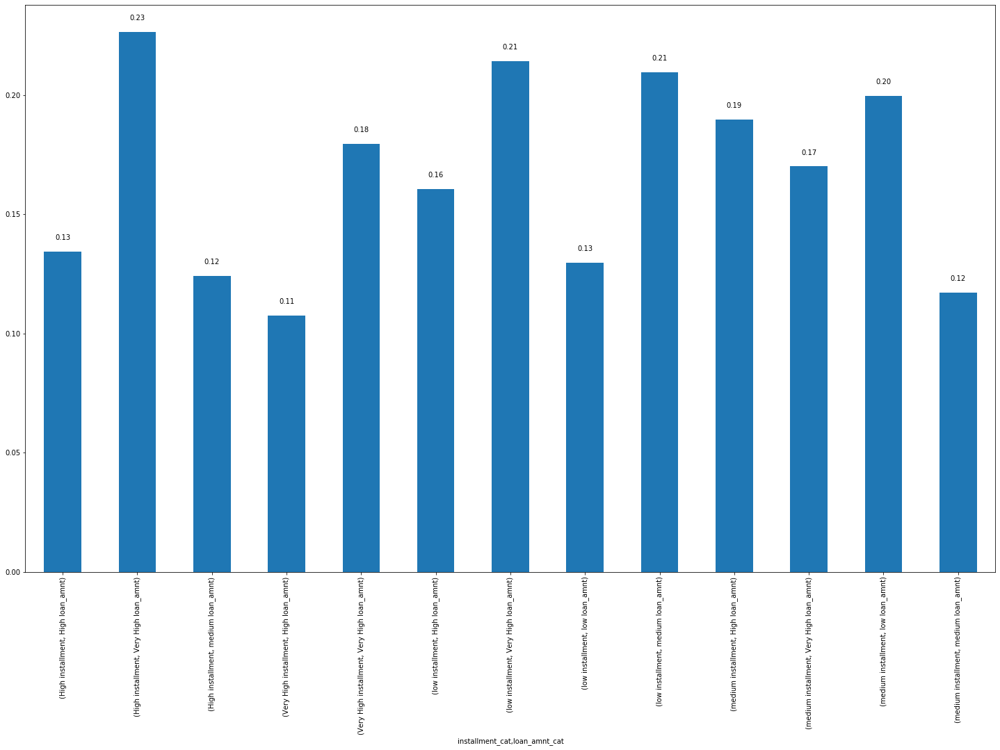

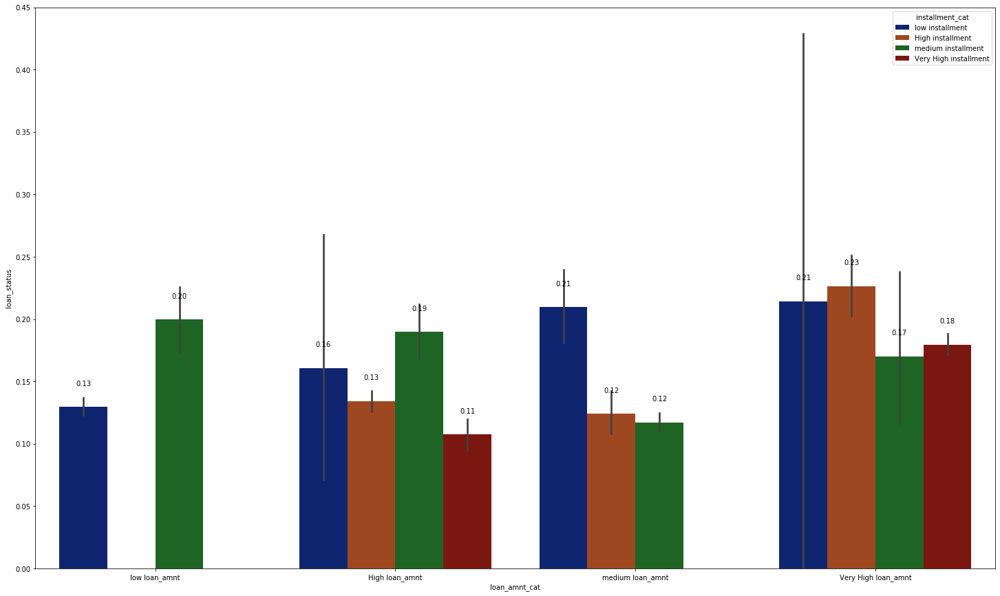

In [248]:
bivariant_plots('installment_cat','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- it is observed that low_funded amnt and high funded amnt with medium installment rate have high default cases. Furthermore for high installment and very high funded amount have high default cases which is around 24%  

### loan_status, loan_amnt, Term

<Figure size 1440x360 with 0 Axes>

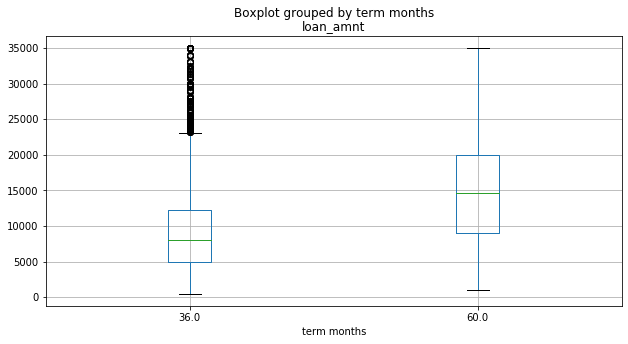

In [249]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'term months',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                          0     1    All
term months loan_amnt_cat                          
36.0        High loan_amnt        7114   799   7913
            Very High loan_amnt   3906   492   4398
            low loan_amnt         7524  1033   8557
            medium loan_amnt      7225   832   8057
60.0        High loan_amnt        2055   629   2684
            Very High loan_amnt   3080  1105   4185
            low loan_amnt          773   267   1040
            medium loan_amnt      1158   369   1527
All                              32835  5526  38361


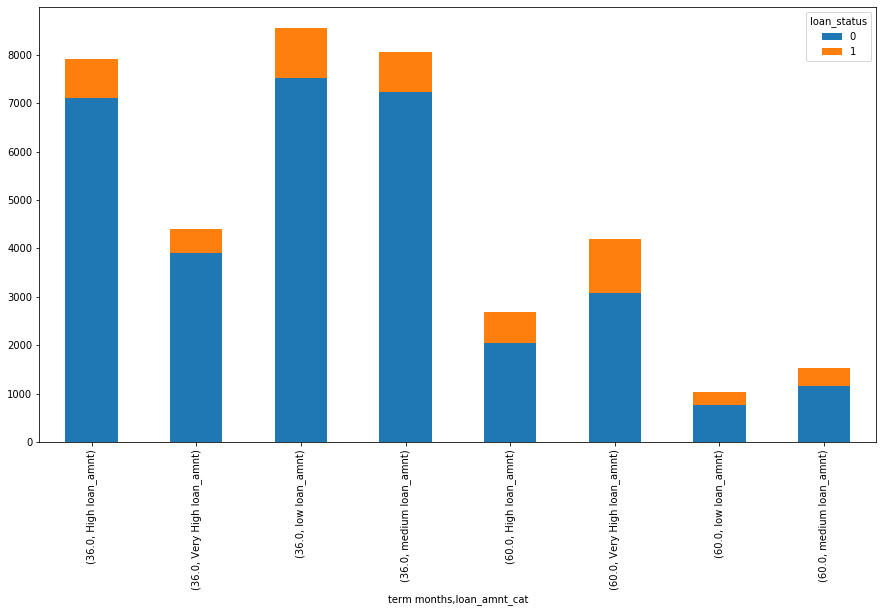

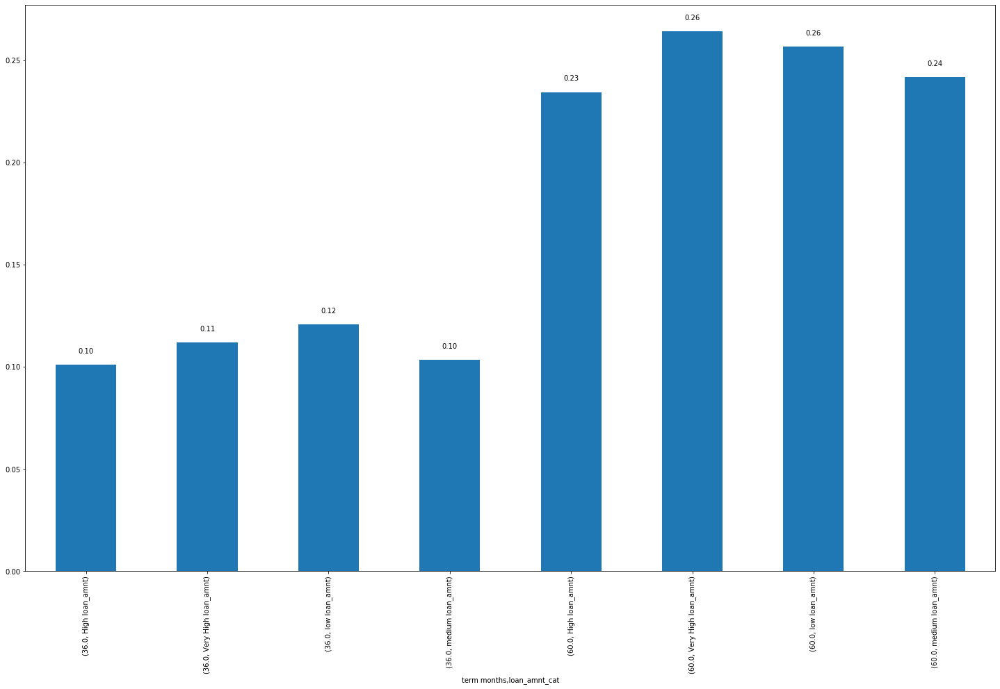

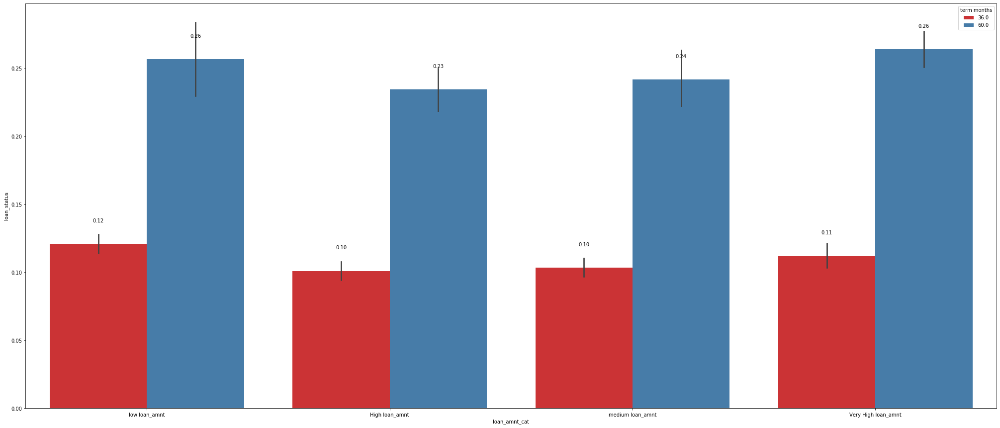

In [250]:
bivariant_plots('term months','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 35, y2 = 15, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 42,Set = 'Set1' )

### Observation
- From the above curve it is observed that custormers who opted 60 months term have high default rate for almost all the four types of funds. Hence this should be considered as one of the important feature for determining default cases

### loan_status, loan_amnt, int_rate %

<Figure size 1440x360 with 0 Axes>

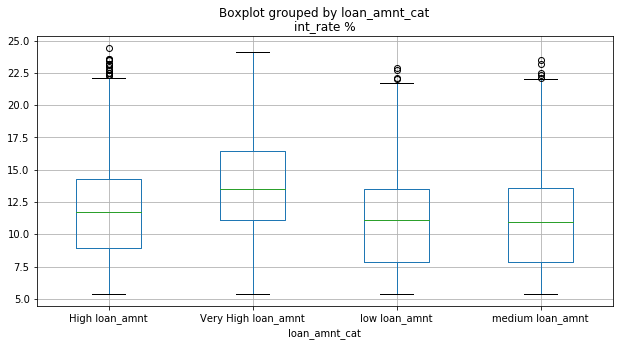

<Figure size 1440x360 with 0 Axes>

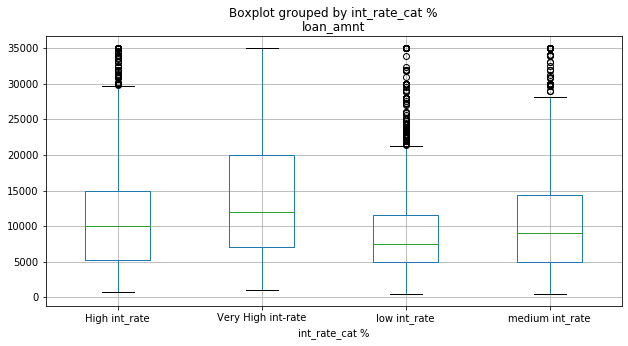

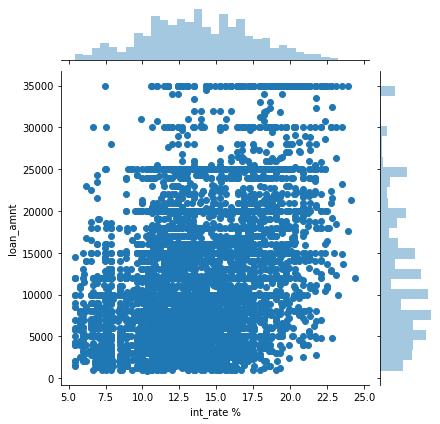

In [251]:
bivariant_box_joint_plots(cat2 = 'loan_amnt_cat' ,cat1 = 'int_rate %',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'int_rate_cat %',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'loan_amnt' ,cat1 = 'int_rate %',plot1 = True,plot2 = False,x = 20, y = 5)

loan_status                                 0     1    All
int_rate_cat %     loan_amnt_cat                          
High int_rate      High loan_amnt        2216   386   2602
                   Very High loan_amnt   1874   391   2265
                   low loan_amnt         2030   396   2426
                   medium loan_amnt      1932   331   2263
Very High int-rate High loan_amnt        1973   589   2562
                   Very High loan_amnt   2579   950   3529
                   low loan_amnt         1287   394   1681
                   medium loan_amnt      1387   409   1796
low int_rate       High loan_amnt        2596   140   2736
                   Very High loan_amnt    887    41    928
                   low loan_amnt         2796   214   3010
                   medium loan_amnt      2913   182   3095
medium int_rate    High loan_amnt        2384   313   2697
                   Very High loan_amnt   1646   215   1861
                   low loan_amnt         2184   296   24

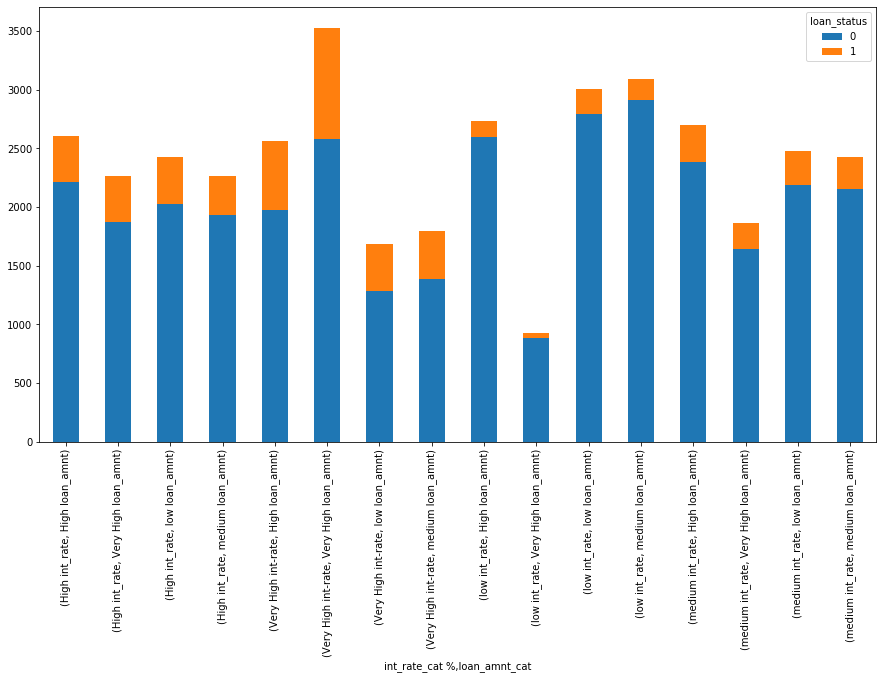

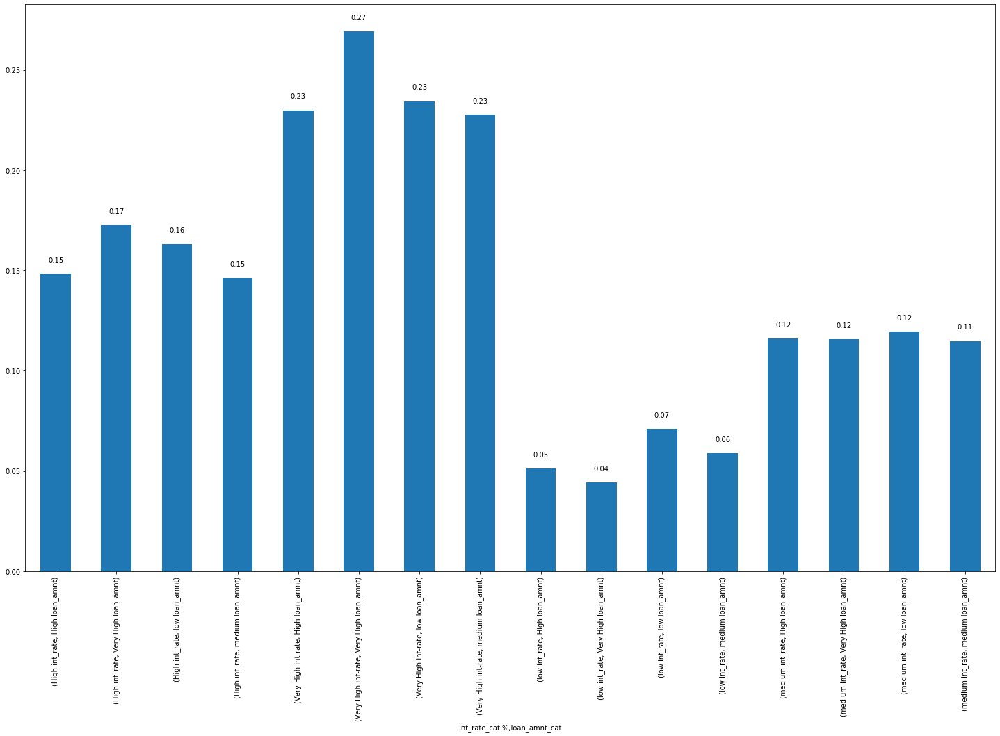

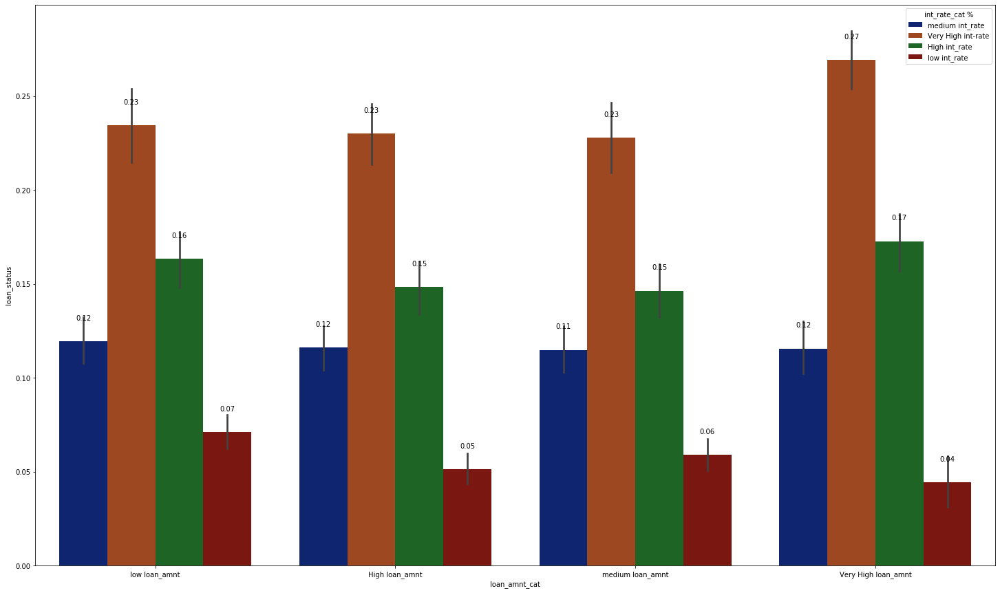

In [252]:
bivariant_plots('int_rate_cat %','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- Irrespective to amount of funded , it is observed that very high interest rate has high default cases when compared to the other types of rates

### loan_status, loan_amnt, Subgrade

<Figure size 1440x360 with 0 Axes>

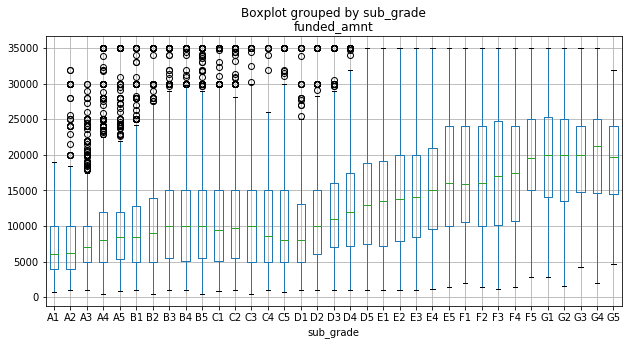

<Figure size 1440x360 with 0 Axes>

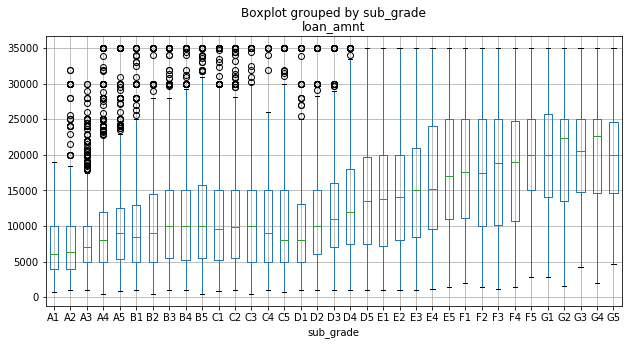

In [253]:
bivariant_box_joint_plots(cat1 = 'funded_amnt' ,cat2 = 'sub_grade',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'sub_grade',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                        0     1    All
sub_grade loan_amnt_cat                          
A1        High loan_amnt         294     8    302
          Very High loan_amnt     33     1     34
          low loan_amnt          443    12    455
          medium loan_amnt       325     8    333
A2        High loan_amnt         337    14    351
...                              ...   ...    ...
G5        High loan_amnt           3     2      5
          Very High loan_amnt     14     7     21
          low loan_amnt            1     0      1
          medium loan_amnt         1     1      2
All                            32835  5526  38361

[141 rows x 3 columns]


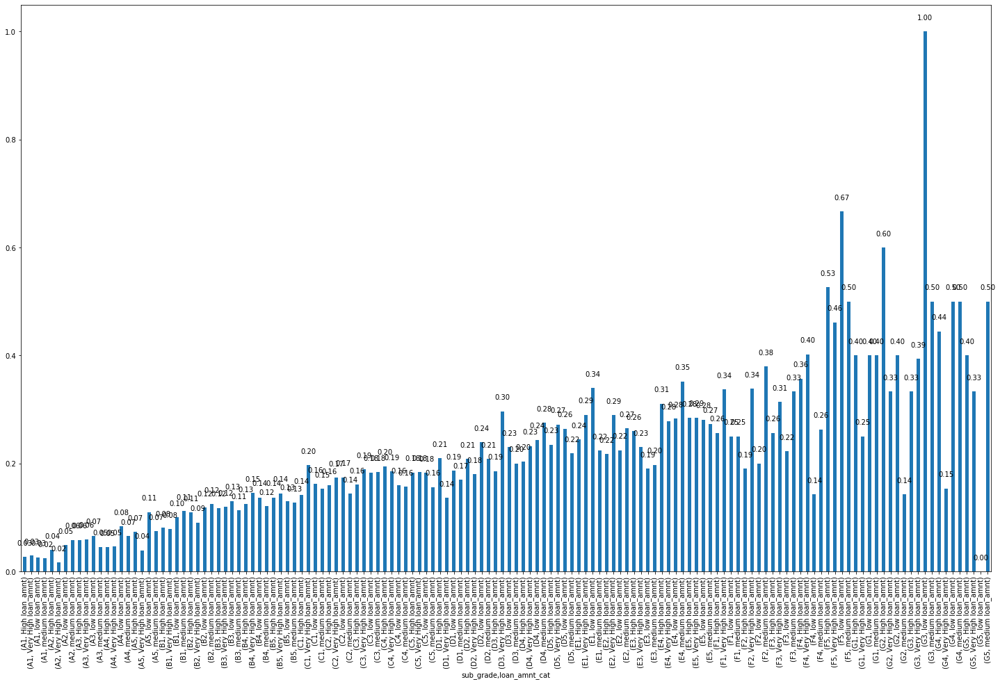

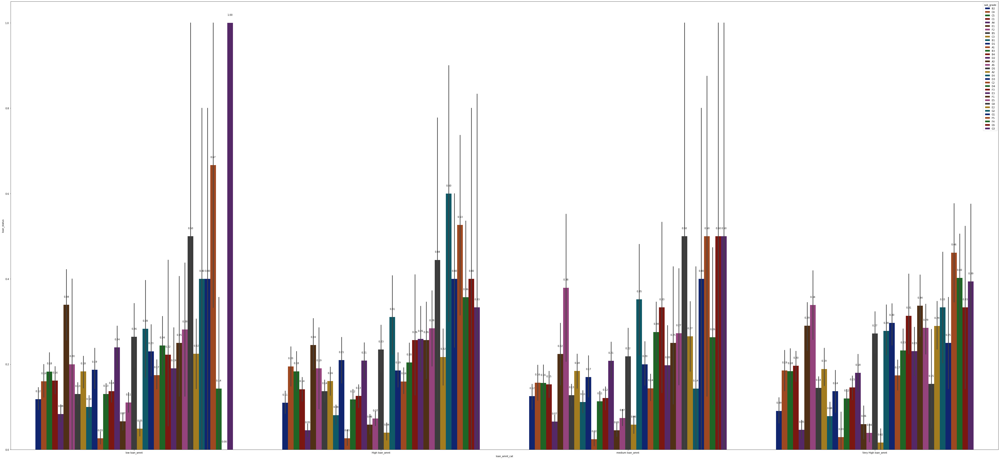

In [254]:
bivariant_plots('sub_grade','loan_amnt_cat',plot1 = False,x1 = 25,y1 = 15,x2 = 75, y2 = 35, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- From the box plot it is observerd that the loan increases with the change in the sub grade from A1 to G5. This also indicates that higher the loans provided higher the default cases. Hence we observe from the barplots that Grade G and F has very high default cases

### loan_status, loan_amnt, Grade

<Figure size 1440x360 with 0 Axes>

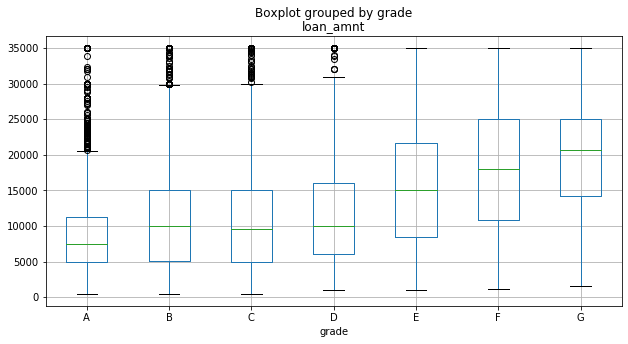

In [255]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'grade',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                    0     1    All
grade loan_amnt_cat                          
A     High loan_amnt        2678   151   2829
      Very High loan_amnt    853    38    891
      low loan_amnt         2869   219   3088
      medium loan_amnt      3011   185   3196
B     High loan_amnt        2899   378   3277
      Very High loan_amnt   2275   322   2597
      low loan_amnt         2594   369   2963
      medium loan_amnt      2459   334   2793
C     High loan_amnt        1739   339   2078
      Very High loan_amnt   1410   322   1732
      low loan_amnt         1711   355   2066
      medium loan_amnt      1605   299   1904
D     High loan_amnt        1152   299   1451
      Very High loan_amnt   1072   323   1395
      low loan_amnt          790   233   1023
      medium loan_amnt       931   245   1176
E     High loan_amnt         505   175    680
      Very High loan_amnt    875   333   1208
      low loan_amnt          260    95    355
      medium loan_amnt       297  

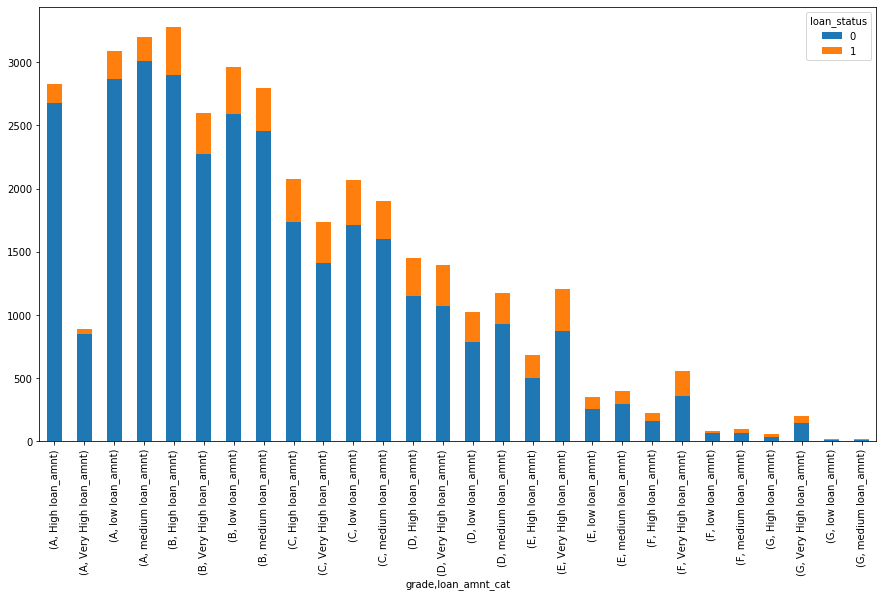

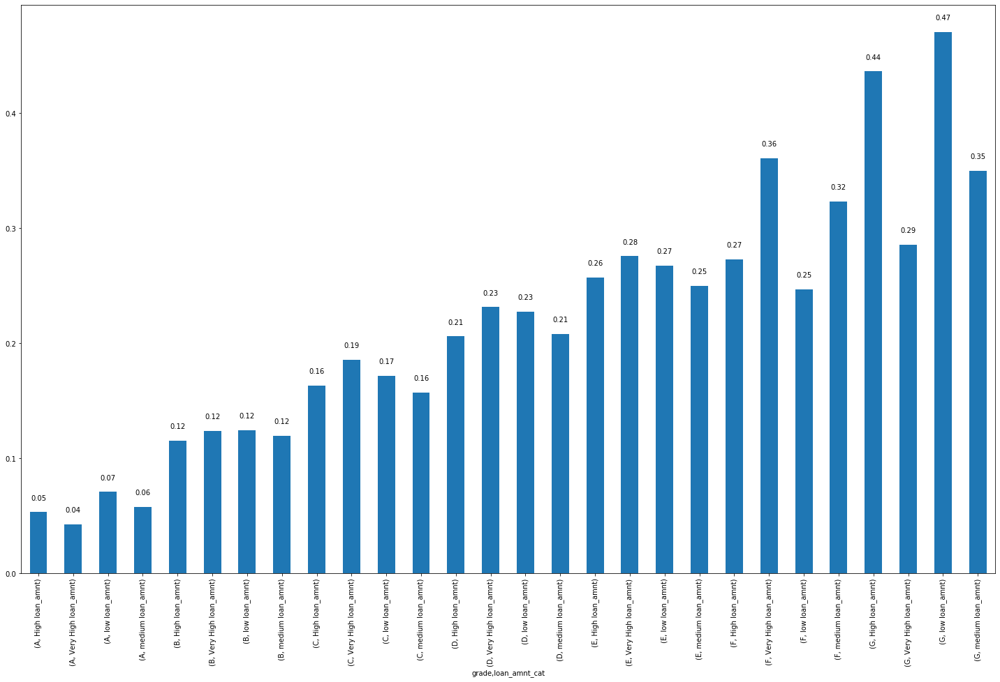

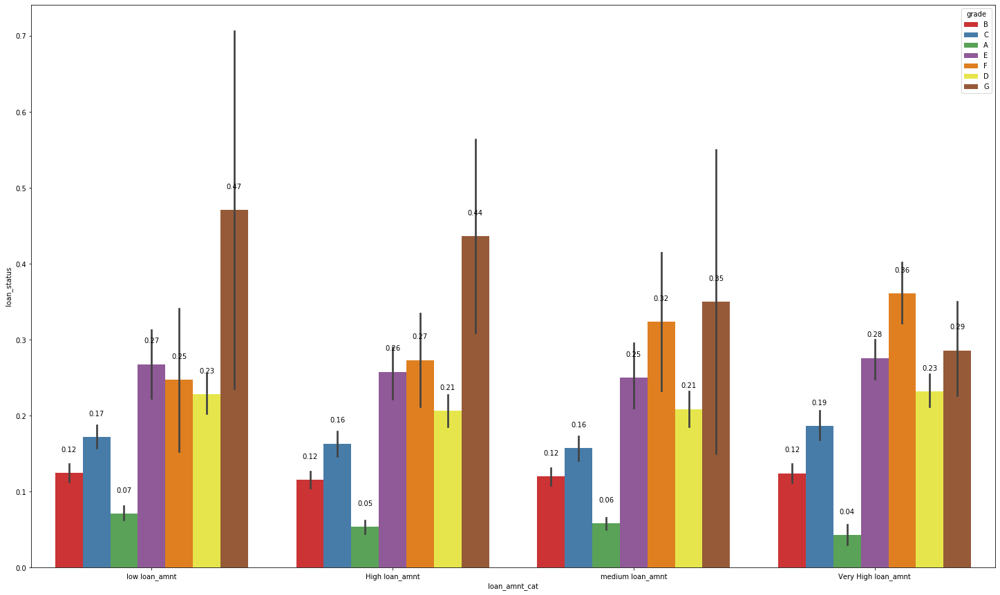

In [256]:
bivariant_plots('grade','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 25, y2 = 15, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'Set1' )

### Observation
- Custormers assigned as 'G' Grade has the highest default cases for a given loan amount

### loan_status, loan_amnt, revol_util

<Figure size 1440x360 with 0 Axes>

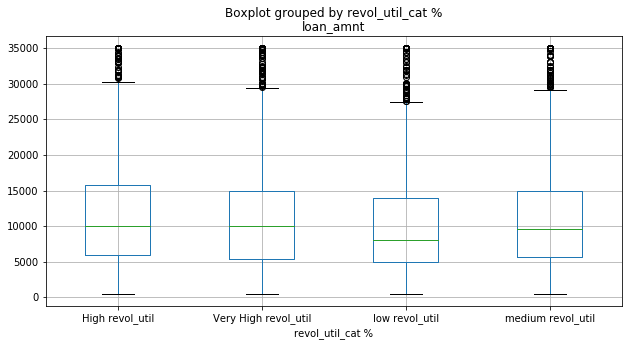

<Figure size 1440x360 with 0 Axes>

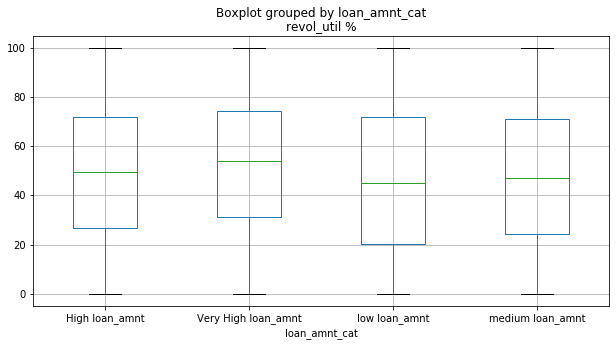

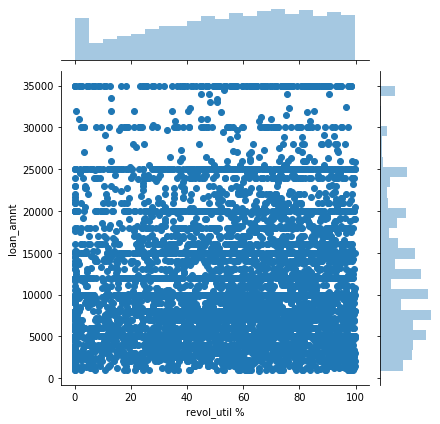

In [257]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'revol_util_cat %',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'loan_amnt_cat' ,cat1 = 'revol_util %',plot1 = False,plot2 = True,x = 20, y = 5)
bivariant_box_joint_plots(cat2 = 'loan_amnt' ,cat1 = 'revol_util %',plot2 = False,plot1 = True,x = 20, y = 5)

loan_status                                   0     1    All
revol_util_cat %     loan_amnt_cat                          
High revol_util      High loan_amnt        2403   381   2784
                     Very High loan_amnt   2012   450   2462
                     low loan_amnt         1738   309   2047
                     medium loan_amnt      1960   344   2304
Very High revol_util High loan_amnt        2101   484   2585
                     Very High loan_amnt   1782   563   2345
                     low loan_amnt         1961   421   2382
                     medium loan_amnt      1868   388   2256
low revol_util       High loan_amnt        2270   228   2498
                     Very High loan_amnt   1492   234   1726
                     low loan_amnt         2608   278   2886
                     medium loan_amnt      2285   204   2489
medium revol_util    High loan_amnt        2395   335   2730
                     Very High loan_amnt   1700   350   2050
                     low

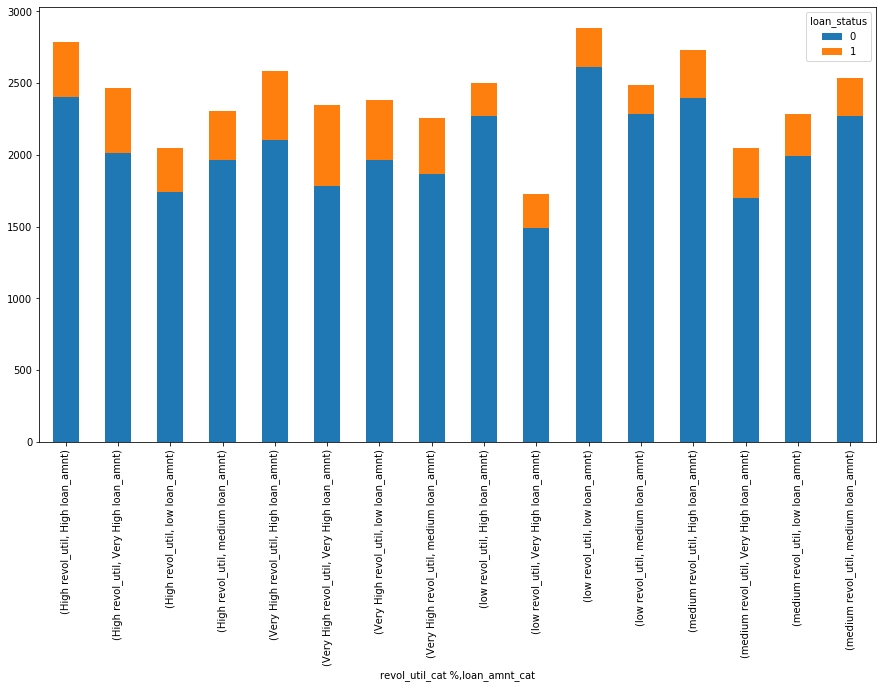

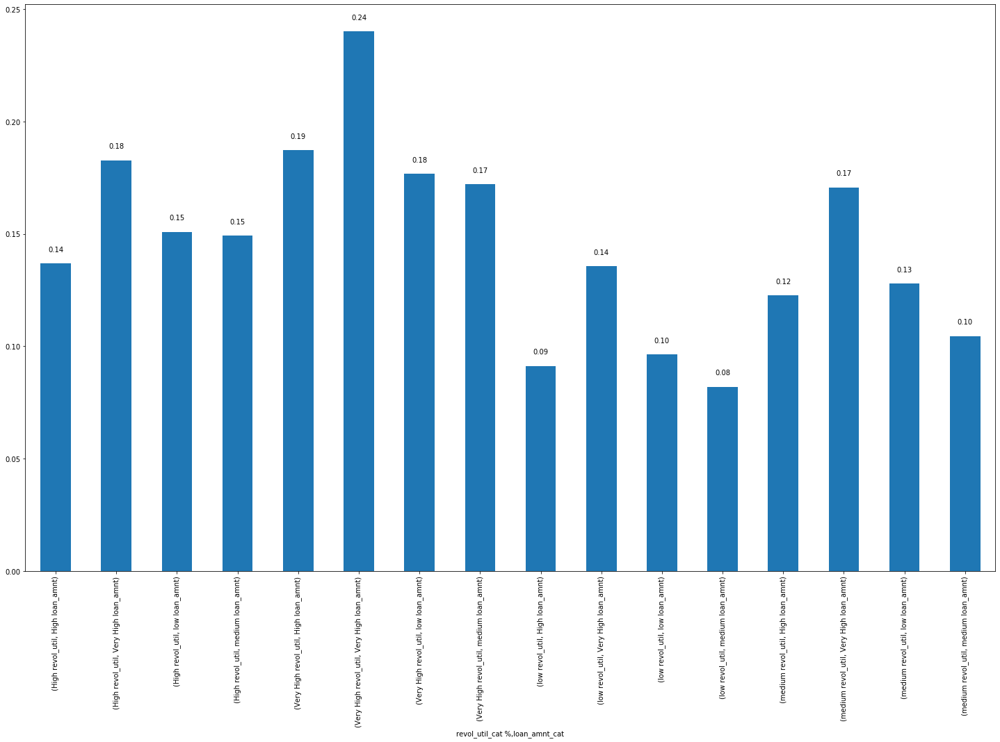

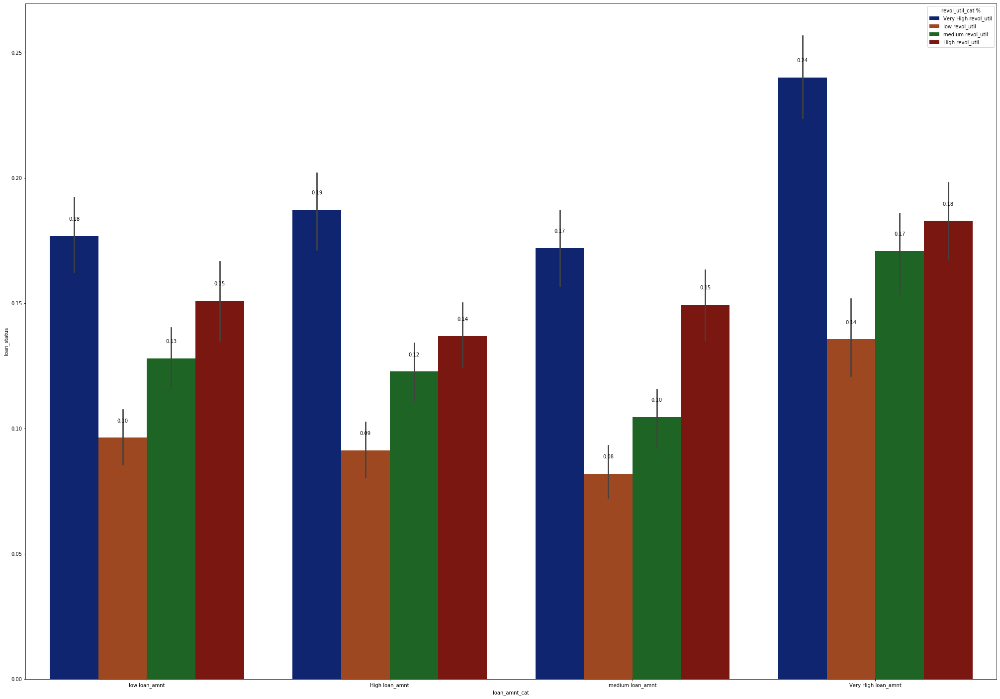

In [258]:
bivariant_plots('revol_util_cat %','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 35, y2 = 25, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- from the joint plot it is observerd that , for higher rate of revol_util the default rates is drastically high. whereas for higher loan amount and with lesses rate of revol_util also has high default cases. with high revol_util rate and with higher loan amount is a very risky factor

### loan_status, loan_amnt, home_ownership

<Figure size 1440x360 with 0 Axes>

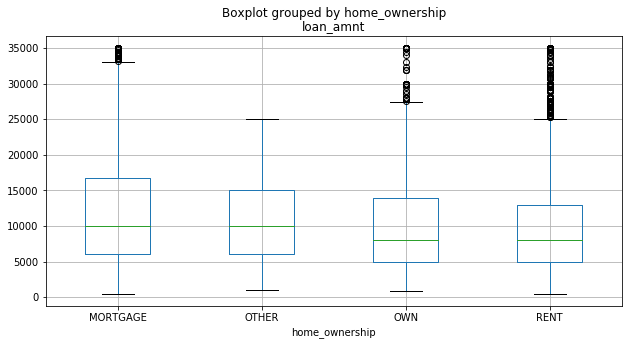

In [259]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'home_ownership',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                             0     1    All
home_ownership loan_amnt_cat                          
MORTGAGE       High loan_amnt        4246   623   4869
               Very High loan_amnt   3993   863   4856
               low loan_amnt         2965   393   3358
               medium loan_amnt      3445   420   3865
OTHER          High loan_amnt          23     7     30
               Very High loan_amnt     13     7     20
               low loan_amnt           19     1     20
               medium loan_amnt        22     3     25
OWN            High loan_amnt         664   111    775
               Very High loan_amnt    435   108    543
               low loan_amnt          757   123    880
               medium loan_amnt       657    90    747
RENT           High loan_amnt        4236   687   4923
               Very High loan_amnt   2545   619   3164
               low loan_amnt         4556   783   5339
               medium loan_amnt      4259   688   4947
All       

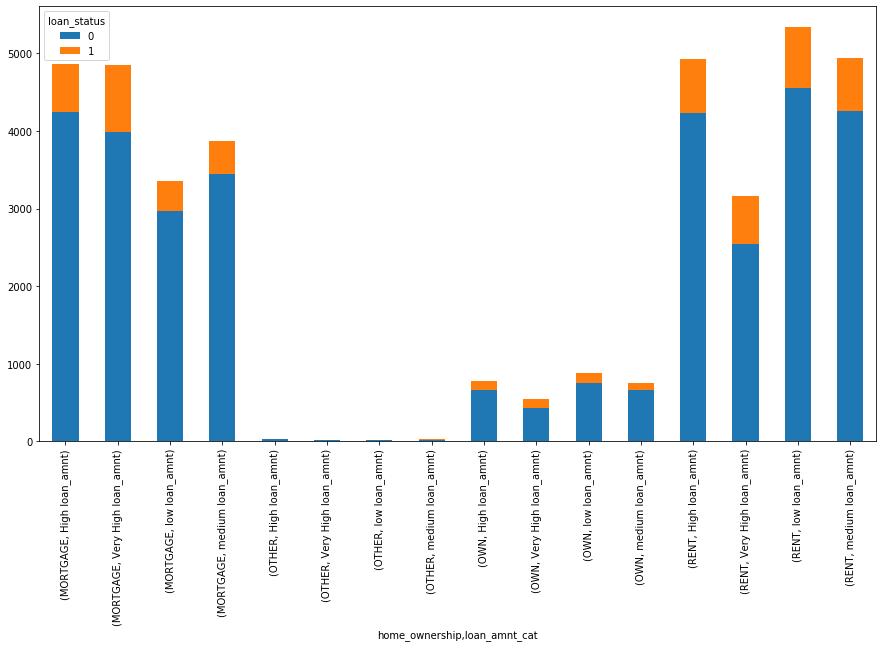

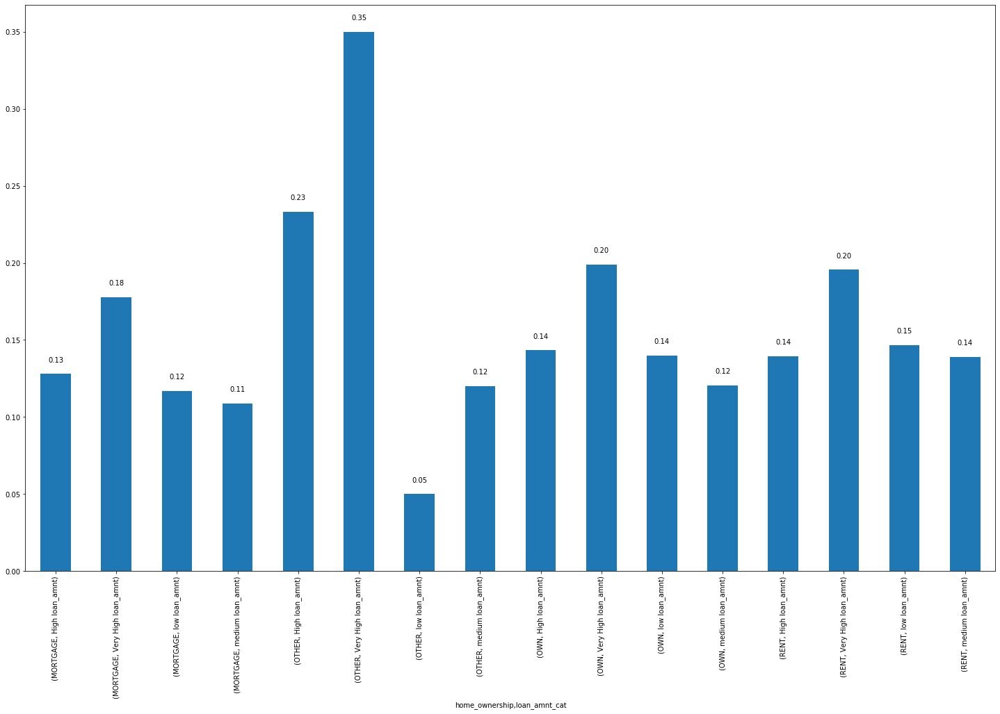

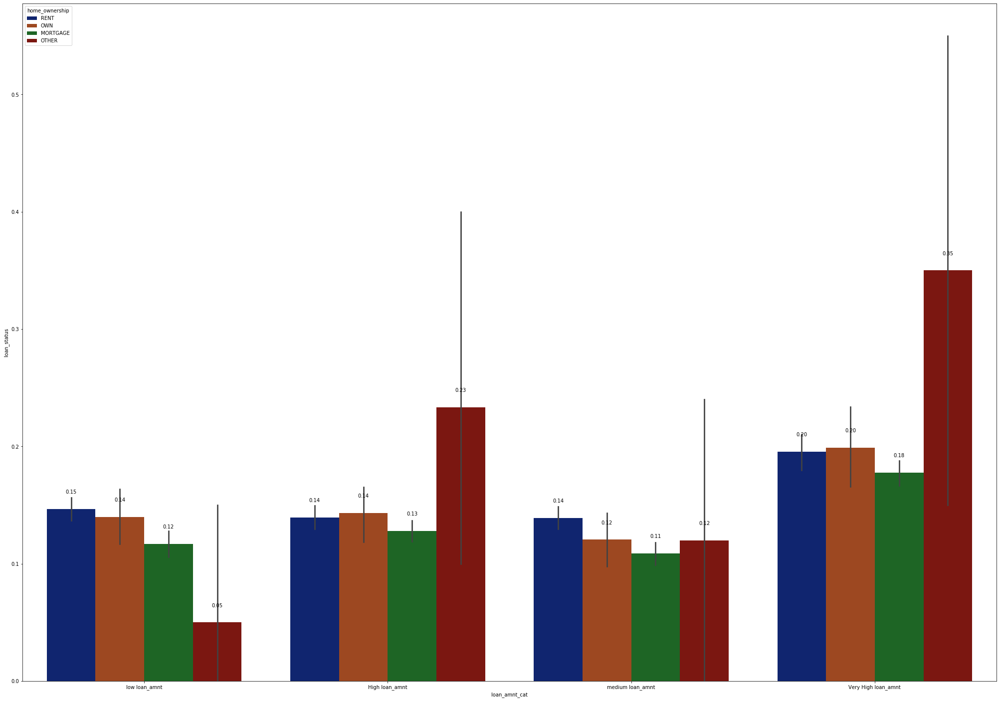

In [260]:
bivariant_plots('home_ownership','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 35, y2 = 25, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- Others have high default rates for high amount of funds

### loan_status, loan_amnt, issue_d_year

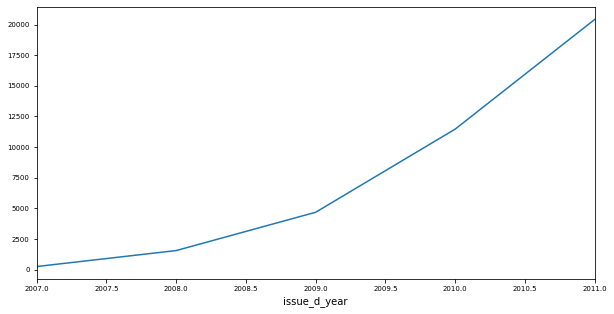

In [261]:
plt.figure(figsize=(10,5))
df.groupby('issue_d_year').loan_amnt.count().plot(kind='line', fontsize=7)
plt.show()

loan_status                           0     1    All
issue_d_year loan_amnt_cat                          
2007         High loan_amnt          35     5     40
             Very High loan_amnt     30    15     45
             low loan_amnt           88    17    105
             medium loan_amnt        49     8     57
2008         High loan_amnt         303    71    374
             Very High loan_amnt    166    54    220
             low loan_amnt          377    43    420
             medium loan_amnt       463    75    538
2009         High loan_amnt        1200   163   1363
             Very High loan_amnt    663   122    785
             low loan_amnt         1124   154   1278
             medium loan_amnt      1113   140   1253
2010         High loan_amnt        2815   375   3190
             Very High loan_amnt   2106   352   2458
             low loan_amnt         2613   391   3004
             medium loan_amnt      2478   336   2814
2011         High loan_amnt        4816   814 

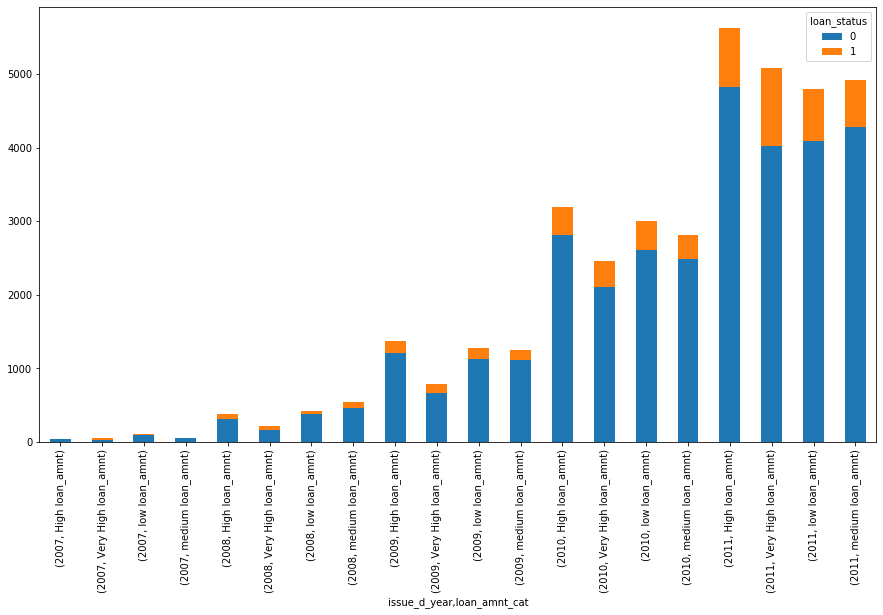

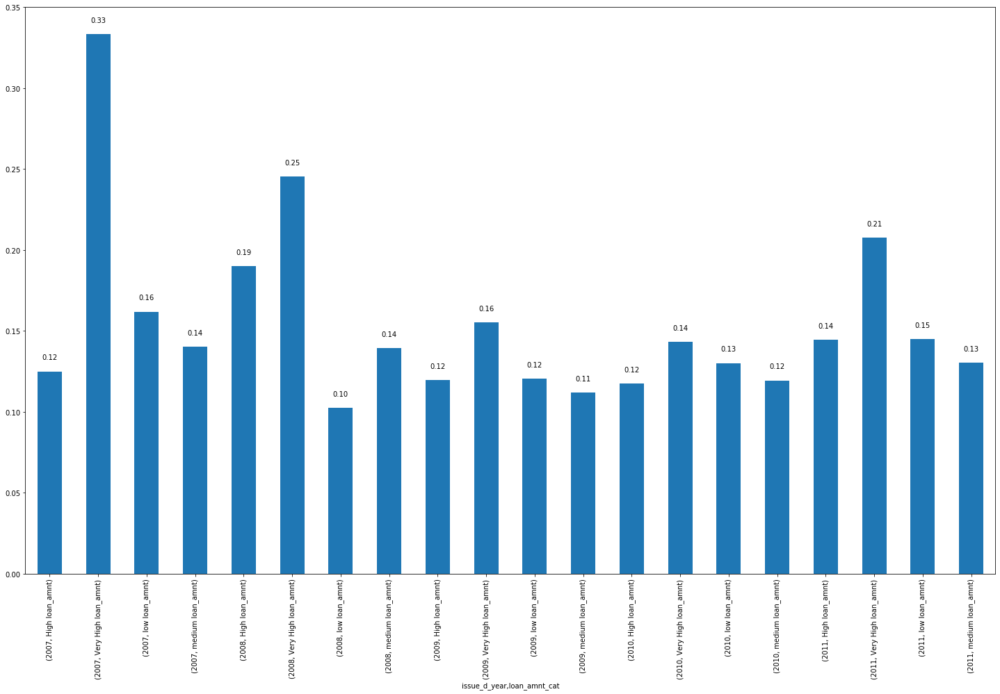

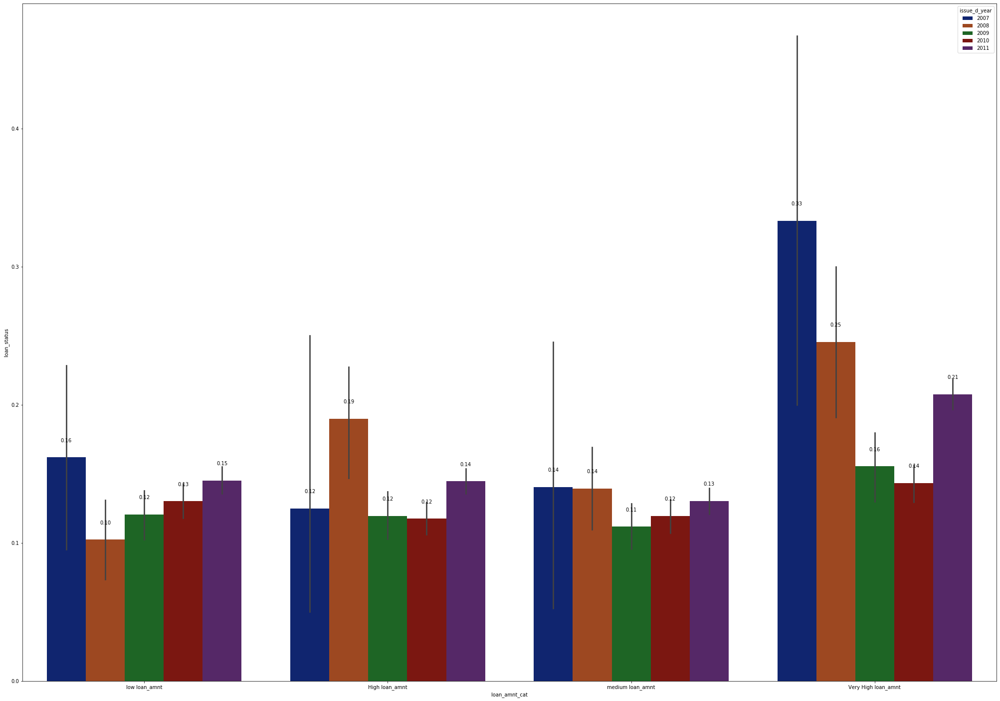

In [262]:
bivariant_plots('issue_d_year','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 35, y2 = 25, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

loan_status                            0     1    All
issue_d_month loan_amnt_cat                          
1             High loan_amnt         649    98    747
              Very High loan_amnt    391    71    462
              low loan_amnt          465    75    540
              medium loan_amnt       542    72    614
2             High loan_amnt         697    81    778
              Very High loan_amnt    368    74    442
              low loan_amnt          451    70    521
              medium loan_amnt       543    61    604
3             High loan_amnt         683    80    763
              Very High loan_amnt    474   105    579
              low loan_amnt          549    76    625
              medium loan_amnt       627    77    704
4             High loan_amnt         652    99    751
              Very High loan_amnt    488    99    587
              low loan_amnt          660    87    747
              medium loan_amnt       658    78    736
5             High loan_amnt

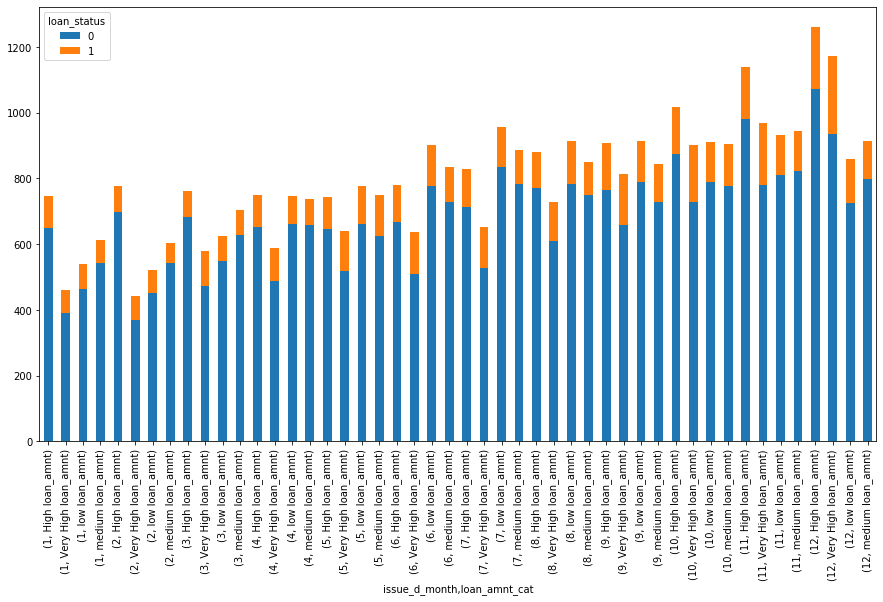

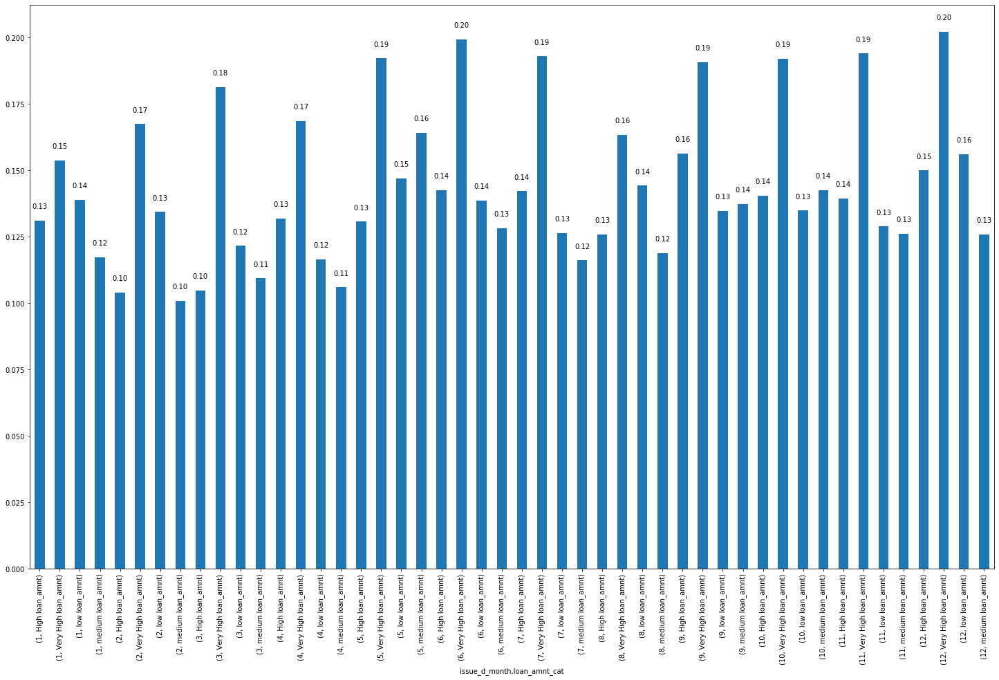

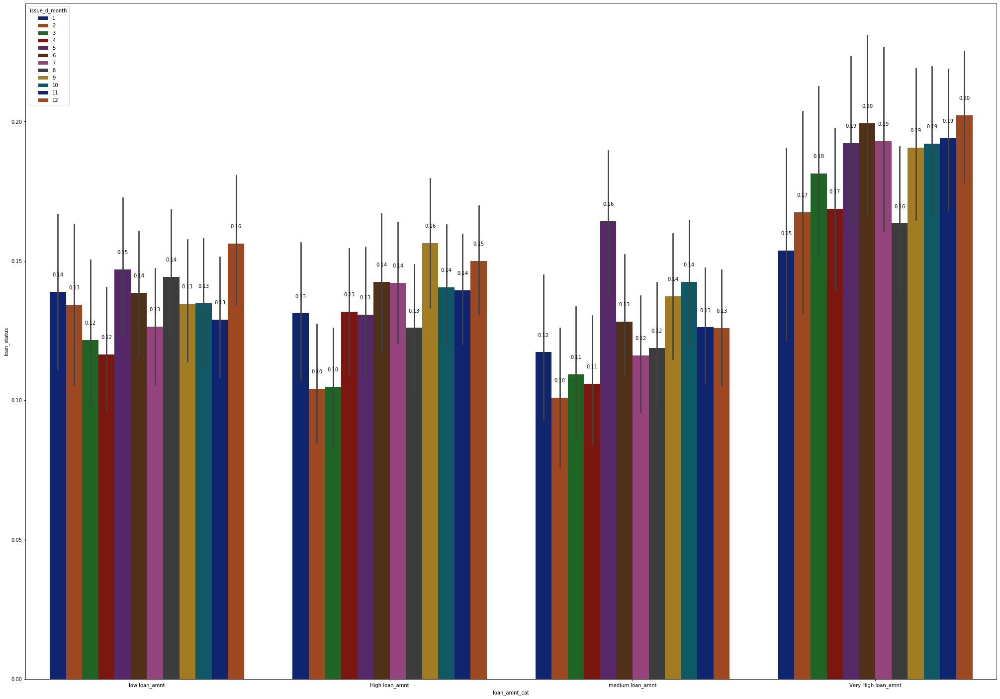

In [263]:
bivariant_plots('issue_d_month','loan_amnt_cat',x1 = 25,y1 = 15,x2 = 35, y2 = 25, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- From the plots it is observerd that high number of defaults are in the case when lending company lends high amount of loans to the custormers. and the default cases had decreased from 2007 to 2009 and again it raised from 2010 to 2011. it is observed that there was a financial problem crisis in the countries market

### loan_status, term, annual_inc

<Figure size 1440x360 with 0 Axes>

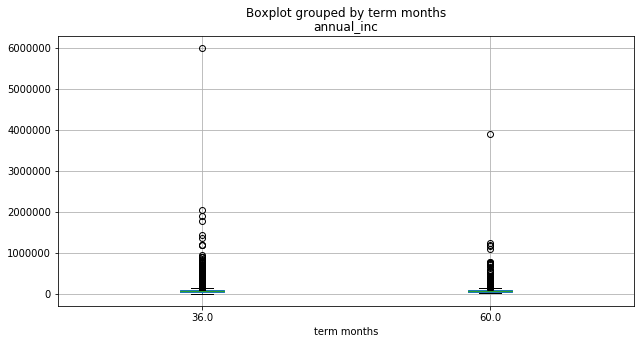

In [264]:
bivariant_box_joint_plots(cat1 = 'annual_inc' ,cat2 = 'term months',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                       0     1    All
annual_inc_cat   term months                    
High income      36.0          6314   664   6978
                 60.0          1909   658   2567
Very High income 36.0          6292   543   6835
                 60.0          2191   520   2711
low income       36.0          6681  1134   7815
                 60.0          1227   571   1798
medium income    36.0          6482   815   7297
                 60.0          1739   621   2360
All                           32835  5526  38361


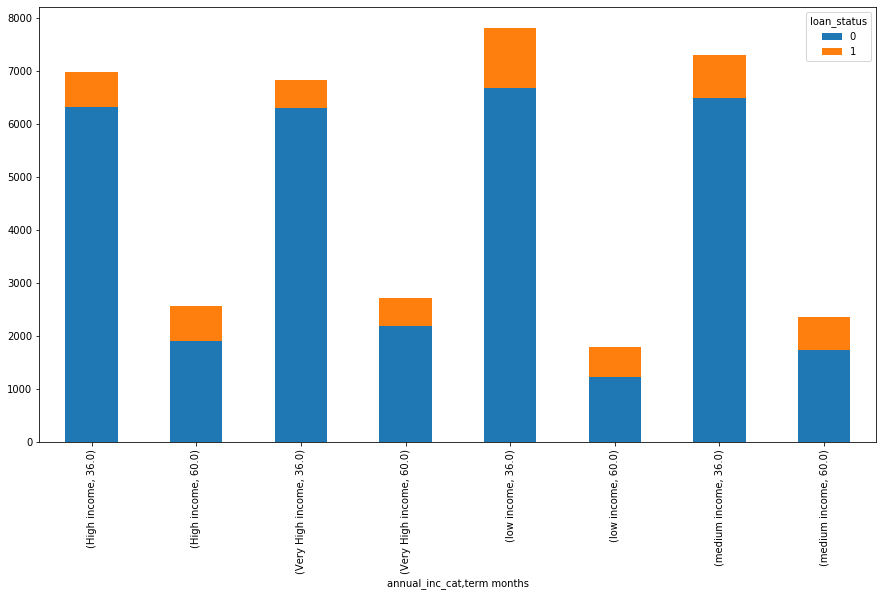

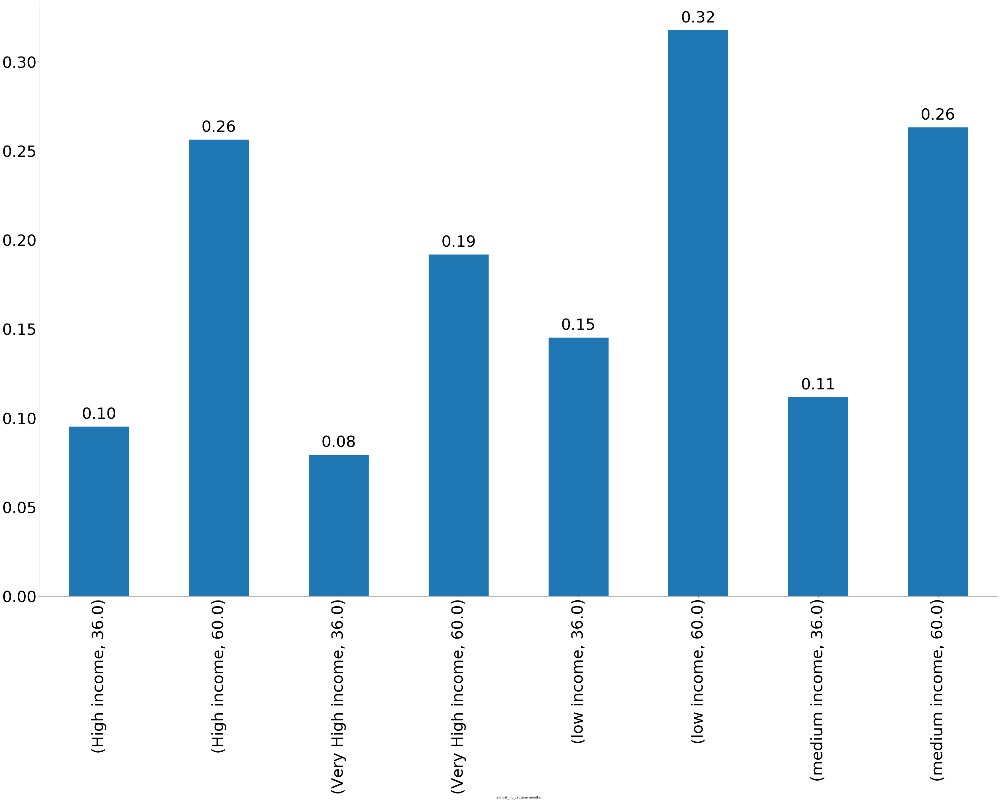

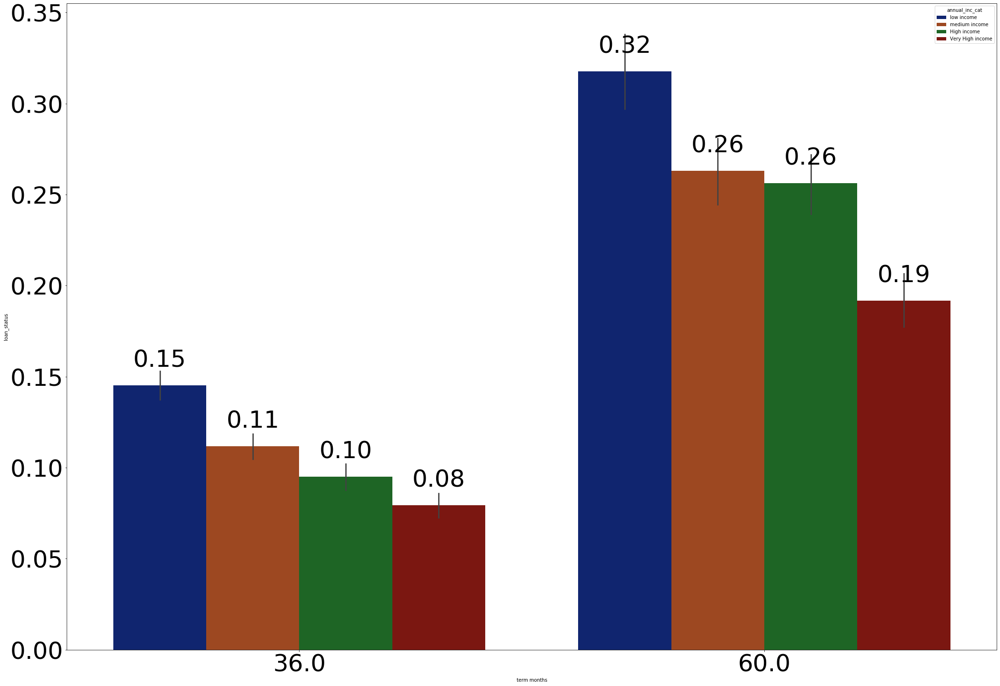

In [265]:
bivariant_plots('annual_inc_cat','term months',x1 = 55,y1 = 35,x2 = 35, y2 = 25, axsize1 = 50, spacing1 = 15, axsize2 = 50,spacing2 = 29,Set = 'dark' )

### Observation
- Low income Has highest defaults for any of the two terms. it also seen that terms with 60 months have high default rates compared to term with 30 months. Hence Terms varibale is also one og the main driving factors for determing the faults

### Purpose
##### Only top 6 purpose of loan are been considered for further analysis

In [266]:
x = list(pd.DataFrame(df.purpose.value_counts().sort_values(ascending = False).reset_index(level=0)[0:6]).iloc[:,0])

In [267]:
df = df[df.purpose.isin(x)]

### loan_status,purpose,loan_amnt

<Figure size 7200x360 with 0 Axes>

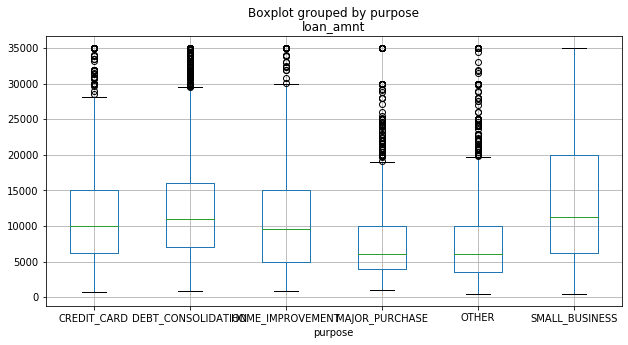

In [268]:
bivariant_box_joint_plots(cat1 = 'loan_amnt' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 100, y = 5)

loan_status                                 0     1    All
purpose            loan_amnt_cat                          
CREDIT_CARD        High loan_amnt        1408   161   1569
                   Very High loan_amnt   1000   168   1168
                   low loan_amnt          835    76    911
                   medium loan_amnt      1230   132   1362
DEBT_CONSOLIDATION High loan_amnt        4920   781   5701
                   Very High loan_amnt   4111   956   5067
                   low loan_amnt         2477   428   2905
                   medium loan_amnt      3747   562   4309
HOME_IMPROVEMENT   High loan_amnt         670    94    764
                   Very High loan_amnt    565    89    654
                   low loan_amnt          682    86    768
                   medium loan_amnt       601    69    670
MAJOR_PURCHASE     High loan_amnt         354    37    391
                   Very High loan_amnt    198    37    235
                   low loan_amnt          813    85    8

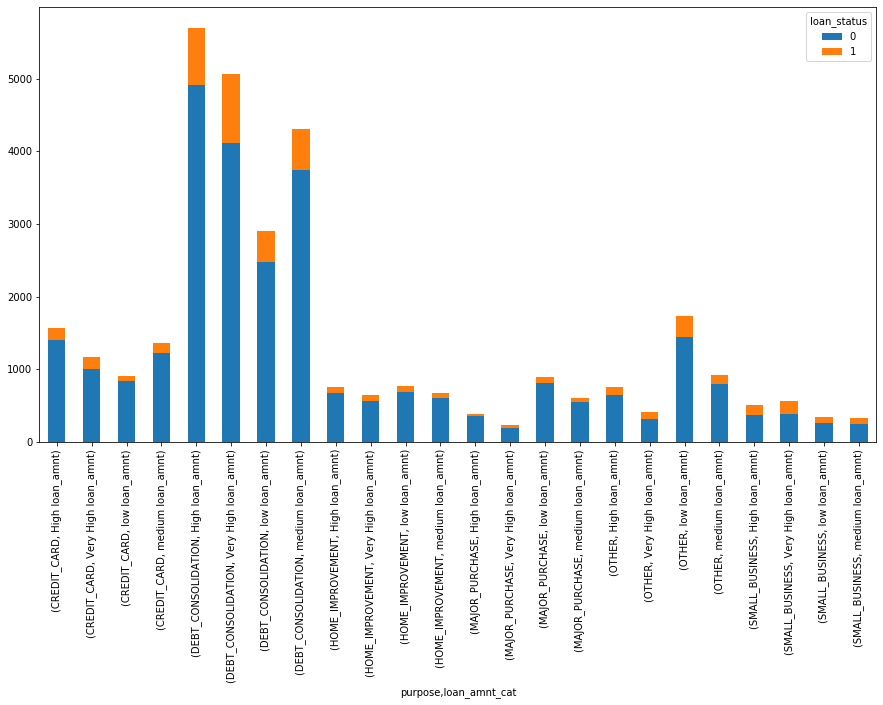

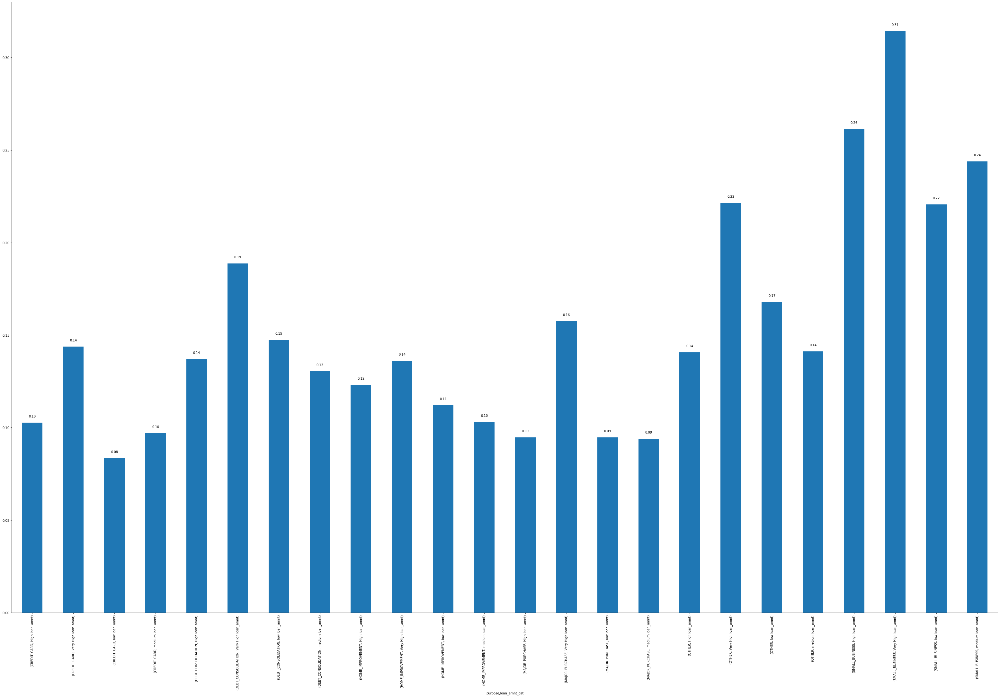

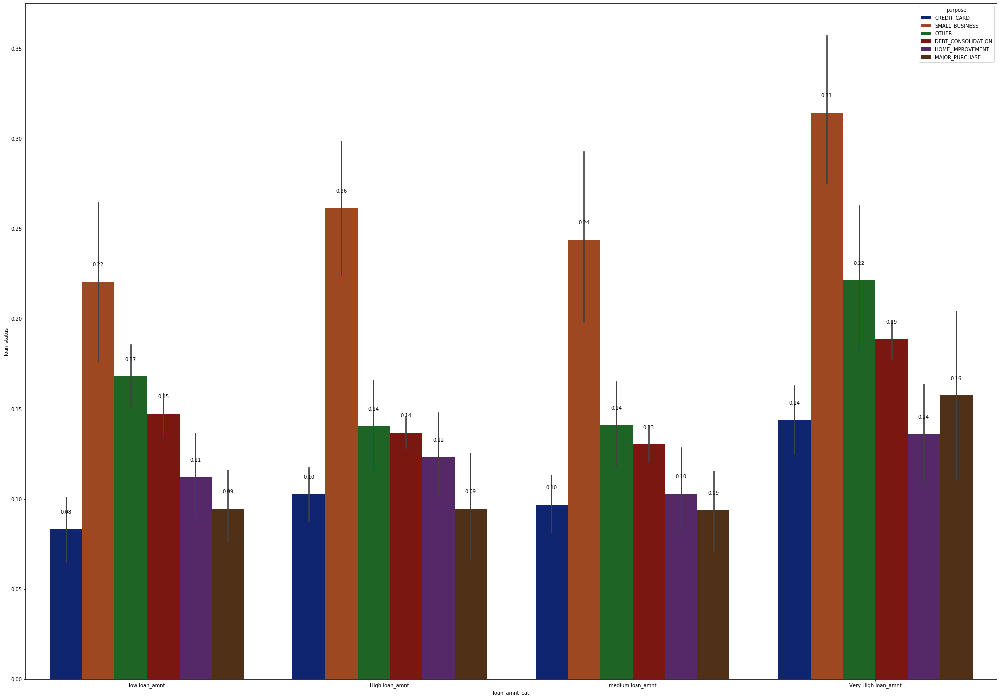

In [269]:
bivariant_plots('purpose','loan_amnt_cat',plot1 = True,x1 = 55,y1 = 35,x2 = 35, y2 = 25, axsize1 = 10, spacing1 = 15, axsize2 = 10,spacing2 = 29,Set = 'dark' )

### Observation
- Small business have high default rates for anytype of loan

### loan_status,purpose,term

loan_status                         0     1    All
purpose            term months                    
CREDIT_CARD        36.0          3763   315   4078
                   60.0           710   222    932
DEBT_CONSOLIDATION 36.0         11634  1441  13075
                   60.0          3621  1286   4907
HOME_IMPROVEMENT   36.0          1866   199   2065
                   60.0           652   139    791
MAJOR_PURCHASE     36.0          1577   133   1710
                   60.0           338    83    421
OTHER              36.0          2705   404   3109
                   60.0           507   216    723
SMALL_BUSINESS     36.0           964   262   1226
                   60.0           309   202    511
All                             28646  4902  33548


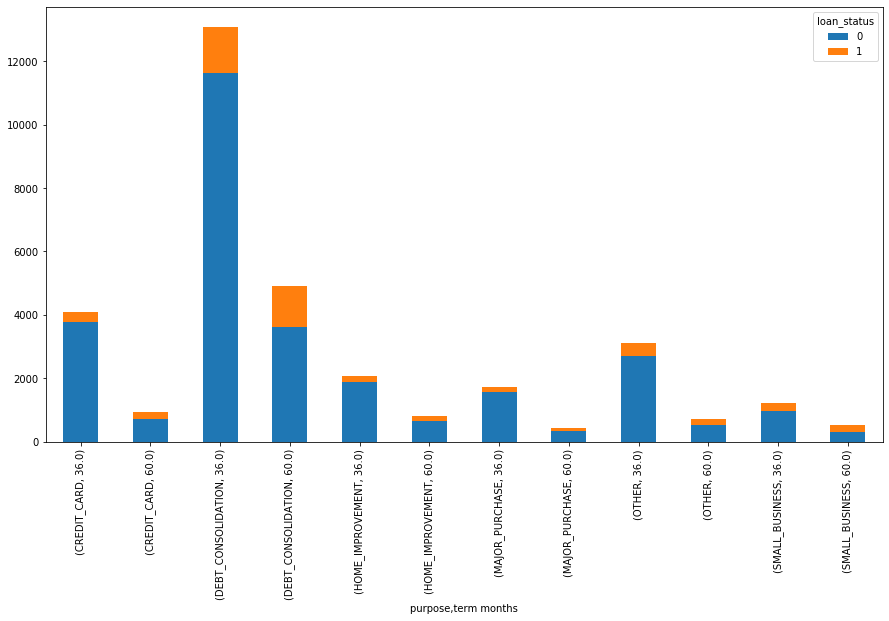

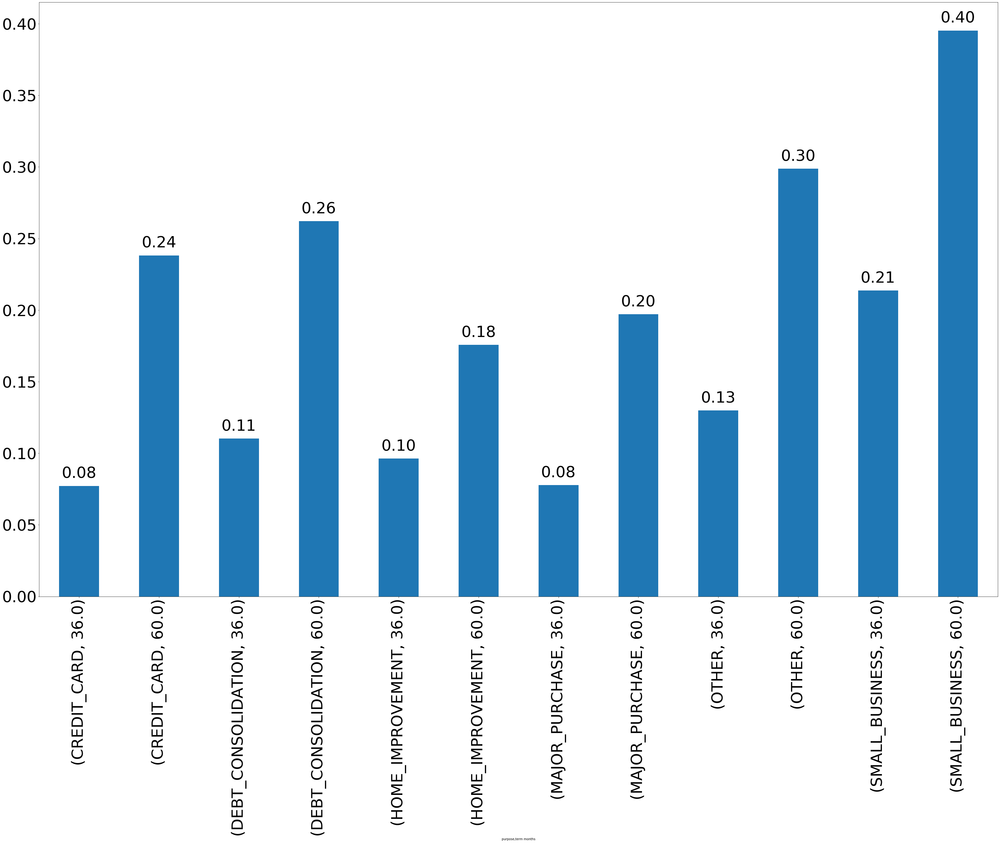

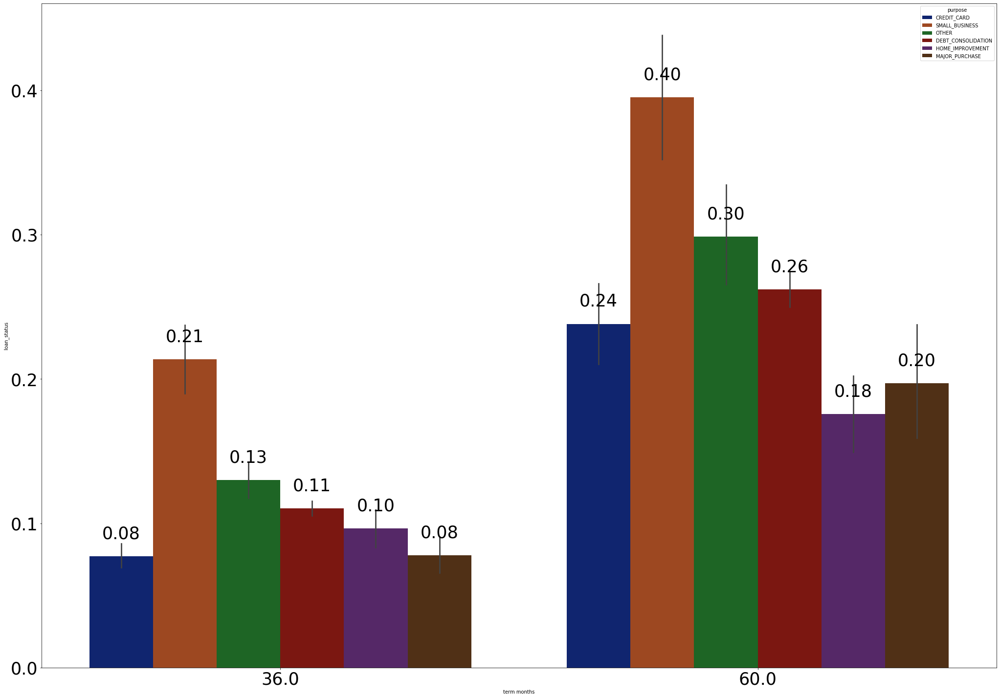

In [270]:
bivariant_plots('purpose','term months',x1 = 55,y1 = 35,x2 = 35, y2 = 25, axsize1 = 50, spacing1 = 15, axsize2 = 35,spacing2 = 29,Set = 'dark' )

### Observation
- small business and Education are the two sectors in which the default rate is high for a given term

### loan_status,purpose, emp_length

<Figure size 1440x360 with 0 Axes>

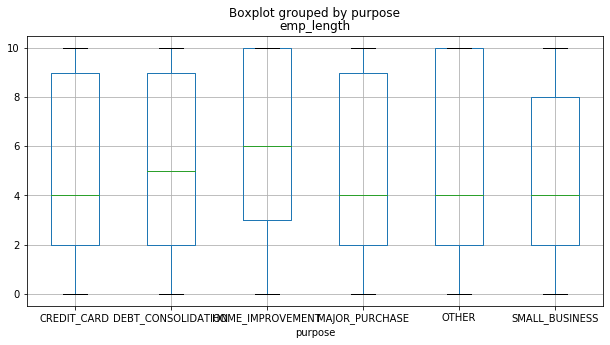

In [271]:
bivariant_box_joint_plots(cat1 = 'emp_length' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                            0     1    All
purpose            emp_length_cat                    
CREDIT_CARD        0-1 exp_years    1467   140   1607
                   2-4 exp_years     857   100    957
                   5-7 exp_years     780   114    894
                   8-10 exp_years   1369   183   1552
DEBT_CONSOLIDATION 0-1 exp_years    4658   764   5422
                   2-4 exp_years    2960   469   3429
                   5-7 exp_years    2909   515   3424
                   8-10 exp_years   4728   979   5707
HOME_IMPROVEMENT   0-1 exp_years     558    89    647
                   2-4 exp_years     449    51    500
                   5-7 exp_years     458    61    519
                   8-10 exp_years   1053   137   1190
MAJOR_PURCHASE     0-1 exp_years     615    68    683
                   2-4 exp_years     388    47    435
                   5-7 exp_years     355    38    393
                   8-10 exp_years    557    63    620
OTHER              0-1 exp_y

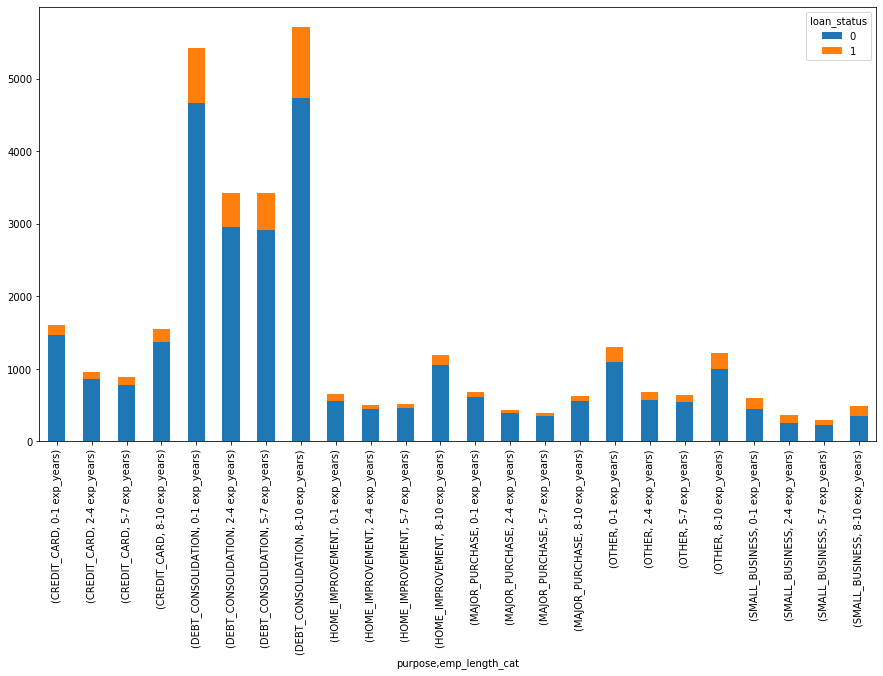

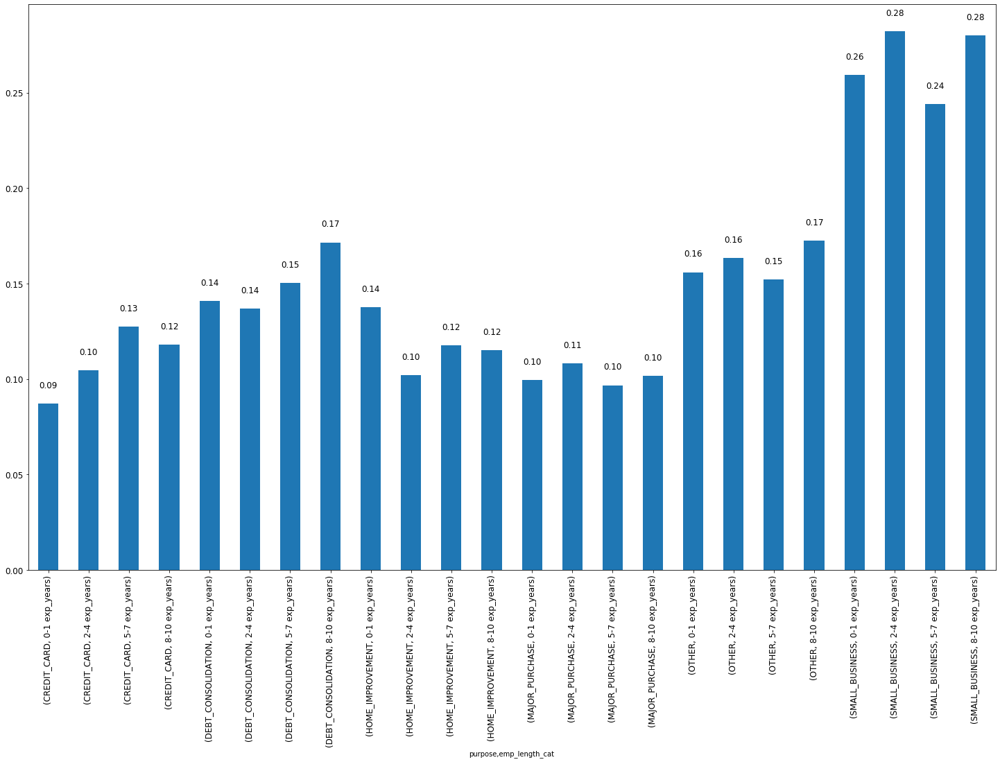

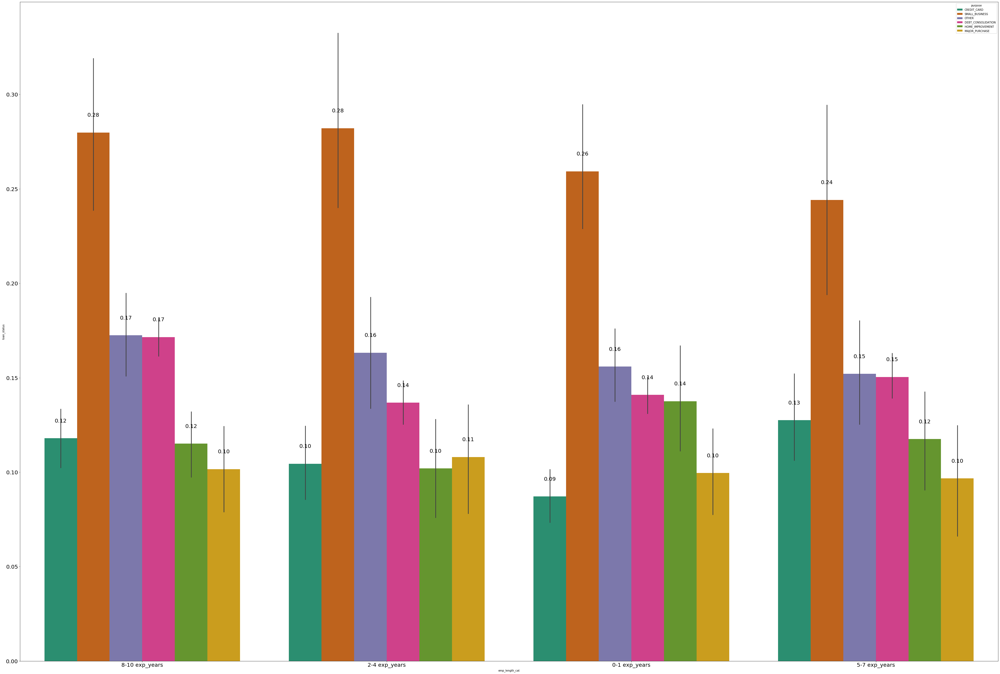

In [272]:
bivariant_plots(cat1 = 'purpose',cat2 = 'emp_length_cat',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation
- it is observed that the custormers with relevantly higher experience have got higher defaults compared to other experience groups. small business and Debt consolidation and others are the main sectors of the defaults.

### loan_status,purpose, grade

loan_status                   0     1    All
purpose            grade                    
CREDIT_CARD        A       1329    63   1392
                   B       1477   149   1626
                   C        899   140   1039
                   D        474    96    570
                   E        198    63    261
                   F         71    23     94
                   G         25     3     28
DEBT_CONSOLIDATION A       3605   240   3845
                   B       4826   628   5454
                   C       3167   626   3793
                   D       2110   583   2693
                   E       1084   398   1482
                   F        356   198    554
                   G        107    54    161
HOME_IMPROVEMENT   A        913    41    954
                   B        763    95    858
                   C        419    91    510
                   D        232    58    290
                   E        135    37    172
                   F         43    14     57
          

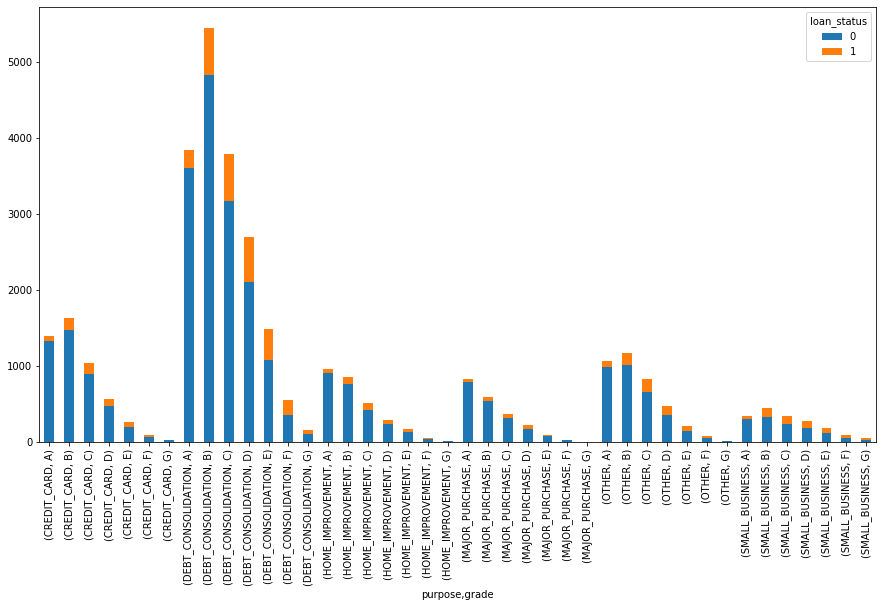

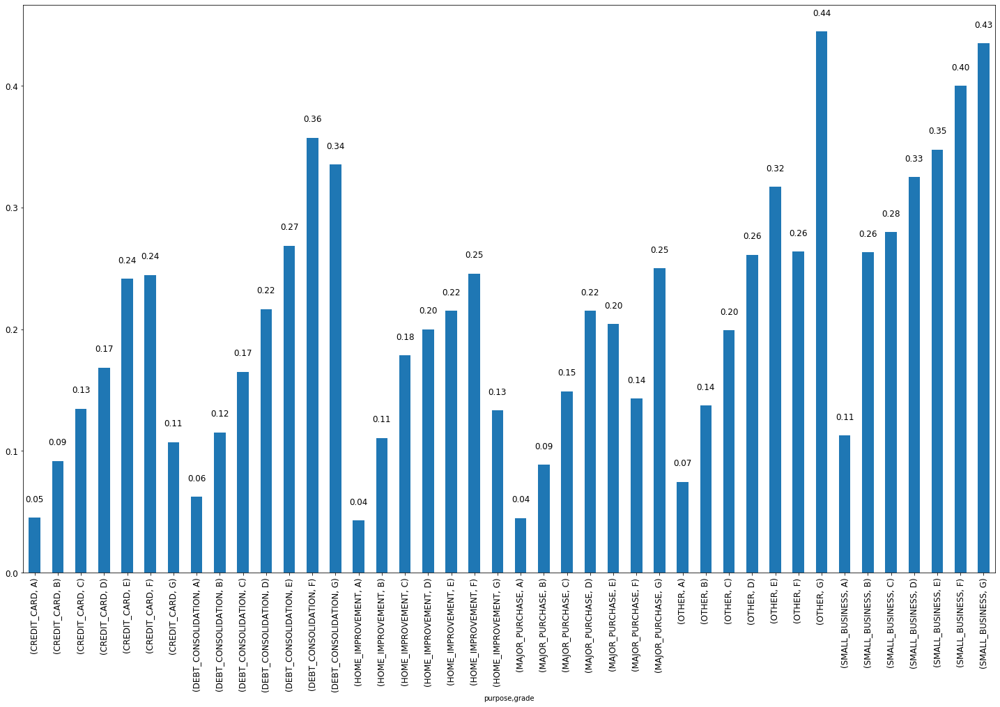

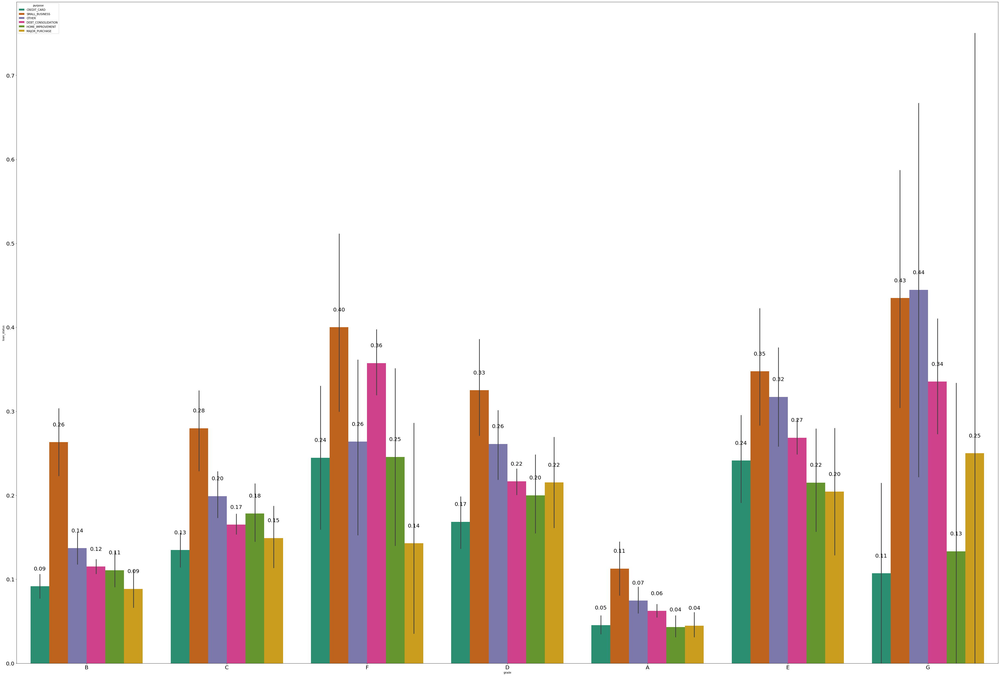

In [273]:
bivariant_plots(cat1 = 'purpose',cat2 = 'grade',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation
- Grade G & F has highest defaults and small business, Debt Consolidation, Others 

### loan_status,purpose, issue_year, issue_month

loan_status                          0     1    All
purpose            issue_d_year                    
CREDIT_CARD        2007             41     2     43
                   2008            233    35    268
                   2009            517    48    565
                   2010           1300   131   1431
                   2011           2382   321   2703
DEBT_CONSOLIDATION 2007             61    15     76
                   2008            519   103    622
                   2009           1737   242   1979
                   2010           4602   692   5294
                   2011           8336  1675  10011
HOME_IMPROVEMENT   2007             18     4     22
                   2008             82    14     96
                   2009            298    36    334
                   2010            753    92    845
                   2011           1367   192   1559
MAJOR_PURCHASE     2007              4     1      5
                   2008             51     9     60
            

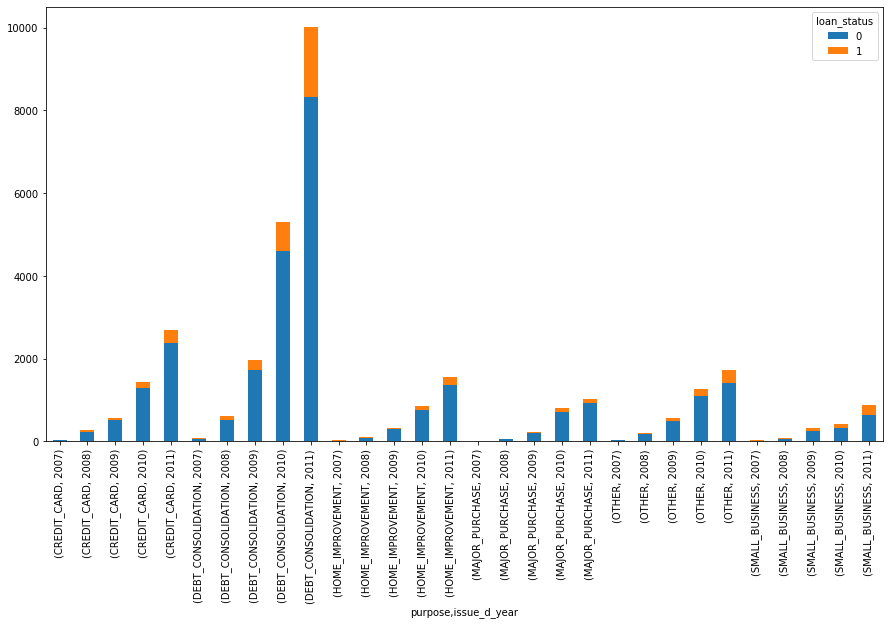

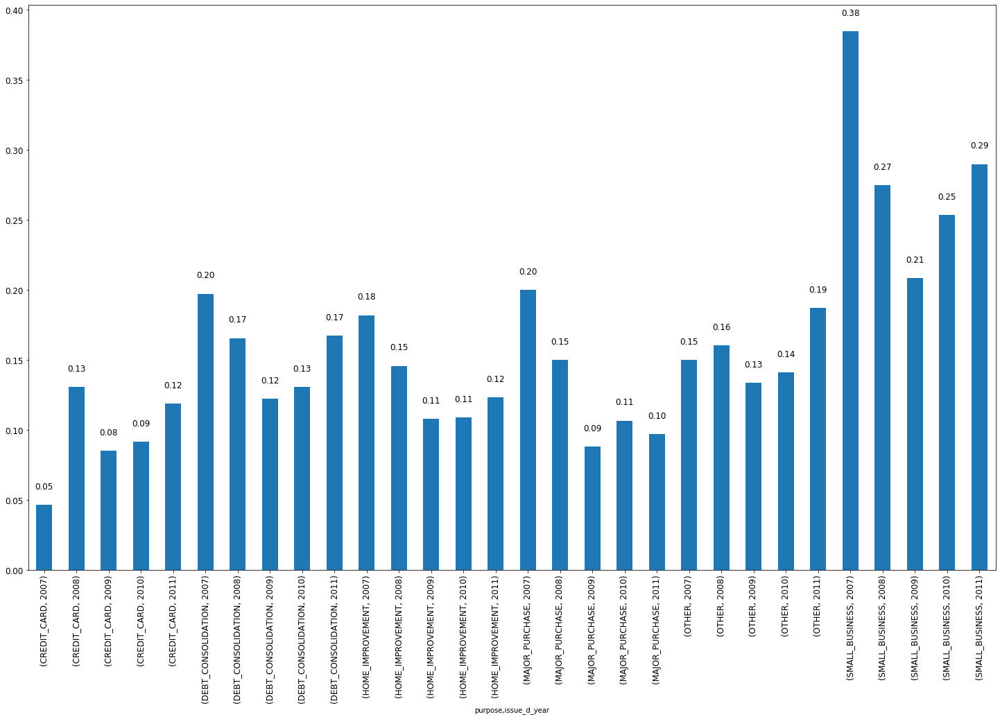

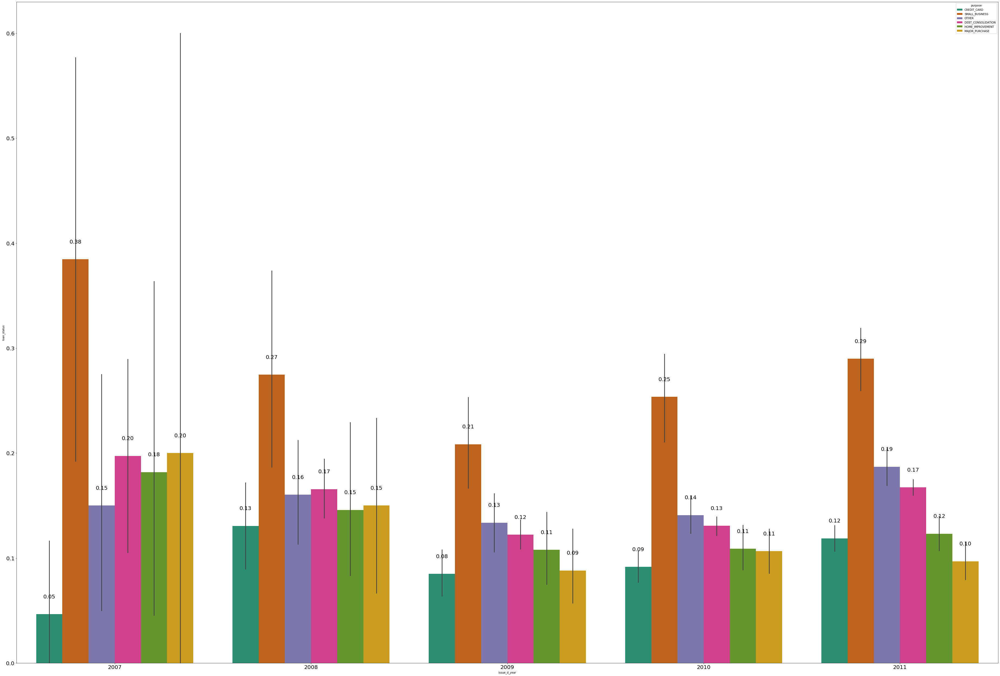

In [274]:
bivariant_plots(cat1 = 'purpose',cat2 = 'issue_d_year',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

loan_status                       0     1    All
purpose        issue_d_month                    
CREDIT_CARD    1                282    41    323
               2                287    26    313
               3                308    34    342
               4                302    34    336
               5                300    39    339
...                             ...   ...    ...
SMALL_BUSINESS 9                 95    48    143
               10               139    50    189
               11               139    50    189
               12               132    50    182
All                           28646  4902  33548

[73 rows x 3 columns]


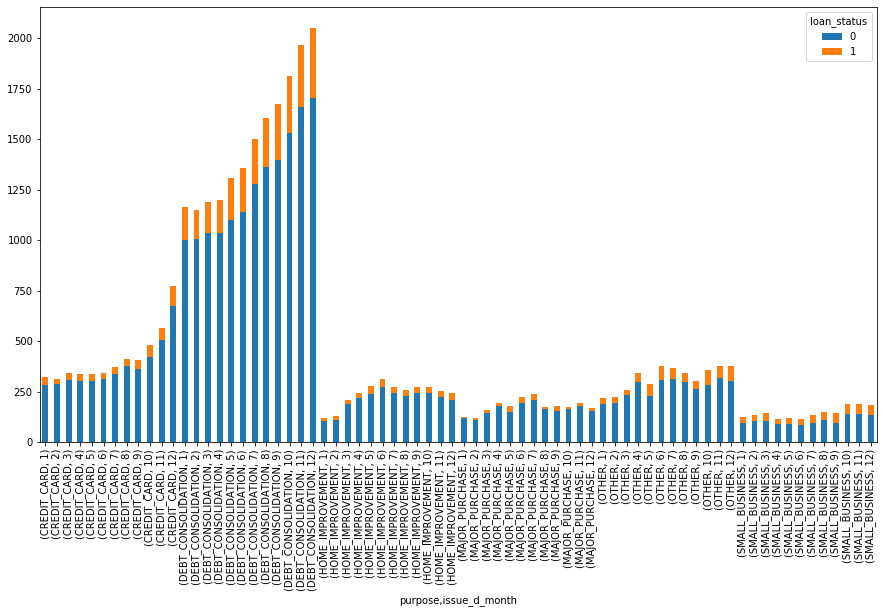

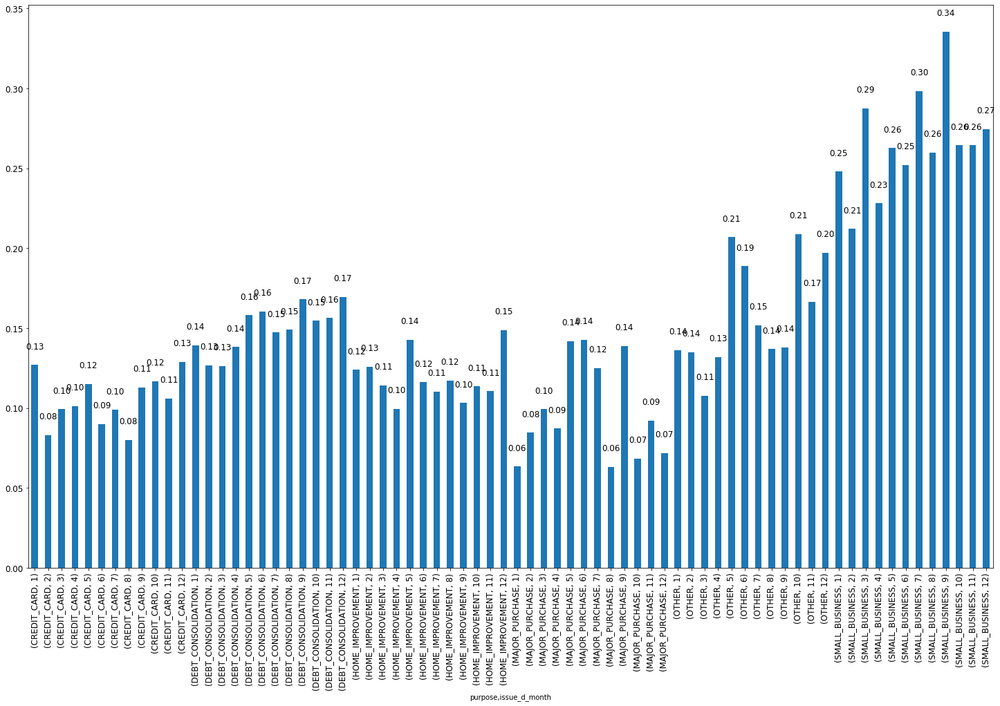

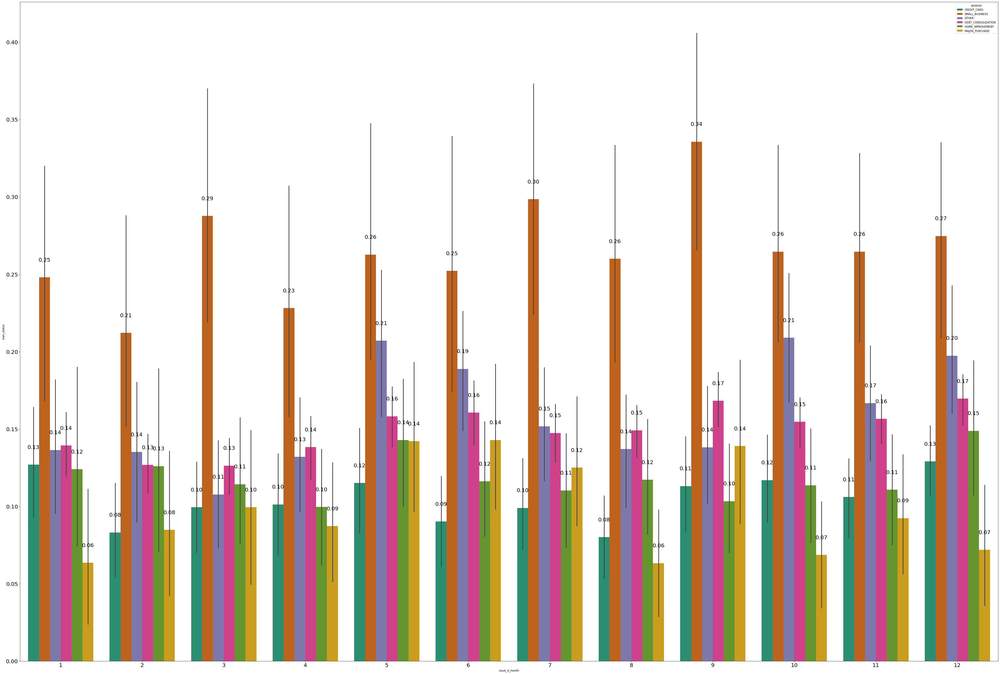

In [275]:
bivariant_plots(cat1 = 'purpose',cat2 = 'issue_d_month',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation
- from the above plots we observe that small businees had made maximum defaults in the year 2007. From the plots we also understand that the default rate went decreasing from 2007 to 2009 and started to increase for the rest of the years. Furthermore the month Dec, May, Oct, Nov has reasonablly high rates of defaults for given purpose

### loan_status,purpose,annual,Inc

<Figure size 1440x360 with 0 Axes>

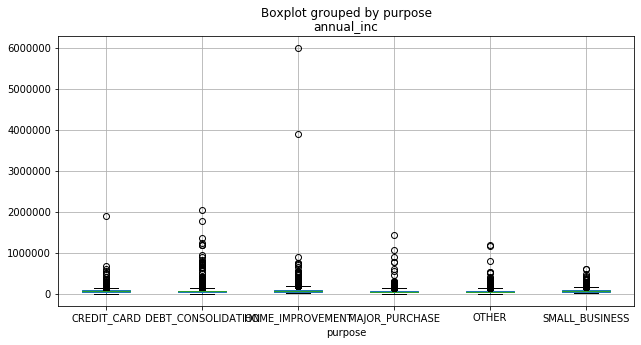

In [276]:
bivariant_box_joint_plots(cat1 = 'annual_inc' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                              0     1    All
purpose            annual_inc_cat                      
CREDIT_CARD        High income        1172   137   1309
                   Very High income   1242   110   1352
                   low income          920   148   1068
                   medium income      1139   142   1281
DEBT_CONSOLIDATION High income        3989   686   4675
                   Very High income   3656   503   4159
                   low income         3588   808   4396
                   medium income      4022   730   4752
HOME_IMPROVEMENT   High income         625    81    706
                   Very High income   1036    97   1133
                   low income          376    66    442
                   medium income       481    94    575
MAJOR_PURCHASE     High income         439    32    471
                   Very High income    457    30    487
                   low income          546    92    638
                   medium income       473    62

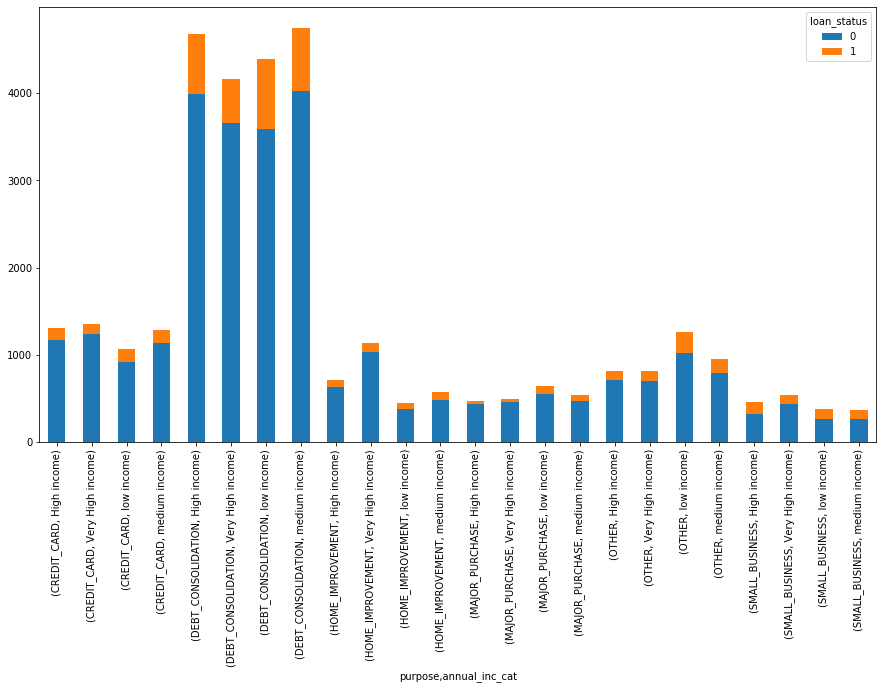

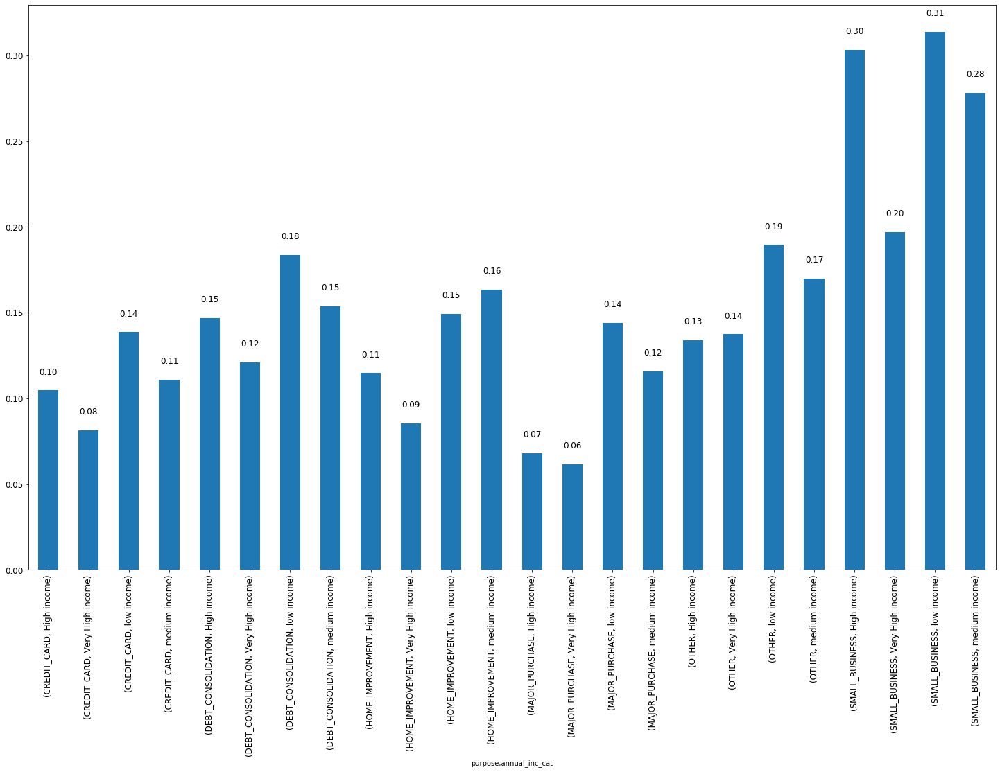

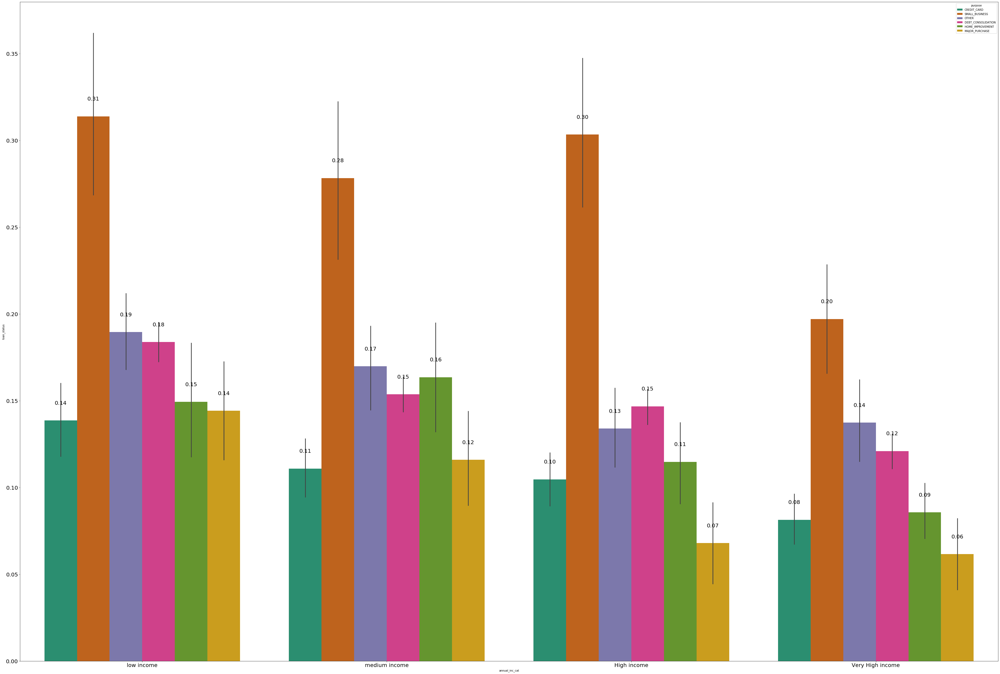

In [277]:
bivariant_plots(cat1 = 'purpose',cat2 = 'annual_inc_cat',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation 
- it is observed that the custormers with low income have high default rates ranging 14% to 31% for different purpose of loans applied.

### loan_status,purpose,Dti

<Figure size 1440x360 with 0 Axes>

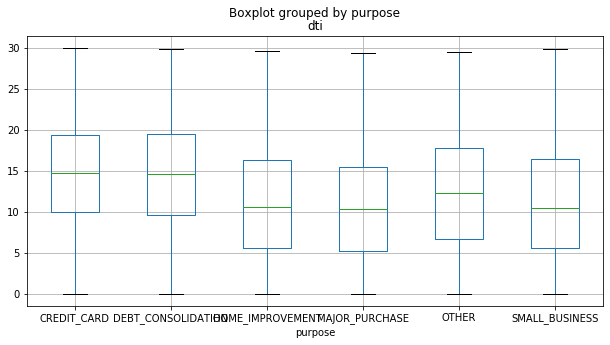

In [278]:
bivariant_box_joint_plots(cat1 = 'dti' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                           0     1    All
purpose            dti_cat                          
CREDIT_CARD        High dti        1265   154   1419
                   Very High dti   1281   184   1465
                   low dti          795    76    871
                   medium dti      1132   123   1255
DEBT_CONSOLIDATION High dti        4143   785   4928
                   Very High dti   4347   921   5268
                   low dti         2909   390   3299
                   medium dti      3856   631   4487
HOME_IMPROVEMENT   High dti         501    78    579
                   Very High dti    408    67    475
                   low dti          952   110   1062
                   medium dti       657    83    740
MAJOR_PURCHASE     High dti         358    50    408
                   Very High dti    289    38    327
                   low dti          770    68    838
                   medium dti       498    60    558
OTHER              High dti         750   145 

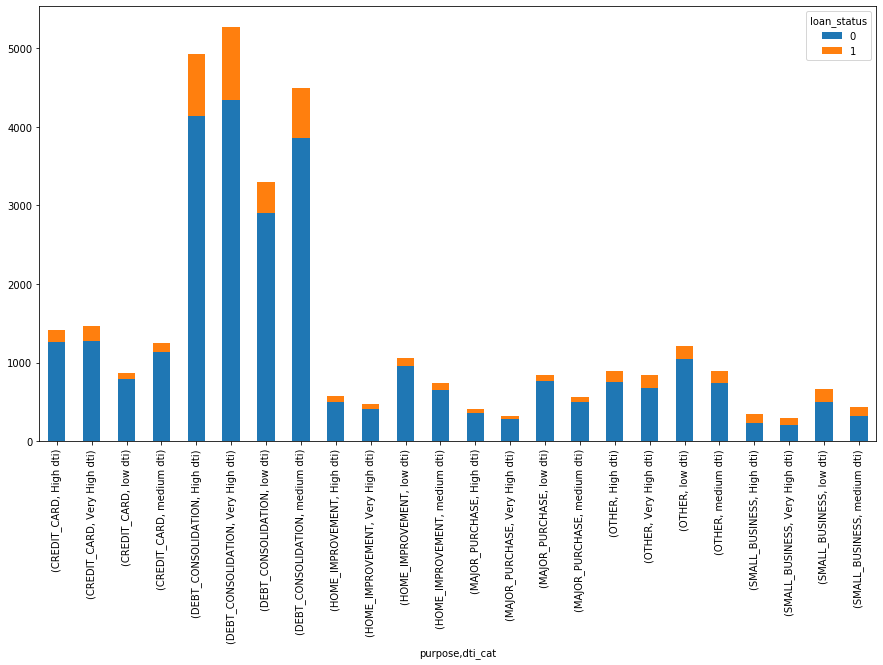

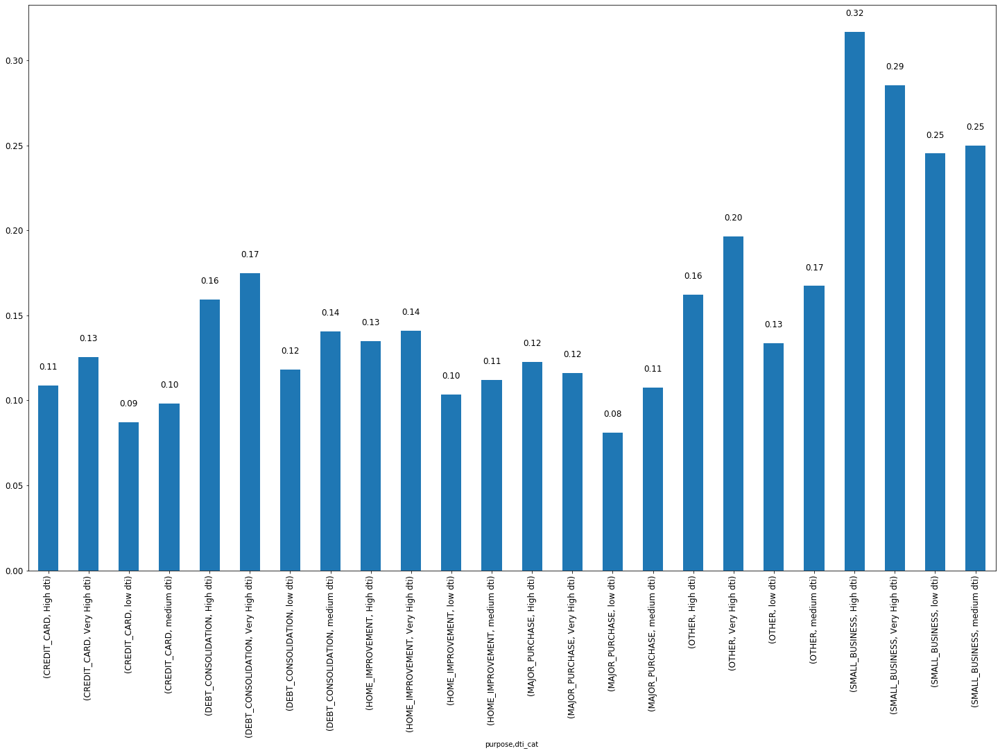

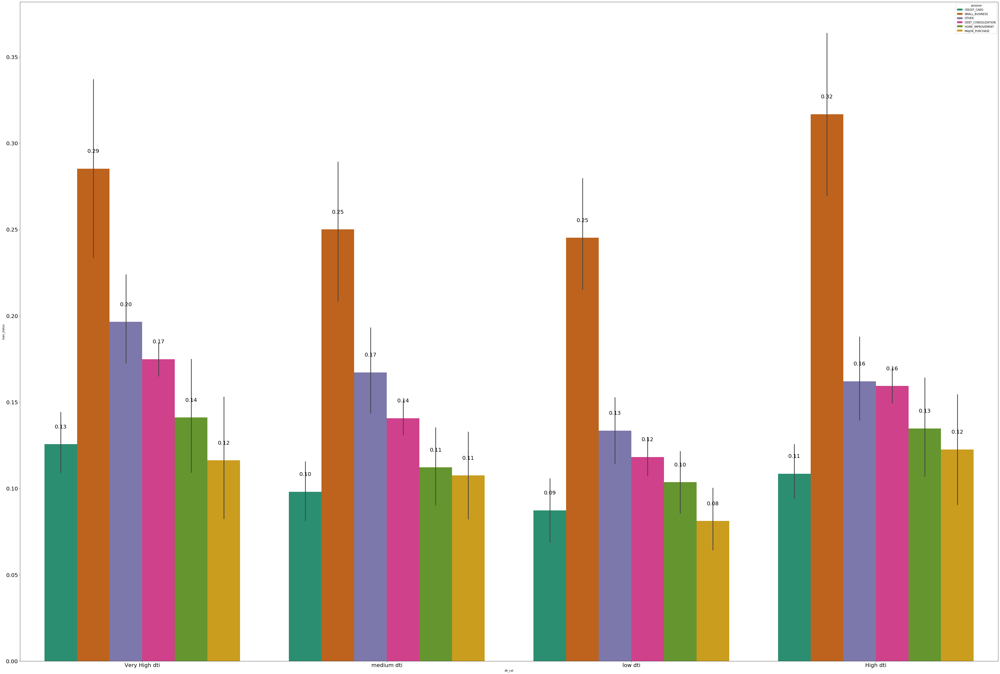

In [279]:
bivariant_plots(cat1 = 'purpose',cat2 = 'dti_cat',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation 
- It is observed that high dti rates have fairly higher default rates that ranges from 11% to 32%. Custormers with small business and with high dti rate have the default percentage close to 32% and the average percentage of deafults for small business across various dti ranges is about 28%, it is quite significant number.

### loan_status,purpose, pub_rec_bankruptcies 

loan_status                                  0     1    All
purpose            pub_rec_bankruptcies                    
CREDIT_CARD        0.0                    4287   492   4779
                   1.0                     185    44    229
                   2.0                       1     1      2
DEBT_CONSOLIDATION 0.0                   14633  2529  17162
                   1.0                     621   197    818
                   2.0                       1     1      2
HOME_IMPROVEMENT   0.0                    2403   319   2722
                   1.0                     115    19    134
MAJOR_PURCHASE     0.0                    1872   209   2081
                   1.0                      43     7     50
OTHER              0.0                    3122   592   3714
                   1.0                      89    28    117
                   2.0                       1     0      1
SMALL_BUSINESS     0.0                    1222   439   1661
                   1.0                  

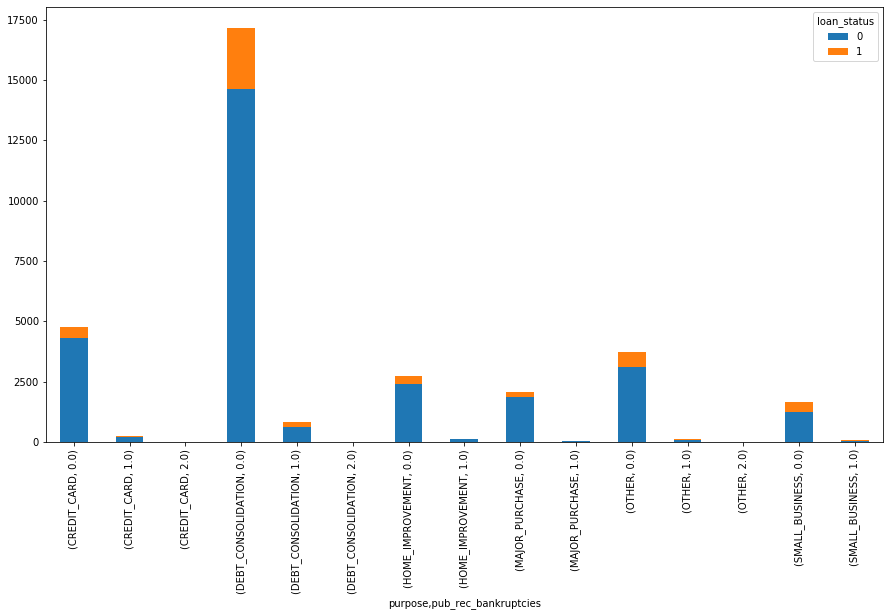

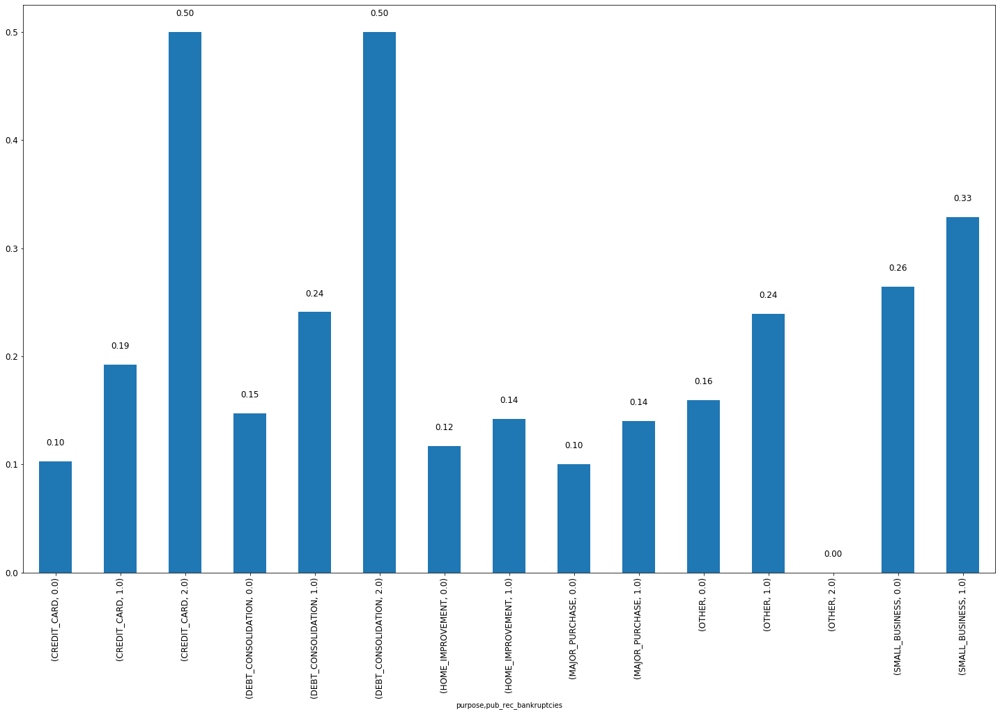

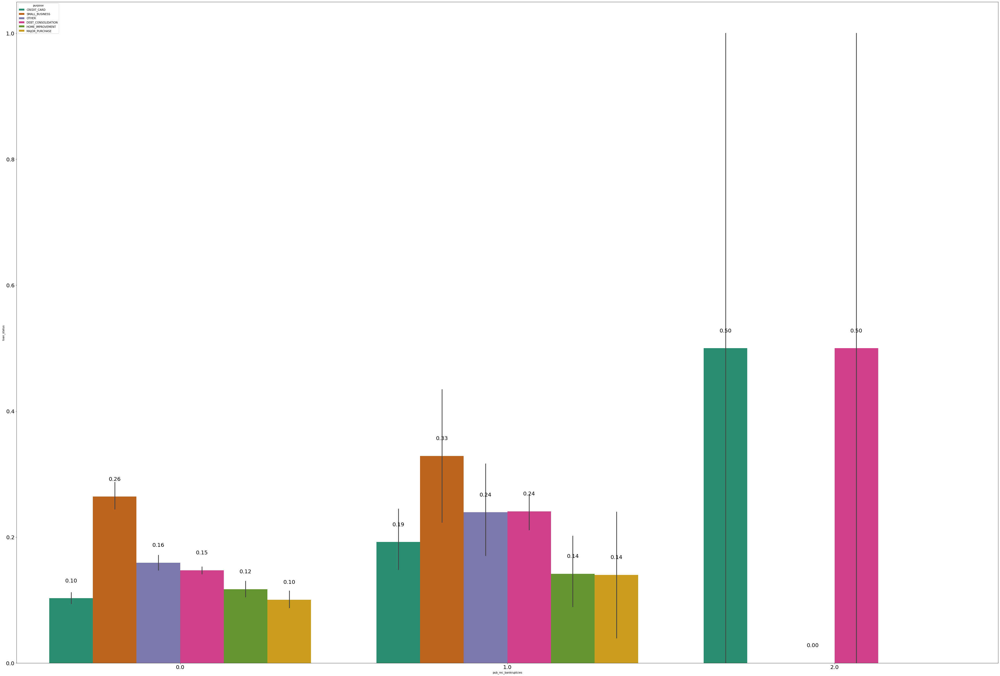

In [280]:
bivariant_plots(cat1 = 'purpose',cat2 = 'pub_rec_bankruptcies',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation 
- High values pub_rec_bankruptcies have high rate of defaults close to 50%, irrespective to the type of the purpose

### loan_status,purpose, revol_util

<Figure size 1440x360 with 0 Axes>

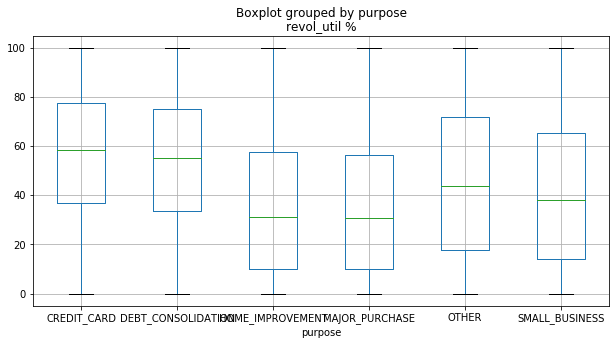

In [281]:
bivariant_box_joint_plots(cat1 = 'revol_util %' ,cat2 = 'purpose',plot1 = False,plot2 = True,x = 20, y = 5)

loan_status                                  0     1    All
purpose            revol_util_cat %                        
CREDIT_CARD        High revol_util        1332   158   1490
                   Very High revol_util   1373   216   1589
                   low revol_util          659    42    701
                   medium revol_util      1109   121   1230
DEBT_CONSOLIDATION High revol_util        4386   802   5188
                   Very High revol_util   4090  1013   5103
                   low revol_util         2691   299   2990
                   medium revol_util      4088   613   4701
HOME_IMPROVEMENT   High revol_util         421    73    494
                   Very High revol_util    332    93    425
                   low revol_util         1135    98   1233
                   medium revol_util       630    74    704
MAJOR_PURCHASE     High revol_util         307    57    364
                   Very High revol_util    265    38    303
                   low revol_util       

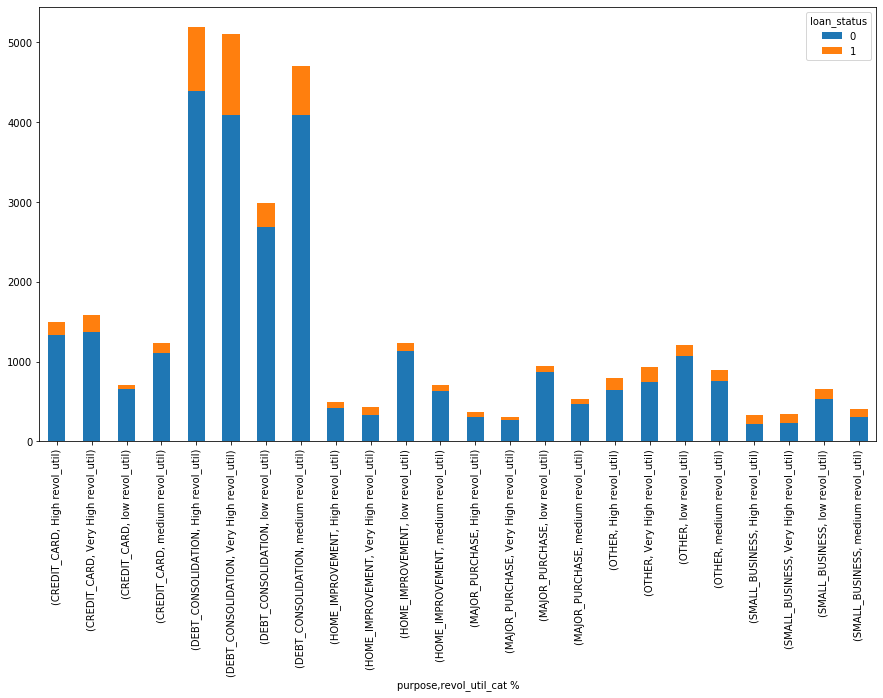

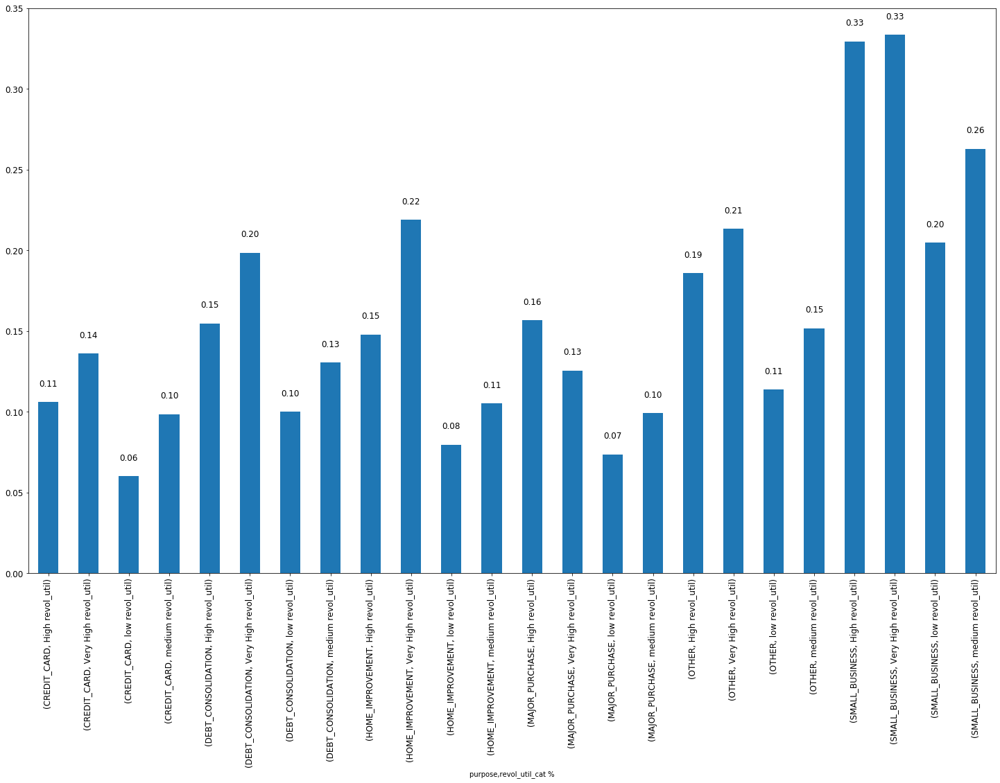

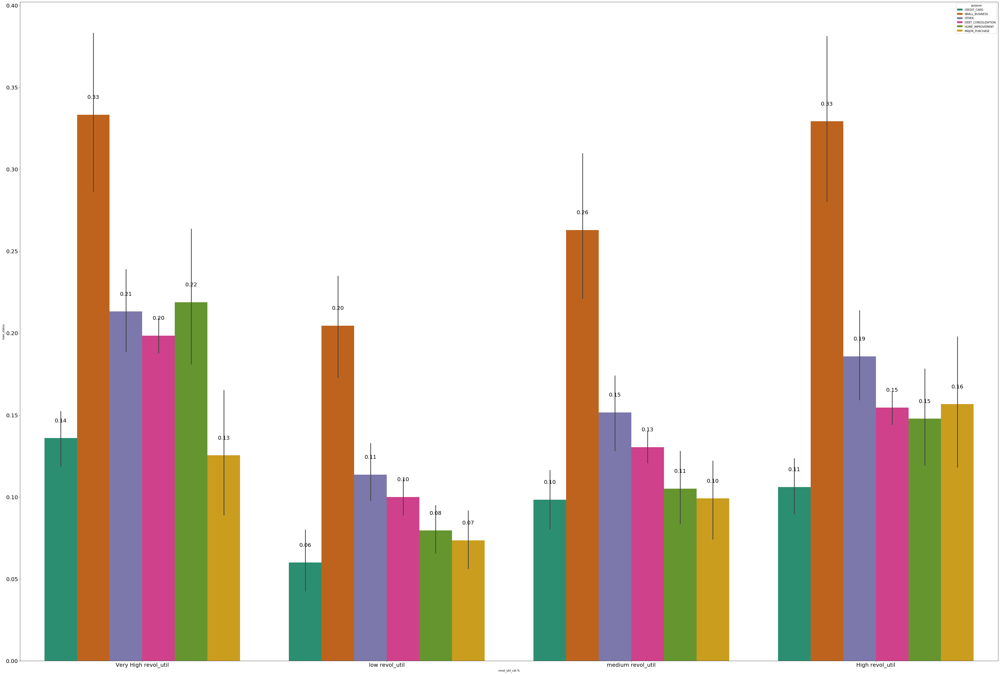

In [282]:
bivariant_plots(cat1 = 'purpose',cat2 = 'revol_util_cat %',plot1 = True ,x1 = 25,y1 = 15,x2 = 65, y2 = 45, axsize1 = 12, spacing1 = 20, axsize2 = 20,spacing2 = 55,Set = 'Dark2' )

### Observation 
- It is observerd that for very rate of revol_utils defaults are quiet high when analysed for different purpose of the loan opted

## Recommendations to Lending Club

#### Safe Loan Applications
- For Weddings, Major Purchases, Car  and Credit Card purposes.
- Loan amount ranging between 5,000  USD and 10,000 USD.
- Annual Income of applicants more  than 1,00,000 USD.
- Calculated interest rate for loan less  than 7.5%.
- Grade A & B.
- Loan applicant is owning a house.
- Loans for 36 months term.


### Risky Loan Applciations
- Loans for purpose of Small Business.
- Loans for loan amount 30,000 USD  	and above.
- Loan applicants annual income  whose 	annual income is less than 25000  	USD.
- Loans having calculated interest rate  	more than 15%.
- Loans in grade E, F & G.
- Loan applicant is either living on rent or mortgage.
- Loans for 60 months term.
